# Deep Learning

> **Copyright Notice**    
>
> This IPython notebook is part of the **Deep Dive into Data Science** training program at Nexteer Automotive.  
> It incorporates materials from **Coursera**'s **Deep Learning Specialization**, **TensorFlow: Advanced Techniques Specialization**, and **Mathematics for Machine Learning and Data Science** Specialization, licensed under the **Creative Commons Attribution-ShareAlike 2.0 (CC BY-SA 2.0)**, as well as other sources (including, but not limited to, enhancements developed with the assistance of generative AI tools).  
> All original content created for this program, and all adaptations of source materials, are the intellectual property of Nexteer Automotive and are licensed under the same **Creative Commons Attribution-ShareAlike 2.0 (CC BY-SA 2.0)** license.

**Main references**:   
* [Deep Learning Specialization - Coursera (CC BY-SA 2.0)](https://www.coursera.org/specializations/deep-learning#courses)  
* [TensorFlow: Advanced Techniques Specialization - Coursera (CC BY-SA 2.0)](https://www.coursera.org/specializations/tensorflow-advanced-techniques) | GitHub repo: [tensorflow-3-public](https://github.com/https-deeplearning-ai/tensorflow-3-public)

## $1.$ Fundamentals

### Working with TensorFlow `Dataset`

**Reference**: [`tf.data.Dataset` TensorFlow official documentation](https://www.tensorflow.org/api_docs/python/tf/data/Dataset)

The `tf.data.Dataset` API supports writing efficient input pipelines. `Dataset` usage follows a common pattern:
1. Create a source dataset from your input data
2. Apply dataset transformations to preprocess the data
3. Iterate over the dataset and process the elements.  

Iteration happens in a *streaming* fashion, so the full dataset does not need to fit into memory!  




In [ ]:
# Code source: tf.data.Dataset - TensorFlow offical documentation
# Link: https://www.tensorflow.org/api_docs/python/tf/data/Dataset

**Source Datasets:**

In [ ]:
import tensorflow as tf

In [ ]:
# define variables
var1 = tf.constant([1])
# var1[0] = 2
# var1

var2 = tf.Variable([1])
var2[0].assign(2)
var2

<tf.Variable 'Variable:0' shape=(1,) dtype=int32, numpy=array([2])>

In [ ]:
# 1. Create a source dataset
dataset = tf.data.Dataset.from_tensor_slices([1, 2, 3, 4, 5])
for element in dataset:
  print(element)

tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(2, shape=(), dtype=int32)
tf.Tensor(3, shape=(), dtype=int32)
tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(5, shape=(), dtype=int32)


In [ ]:
next(dataset.as_numpy_iterator())

1

In [ ]:
# You can use `from_tensors` to produce a dataset which repeats
# the same example many times.
example = tf.constant([1,2,3])
dataset = tf.data.Dataset.from_tensors(example).repeat(2)
list(dataset.as_numpy_iterator())

[array([1, 2, 3]), array([1, 2, 3])]

**Transformations:**  
* `map()`
* `filter()`  
* `apply()`

In [ ]:
dataset = tf.data.Dataset.range(5)
dataset = dataset.map(lambda x: x**2)
list(dataset.as_numpy_iterator())

[0, 1, 4, 9, 16]

In [ ]:
dataset = dataset.filter(lambda x: x < 5)
list(dataset.as_numpy_iterator())

[0, 1, 4]

In [ ]:
def dataset_fn(ds):
  return ds.filter(lambda x: x < 5)

dataset = dataset.apply(dataset_fn)
list(dataset.as_numpy_iterator())

[0, 1, 4]

**Useful Methods:**
* `as_numpy_iterator()`: Returns an iterator which converts all elements of the dataset to numpy  
* `shuffle()`: Randomly shuffles the elements of this dataset
* `cache()`: Caches the elements in this dataset  
* `batch()`:  Combines consecutive elements of this dataset into batches
* `cardinality()`: Returns the number of elements in a dataset

Note: `cache` will produce exactly the same elements during each iteration through the dataset. If you wish to randomize the iteration order, make sure to call `shuffle` after calling `cache`

In [ ]:
dataset = tf.data.Dataset.range(5)
dataset = dataset.map(lambda x: x**2)
dataset = dataset.cache()
# The first time reading through the data will generate the data using
# `range` and `map`
list(dataset.as_numpy_iterator())

# Subsequent iterations read from the cache
list(dataset.as_numpy_iterator())

[0, 1, 4, 9, 16]

In [ ]:
dataset = tf.data.Dataset.range(3)
dataset = dataset.shuffle(3, reshuffle_each_iteration=True)
dataset = dataset.repeat(2)
# [1, 0, 2, 1, 2, 0]

dataset = tf.data.Dataset.range(3)
dataset = dataset.shuffle(3, reshuffle_each_iteration=False)
dataset = dataset.repeat(2)
# [1, 0, 2, 1, 0, 2]

In [ ]:
dataset = tf.data.Dataset.range(5)
dataset = dataset.batch(2)
list(dataset.as_numpy_iterator())

[array([0, 1], dtype=int64),
 array([2, 3], dtype=int64),
 array([4], dtype=int64)]

In [ ]:
dataset = tf.data.Dataset.range(5)
dataset = dataset.batch(2, drop_remainder=True)
list(dataset.as_numpy_iterator())

[array([0, 1], dtype=int64), array([2, 3], dtype=int64)]

In [ ]:
dataset.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=2>

 **Optional Reading**: [Optimising your input pipeline performance with `tf.data`](https://towardsdatascience.com/optimising-your-input-pipeline-performance-with-tf-data-part-1-32e52a30cac4#Prefetching)

### Sequential API

**Reference**: [The Sequential model - TensorFlow offical documentation](https://www.tensorflow.org/guide/keras/sequential_model)

A Sequential model is NOT appropriate when ([more here](https://www.tensorflow.org/guide/keras/sequential_model#when_to_use_a_sequential_model)):

* Your model has multiple inputs or multiple outputs
* Any of your layers has multiple inputs or multiple outputs
* You need to do layer sharing
* You want non-linear topology (e.g. a residual connection, a multi-branch model)

#### Build Model

In [ ]:
# Code source:The Sequential model - TensorFlow offical documentation
# Link: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
import tensorflow as tf

In [ ]:
# Define Sequential model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(2, activation="relu", name="my_dense_layer"),
]) # No weights at this stage!

## At this point, you can't do this:
# model.weights

## You also can't do this:
# model.summary()

# Call the model on a test input
x = tf.ones((1, 4))
y = model(x)
print("Number of weights after calling the model:", len(model.weights))  # 2

Number of weights after calling the model: 2


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 my_dense_layer (Dense)      (1, 2)                    10        
                                                                 
Total params: 10
Trainable params: 10
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.layers

You can also create a Sequential model incrementally via the `add()` method:

In [ ]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(2, activation="relu", input_shape=(4,)))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 2)                 10        
                                                                 


Total params: 10
Trainable params: 10
Non-trainable params: 0
_________________________________________________________________


Models built with a predefined input shape always have weights (even before seeing any data) and always have a defined output shape.

#### Train and Evaluate Model

**Reference**: [Training & evaluation with the built-in methods - TensorFlow offical documentation](https://www.tensorflow.org/guide/keras/training_with_built_in_methods)

In [ ]:
# Code source: Training & evaluation with the built-in methods - TensorFlow offical documentation
# Link: https://www.tensorflow.org/guide/keras/training_with_built_in_methods

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
# Load data
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

# Preprocess the data
x_train = x_train.reshape(60000, 784).astype("float32") / 255   # Images are 28 x 28 = 784 pixels in total
x_test = x_test.reshape(10000, 784).astype("float32") / 255
y_train = y_train.astype("float32")
y_test = y_test.astype("float32")

# Reserve 10,000 samples for validation
x_val = x_train[-10000:]
y_val = y_train[-10000:]
x_train = x_train[:-10000]
y_train = y_train[:-10000]

In [ ]:
# Build model
model = tf.keras.Sequential([
    tf.keras.Input(shape=(784,), name="digits"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(10, activation="softmax", name="predictions"),
])

Specify the training configuration (optimizer, loss, metrics). Built-in optimizers, losses, and metrics:  
* Optimizers:
    - `SGD()` (with or without momentum)
    - `RMSprop()`
    - `Adam()`
    - etc.

* Losses:
    - `MeanSquaredError()`
    - `KLDivergence()`
    - `CosineSimilarity()`
    - etc.

* Metrics:
    - `AUC()`
    - `Precision()`
    - `Recall()`
    - etc.

In [ ]:
model.compile(
    # Optimizer
    optimizer = tf.keras.optimizers.RMSprop(),
    # Loss function to minimize
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    # List of metrics to monitor
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy()],
)

Call `fit()` method, which will train the model by slicing the data into "batches" of size
`batch_size`, and repeatedly iterating over the entire dataset for a given number of
`epochs`.

In [ ]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=10
)

Epoch 1/10
782/782 [==============================] - 2s 2ms/step - loss: 0.3571 - sparse_categorical_accuracy: 0.8978
Epoch 2/10
782/782 [==============================] - 2s 2ms/step - loss: 0.1634 - sparse_categorical_accuracy: 0.9518
Epoch 3/10
782/782 [==============================] - 1s 2ms/step - loss: 0.1186 - sparse_categorical_accuracy: 0.9649
Epoch 4/10
782/782 [==============================] - 1s 2ms/step - loss: 0.0944 - sparse_categorical_accuracy: 0.9716
Epoch 5/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0793 - sparse_categorical_accuracy: 0.9758
Epoch 6/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0655 - sparse_categorical_accuracy: 0.9800
Epoch 7/10
782/782 [==============================] - 1s 2ms/step - loss: 0.0570 - sparse_categorical_accuracy: 0.9827
Epoch 8/10
782/782 [==============================] - 1s 2ms/step - loss: 0.0498 - sparse_categorical_accuracy: 0.9851
Epoch 9/10
782/782 [============================

In [ ]:
test_loss, test_acc = model.evaluate(x_val,
                                     y_val, verbose=2)

print('\nTest accuracy:', test_acc)

313/313 - 0s - loss: 0.1111 - sparse_categorical_accuracy: 0.9717 - 491ms/epoch - 2ms/step

Test accuracy: 0.9717000126838684


Could be done all at once:

In [ ]:
history = model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=10,
    # We pass some validation for
    # monitoring validation loss and metrics
    # at the end of each epoch
    validation_data=(x_val, y_val),
)

Epoch 1/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0345 - sparse_categorical_accuracy: 0.9891 - val_loss: 0.1080 - val_sparse_categorical_accuracy: 0.9721
Epoch 2/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0306 - sparse_categorical_accuracy: 0.9908 - val_loss: 0.1137 - val_sparse_categorical_accuracy: 0.9726
Epoch 3/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0252 - sparse_categorical_accuracy: 0.9919 - val_loss: 0.1164 - val_sparse_categorical_accuracy: 0.9748
Epoch 4/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0232 - sparse_categorical_accuracy: 0.9926 - val_loss: 0.1170 - val_sparse_categorical_accuracy: 0.9739
Epoch 5/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0205 - sparse_categorical_accuracy: 0.9935 - val_loss: 0.1534 - val_sparse_categorical_accuracy: 0.9693
Epoch 6/10
782/782 [==============================] - 2s 2ms/step - loss: 0.0184 - sparse_categorica

In [ ]:
history.history.keys()

dict_keys(['loss', 'sparse_categorical_accuracy', 'val_loss', 'val_sparse_categorical_accuracy'])

In [ ]:
acc = history.history['sparse_categorical_accuracy']
val_acc = history.history['val_sparse_categorical_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

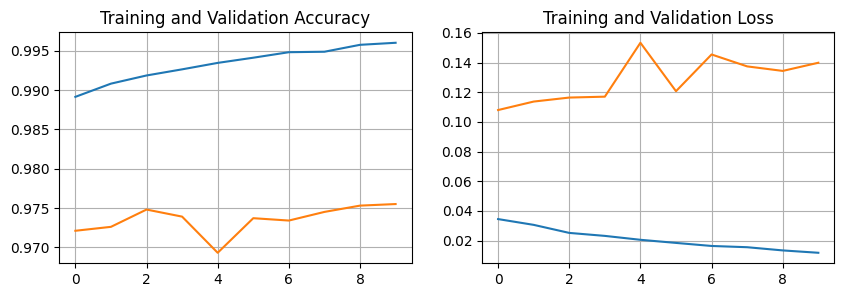

In [ ]:
epochs_range = range(10)

plt.figure(figsize=(10, 3))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.grid(True)
plt.show()

### Optimization Algorithms

**Reference:** [Deep Learning Specialization, Improving Deep Neural Network - Coursera](https://www.coursera.org/learn/deep-neural-network?utm_medium=sem&utm_source=gg&utm_campaign=B2C_NAMER_deep-learning_deeplearning-ai_FTCOF_specializations_country-US-country-CA&campaignid=904733485&adgroupid=148411448815&device=c&keyword=&matchtype=&network=g&devicemodel=&adposition=&creativeid=654837734386&hide_mobile_promo&gad_source=1&gclid=CjwKCAjw1emzBhB8EiwAHwZZxbNEmTzZo-KHk8pbHhG7JMvyTDoe9OZgZjBz1r5BRp5XCuWyetcjBRoCQWYQAvD_BwE)

* Exponentially Weighted Moving Average:  

    $\nu_t = \beta \times \nu_{t-1} + (1 - \beta) \times \theta_t$      
    * Bias Correction: $\frac{\nu_t}{1 - \beta^{t}}$  

* Optimization Algorithms:  

    0. Gradient Descent (GD)  

        $W^{[l]} = W^{[l]} - \alpha \text{ } dW^{[l]}$  
        $b^{[l]} = b^{[l]} - \alpha \text{ } db^{[l]}$   

        * Batch Gradient Descent:
            * Each epoch trains on entire dataset (all $n$ examples)
            * If dataset is small, use Batch GD
        * Mini-Batch Gradient Descent:  
            * Each epoch trains on $1 < m < n$ examples in the dataset updating GD parameters ${t}$ times in one epoch  
            * Typical mini-batch sizes are 64, 128, 256, 512 ($2^6, 2^7, etc.$)
            * Make sure mini-batch fits in CPU/GPU memory  
        * Stochastic Gradient Descent:  
            * Each epoch trains on $1$ example in the dataset updating GD parameters ${n}$ times in one epoch  

    1. GD with Momentum:   
        * Exponentially Weighted Moving Average integrated to GD  

        $\nu_{dw} = \beta \times \nu_{dw} + (1 - \beta) \times dW$  
        $\nu_{db} = \beta \times \nu_{db} + (1 - \beta) \times db$   
        
       - Updates:  

        $W := W - \alpha \times \nu_{dw}$  
        $b := b - \alpha \times \nu_{db}$  

        - Common value for $\beta: 0.9$

    2. RMSprop:
        * Intuition: Don't move in that direction if error is large!  

        $S_{dw} = \beta \times S_{dw} + (1 - \beta) \times dW^2$  
        $S_{db} = \beta \times S_{db} + (1 - \beta) \times db^2$  
        
       - Updates:   
          
        $W := W - \alpha \times \frac{dW}{\sqrt{S_{dw} + \varepsilon}}$  
        $b := b - \alpha \times \frac{db}{\sqrt{S_{db} + \varepsilon}}$  
        
    3. Adam (Adaptive Momentum Estimation)
        * Combines Momentum and RMSprop (should include bais correction)  

        $\nu_{dw} = \beta_1 \times \nu_{dw} + (1 - \beta_1) \times dW$  
        $\nu_{db} = \beta_1 \times \nu_{db} + (1 - \beta_1) \times db$  

        $S_{dw} = \beta_2 \times S_{dw} + (1 - \beta_2) \times dW^2$  
        $S_{db} = \beta_2 \times S_{db} + (1 - \beta_2) \times db^2$  

        - Bais Correction:   

        $\nu_{dw}^{corrected} = \frac{\nu_{dw}}{1 - \beta_1^{t}}$  
        $\nu_{db}^{corrected} = \frac{\nu_{dw}}{1 - \beta_1^{t}}$  

        $S_{dw}^{corrected} = \frac{S_{dw}}{1 - \beta_2^{t}}$  
        $S_{db}^{corrected} = \frac{S_{db}}{1 - \beta_2^{t}}$  

        - Updates:  

        $W := W - \alpha \times \frac{V_{dw}^{corrected}}{(\sqrt{S_{dw}}) + \varepsilon}$  
        $b := b - \alpha \times \frac{V_{db}^{corrected}}{(\sqrt{S_{db}}) + \varepsilon}$

        - Common values
            * $\beta_1: 0.9$
            * $\beta_2: 0.999$
            * $\varepsilon: 10^{-8}$    

* Learning Rate Decay  
    * Decay on every iteration: $\alpha = \frac{1}{1 + decayRate \times epochNumber} \alpha_{0}$  
    * Fixed Interval Scheduling: $\alpha = \frac{1}{1 + decayRate \times \lfloor\frac{epochNum}{timeInterval}\rfloor} \alpha_{0}$

* Learn more: [Understanding Deep Learning Optimizers: Momentum, AdaGrad, RMSProp & Adam](https://towardsdatascience.com/understanding-deep-learning-optimizers-momentum-adagrad-rmsprop-adam-e311e377e9c2)

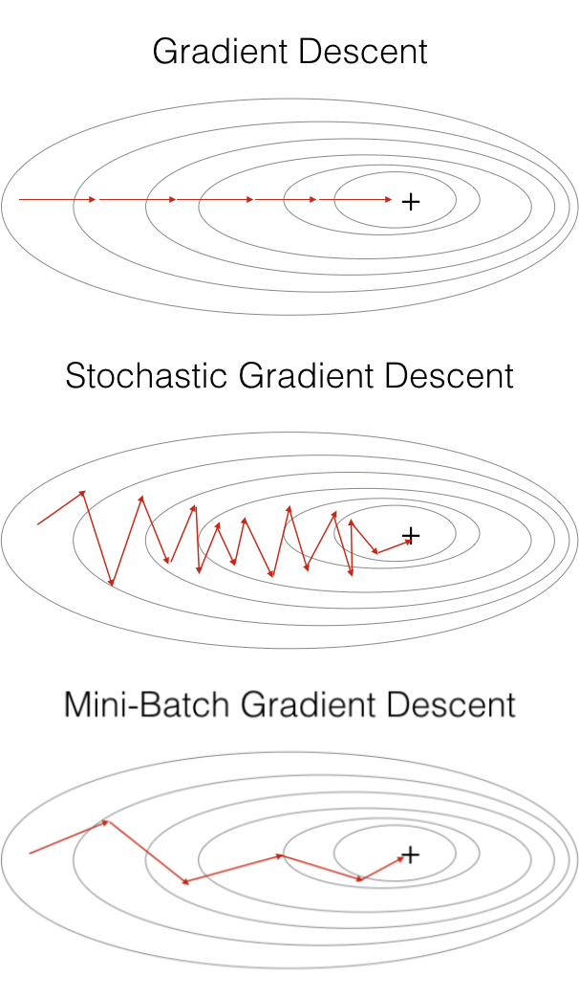

Image source: [Batch vs Mini-batch vs Stochastic Gradient Descent with Code Examples](https://medium.datadriveninvestor.com/batch-vs-mini-batch-vs-stochastic-gradient-descent-with-code-examples-cd8232174e14)

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Image

Image(url="https://cs231n.github.io/assets/nn3/opt1.gif")


Image source: [Stanford - CS231n Convolutional Neural Networks for Visual Recognition](https://cs231n.github.io/neural-networks-3/)

### Model Development

#### Process

**Reference:** [DeepLearning.AI - Improving Deep Neural Network](https://www.coursera.org/learn/deep-neural-network?utm_medium=sem&utm_source=gg&utm_campaign=B2C_NAMER_deep-learning_deeplearning-ai_FTCOF_specializations_country-US-country-CA&campaignid=904733485&adgroupid=148411448815&device=c&keyword=&matchtype=&network=g&devicemodel=&adposition=&creativeid=654837734386&hide_mobile_promo&gad_source=1&gclid=CjwKCAjw1emzBhB8EiwAHwZZxbNEmTzZo-KHk8pbHhG7JMvyTDoe9OZgZjBz1r5BRp5XCuWyetcjBRoCQWYQAvD_BwE)

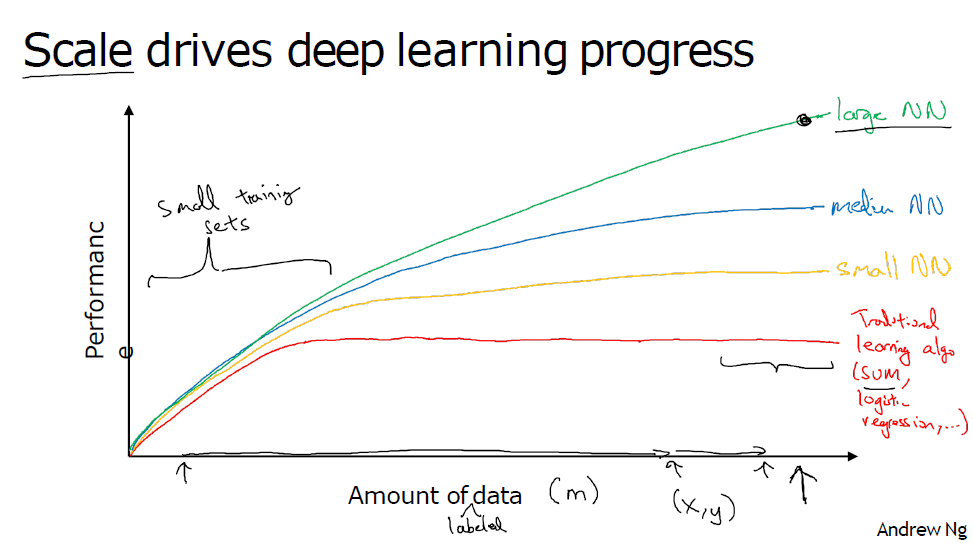

Image source: [Neural Networks and Deep Learning](https://www.coursera.org/learn/neural-networks-deep-learning?specialization=deep-learning)

**Model Development Process (according to Andrew Ng)**:  
1. Split the data
    * Classical $70-30$% (`train-test`) or $60-20-20$% (`train-dev-test`)
    * Big data:
        * $98-1-1$%
        * $99.5-0.4-0.1$%
2. Normalize input data
3. Understand bias and variance
    * Bias:  `train` set error
    * Variance:  Diff. between `train` set error and `dev` set error
4. Follow the basic recipe:
    1. First, deal with bais:
        * If high:
            * Use bigger network
            * Train longer
            * Search better architectures
    2. Then, deal with variance:
        * If high:
            * Get more data
            * Regularization
            * Search better architectures
5. Regularization
    * $L_2$ (or $L_1$) regularization
    * Dropout
    * Data augmentation
    * Early stopping (couples bias and variance, not recommended)
    * Batch Normalization (*has a slight regularizing effect*)
        * Each mini-batch is scaled by the mean and variance computed on just that mini-batch
        * Applied to each layer of network independently


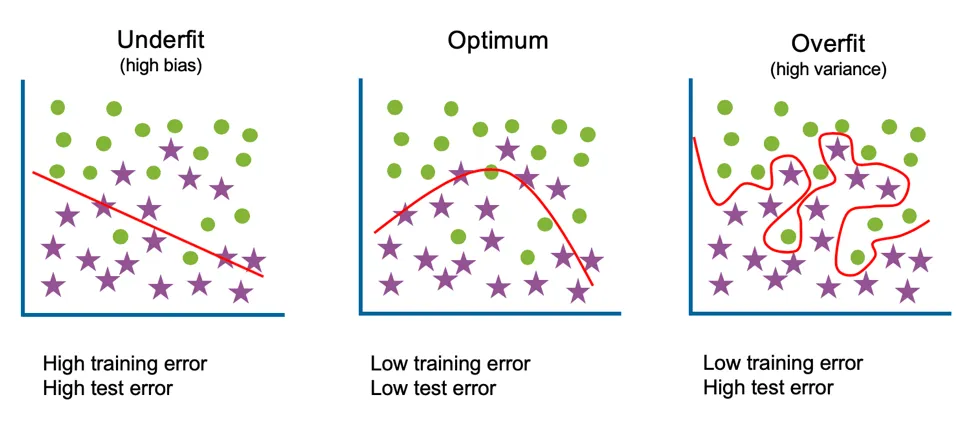

Image source: [Bias-Variance Trade off](https://medium.com/@akheelmohammad4/bias-variance-trade-off-d2a11212a8fa)

#### Hyper-Paramter Tuning & Overfitting

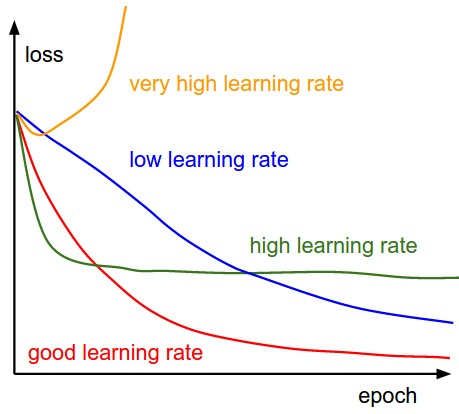  

Image source: [Stanford - CS231n Convolutional Neural Networks for Visual Recognition](https://cs231n.github.io/neural-networks-3/)

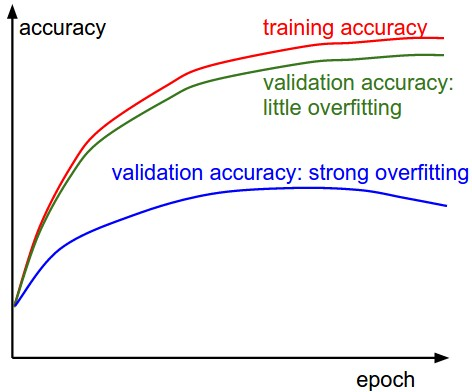  

Image source: [Stanford - CS231n Convolutional Neural Networks for Visual Recognition](https://cs231n.github.io/neural-networks-3/)

### Dense Layers - Intuition

#### Regression

In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf

In [ ]:
def plot_dataset(x, y, title):
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.title(title)
    sns.scatterplot(x=x, y=y)
    plt.show()

def plot_regression_line(x, y, model, title):
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.title(title)
    sns.scatterplot(x=x, y=y)
    sns.lineplot(x=x, y=model.predict(x).flatten(), color='black')
    plt.show()

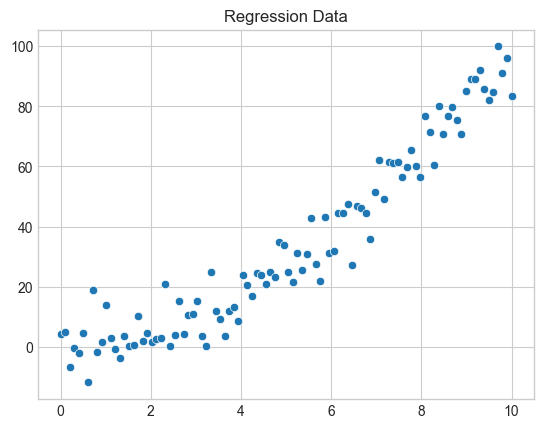

In [ ]:
eps = stats.norm.rvs(loc=0, scale=0.2, size=100) * 30
x = np.linspace(0, 10, 100)
y = x**2 + eps

plot_dataset(x, y, 'Regression Data')

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((x, y))

# Split the dataset into train and test sets
train_dataset = dataset.take(80)
test_dataset = dataset.skip(80)

# Batch the datasets
train_dataset = train_dataset.batch(8)
test_dataset = test_dataset.batch(8)

Note that for regression, no activation is added to the single dense unit in the output layer.

4/4 [==============================] - 0s 2ms/step


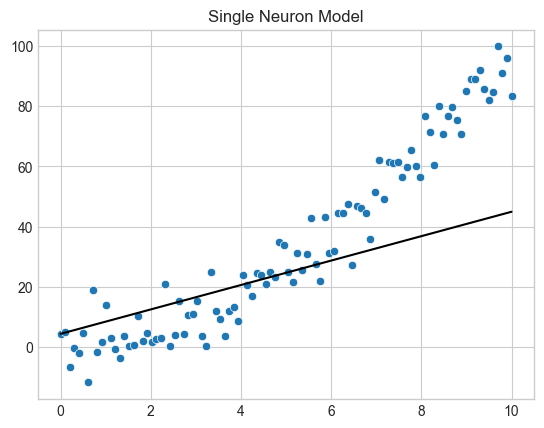

In [ ]:
# Create the model
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(1,)),
    tf.keras.layers.Dense(1)
])

# Compile the model
model.compile(tf.keras.optimizers.Adam(0.01),
              loss='mse',
              metrics=['mse', 'mae'])

# Train the model
model.fit(train_dataset, epochs=100, verbose=0)

# Plot the fit line
plot_regression_line(x, y, model, 'Single Neuron Model')

4/4 [==============================] - 0s 2ms/step


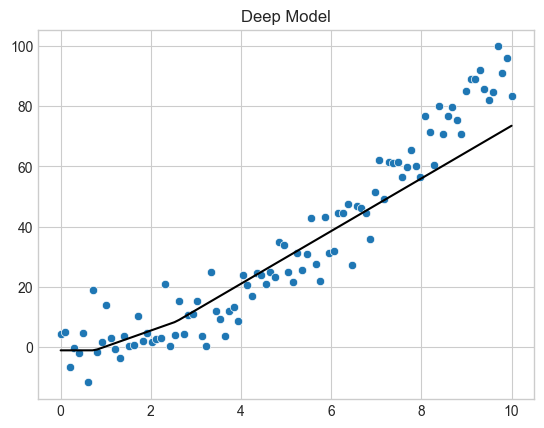

In [ ]:
# Create the model
del model
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(1,)),
    tf.keras.layers.Dense(3, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Compile the model
model.compile(tf.keras.optimizers.Adam(0.01),
              loss='mse',
              metrics=['mse', 'mae'])

# Train the model
model.fit(train_dataset, epochs=200, verbose=0)

# Plot the fit line
plot_regression_line(x, y, model, 'Deep Model')

#### Classification

In [ ]:
import numpy as np
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt
from sklearn import datasets as sk_datasets

import tensorflow as tf

In [ ]:
def plot_sk_dataset(dataset, dataset_name):
    plt.style.use('seaborn-v0_8-whitegrid')
    sns.scatterplot(x=dataset[0][:, 0], y=dataset[0][:, 1], hue=dataset[1].flatten(), palette='deep')
    plt.title(dataset_name)
    plt.show()

def plot_decision_boundary(X, y, model, steps=100):
    """
    Plots the decision boundary and data points of a model.
    Data points are colored based on their actual label.
    """
    cmap = sns.diverging_palette(250, 30, l=60, center="light", as_cmap=True)

    # Define region of interest by data limits
    xmin, xmax = X[:,0].min() - 1, X[:,0].max() + 1
    ymin, ymax = X[:,1].min() - 1, X[:,1].max() + 1
    x_span = np.linspace(xmin, xmax, steps)
    y_span = np.linspace(ymin, ymax, steps)
    xx, yy = np.meshgrid(x_span, y_span)

    # Make predictions across region of interest
    labels = model.predict(np.c_[xx.ravel(), yy.ravel()])

    # Plot decision boundary in region of interest
    z = labels.reshape(xx.shape)

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots()
    ax.contourf(xx, yy, z, cmap=cmap, alpha=0.5, linestyles = ["dashed", "solid", "dashed"])

    # Get predicted labels on training data and plot
    train_labels = model.predict(X)
    ax.scatter(X[:,0], X[:,1], c=y, cmap=cmap, lw=0)
    plt.title('Decision Boundary')
    plt.show()

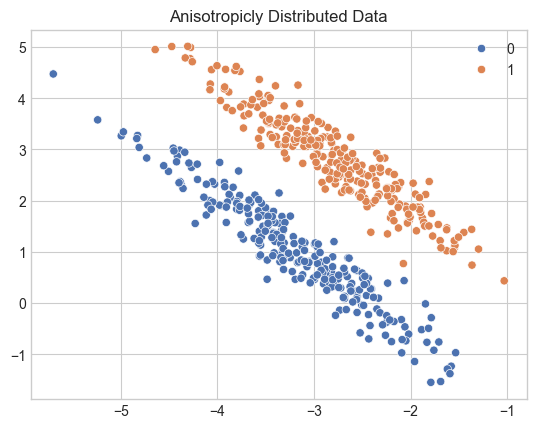

In [ ]:
X, y = sk_datasets.make_blobs(n_samples=500, centers=2, random_state=170)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)
plot_sk_dataset(aniso, 'Anisotropicly Distributed Data')

In [ ]:
# Load the dataset
dataset = tf.data.Dataset.from_tensor_slices(aniso)

# Split the dataset into train and test sets
train_dataset = dataset.take(400).batch(32)
test_dataset = dataset.skip(400).batch(32)

Starting with one `Dense` unit and `sigmoid` as activation function. Observe the change in decision boundry as the number of neurons increases.

In [ ]:
# Create the model
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(train_dataset, epochs=1000, verbose=0)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print('\nTest loss:', test_loss)
print('Test accuracy:', test_accuracy)

4/4 [==============================] - 0s 2ms/step - loss: 0.0591 - accuracy: 1.0000

Test loss: 0.05912751331925392
Test accuracy: 1.0


16/16 [==============================] - 0s 976us/step


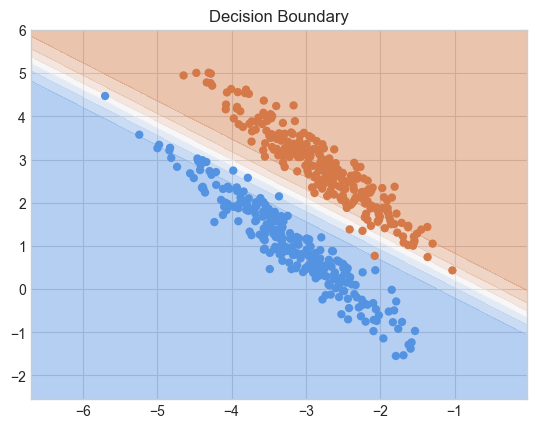

In [ ]:
plot_decision_boundary(aniso[0], aniso[1], model)

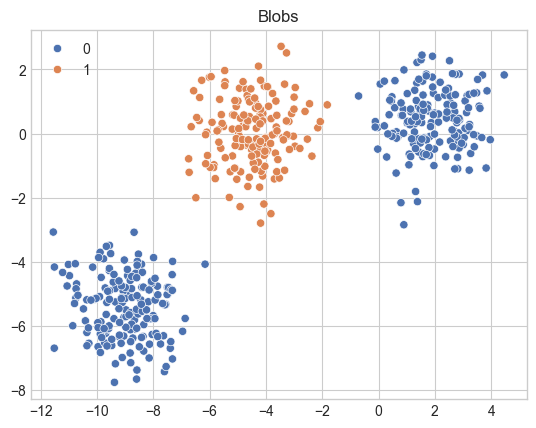

In [ ]:
blobs = sk_datasets.make_blobs(n_samples=500, centers=3, random_state=170)
blobs = (blobs[0], np.apply_along_axis(lambda x: x == 1, 0, blobs[1]).astype(int))
plot_sk_dataset(blobs, 'Blobs')

In [ ]:
# Load the dataset
dataset = tf.data.Dataset.from_tensor_slices(blobs)

# Split the dataset into train and test sets
train_dataset = dataset.take(400).batch(32)
test_dataset = dataset.skip(400).batch(32)

In [ ]:
# Create the model
del model
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(2, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(train_dataset, epochs=1000, verbose=0)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print('\nTest loss:', test_loss)
print('Test accuracy:', test_accuracy)

4/4 [==============================] - 0s 2ms/step - loss: 0.0166 - accuracy: 1.0000

Test loss: 0.016599714756011963
Test accuracy: 1.0


16/16 [==============================] - 0s 928us/step


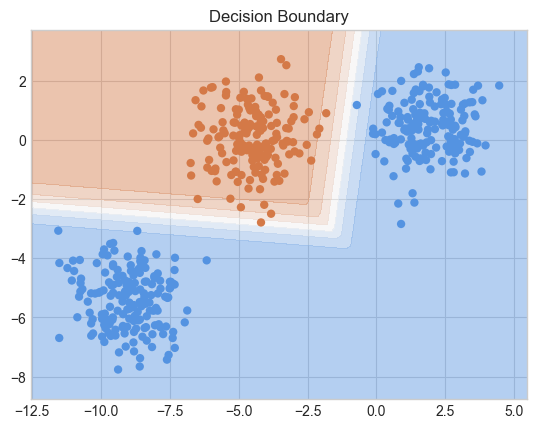

In [ ]:
plot_decision_boundary(blobs[0], blobs[1], model)

#### Image Classification

**Reference**: [Image classification - TensorFlow offical documentation](https://www.tensorflow.org/tutorials/images/classification)

In [ ]:
# Cold source: Image classification - TensorFlow offical documentation
# Link: https://www.tensorflow.org/tutorials/images/classification

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf

In [ ]:
# Helper functions
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img, cmap=plt.cm.binary)
  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'
  plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)

def plot_value_array(i, predictions_array, true_label):
  true_label = true_label[i]
  plt.grid(False)
  plt.xticks(range(10))
  plt.yticks([])
  thisplot = plt.bar(range(10), predictions_array, color="#777777")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)
  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

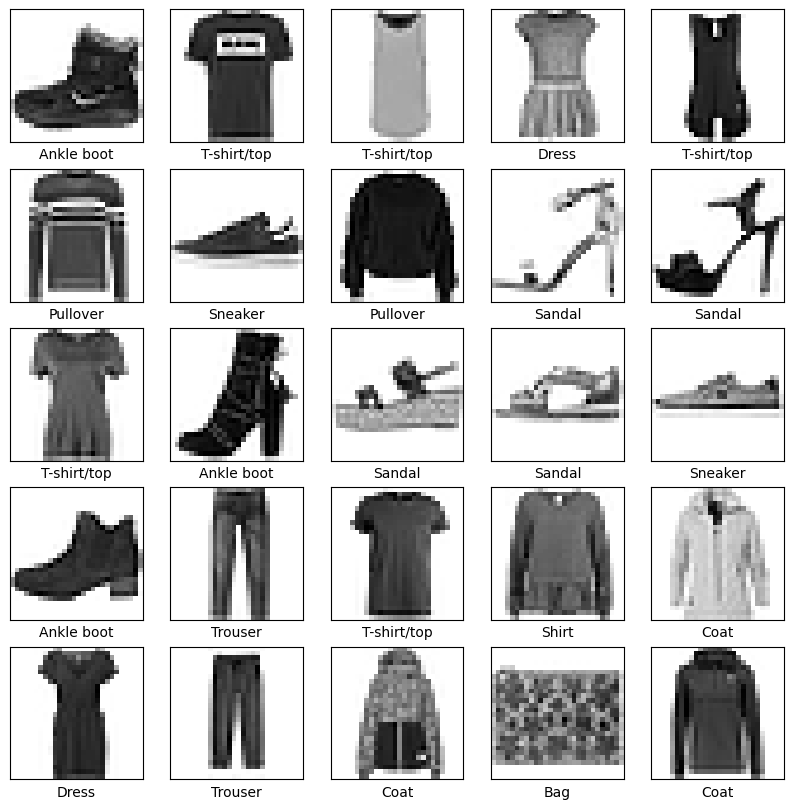

In [ ]:
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

train_images = train_images / 255.0
test_images = test_images / 255.0

class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

model.fit(train_images,
          train_labels,
          batch_size=128,
          epochs=10)

Epoch 1/10
469/469 [==============================] - 3s 5ms/step - loss: 0.5638 - accuracy: 0.8067
Epoch 2/10
469/469 [==============================] - 2s 4ms/step - loss: 0.4135 - accuracy: 0.8551
Epoch 3/10
469/469 [==============================] - 2s 4ms/step - loss: 0.3734 - accuracy: 0.8684
Epoch 4/10
469/469 [==============================] - 2s 4ms/step - loss: 0.3460 - accuracy: 0.8761
Epoch 5/10
469/469 [==============================] - 2s 4ms/step - loss: 0.3305 - accuracy: 0.8816
Epoch 6/10
469/469 [==============================] - 2s 4ms/step - loss: 0.3100 - accuracy: 0.8875
Epoch 7/10
469/469 [==============================] - 2s 5ms/step - loss: 0.2989 - accuracy: 0.8909
Epoch 8/10
469/469 [==============================] - 2s 4ms/step - loss: 0.2859 - accuracy: 0.8961
Epoch 9/10
469/469 [==============================] - 2s 4ms/step - loss: 0.2764 - accuracy: 0.8988
Epoch 10/10
469/469 [==============================] - 2s 3ms/step - loss: 0.2670 - accuracy: 0.9017

313/313 [==============================] - 1s 1ms/step


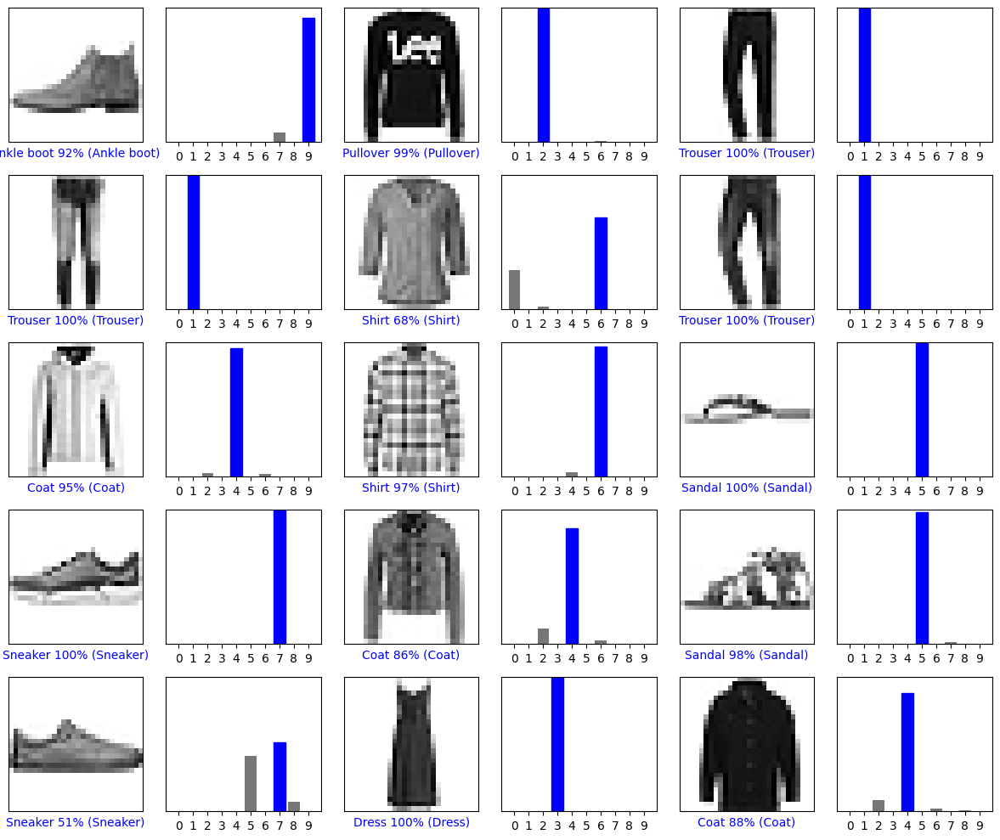

In [ ]:
predictions = model.predict(test_images)

num_rows = 5
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_image(i, predictions[i], test_labels, test_images)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_value_array(i, predictions[i], test_labels)
plt.tight_layout()
plt.show()

### Convolutional Neural Networks (CNNs)




#### Fundamentals

High level intuition:
* Convolution: Location-indepenedent feature detector
* Pooling: Downsampler
* Fully connected: Classifier
* Convolved image is the $W^{[l]} \times a^{[l]}$ term in the equation $Relu(W^{[l]}a^{[l]} + b^{[l]}) $

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Image

Image(url="https://miro.medium.com/v2/resize:fit:640/format:webp/1*1okwhewf5KCtIPaFib4XaA.gif")

GIF source: [An Introduction to different Types of Convolutions in Deep Learning](https://towardsdatascience.com/types-of-convolutions-in-deep-learning-717013397f4d)

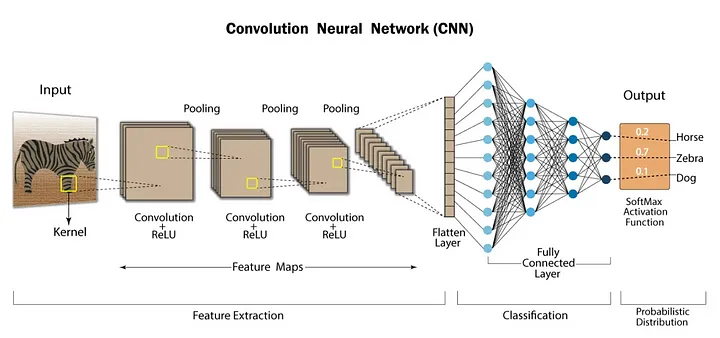

Image source: [Developers Breach](https://developersbreach.com/convolution-neural-network-deep-learning/)

In [ ]:
# Cold source: Convolutional Neural Network (CNN) - TensorFlow offical documentation
# Link: https://www.tensorflow.org/tutorials/images/cnn

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()

# Normalize pixel values to be between 0 and 1
train_images, test_images = train_images / 255.0, test_images / 255.0

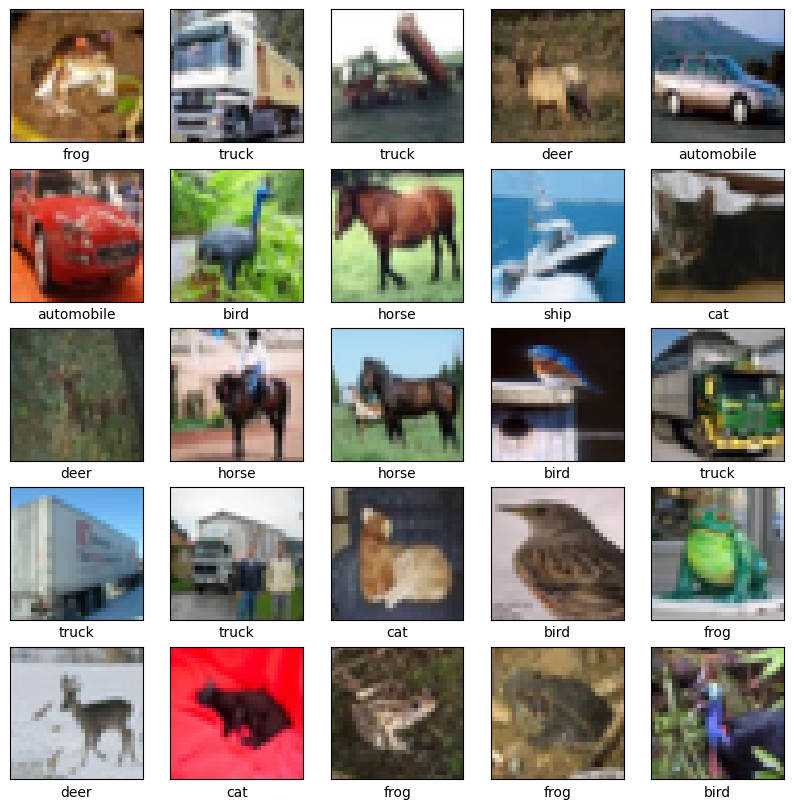

In [ ]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    # The CIFAR labels happen to be arrays,
    # which is why you need the extra index
    plt.xlabel(class_names[train_labels[i][0]])
plt.show()

In [ ]:
model = tf.keras.models.Sequential([
    # Conv layers for learning
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    # FC layers for classification
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(10)
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 16, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 5, 64)          36928     
                                                                 
 flatten (Flatten)           (None, 1600)              0

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

EPOCHS = 10
history = model.fit(train_images, train_labels,
                    epochs=EPOCHS,
                    validation_data=(test_images, test_labels))

Epoch 1/10
1563/1563 [==============================] - 22s 13ms/step - loss: 1.5452 - accuracy: 0.4335 - val_loss: 1.2857 - val_accuracy: 0.5399
Epoch 2/10
1563/1563 [==============================] - 19s 12ms/step - loss: 1.1965 - accuracy: 0.5724 - val_loss: 1.0978 - val_accuracy: 0.6107
Epoch 3/10
1563/1563 [==============================] - 18s 12ms/step - loss: 1.0436 - accuracy: 0.6301 - val_loss: 1.0694 - val_accuracy: 0.6252
Epoch 4/10
1563/1563 [==============================] - 20s 13ms/step - loss: 0.9485 - accuracy: 0.6699 - val_loss: 0.9588 - val_accuracy: 0.6614
Epoch 5/10
1563/1563 [==============================] - 22s 14ms/step - loss: 0.8804 - accuracy: 0.6917 - val_loss: 0.9628 - val_accuracy: 0.6695
Epoch 6/10
1563/1563 [==============================] - 21s 14ms/step - loss: 0.8224 - accuracy: 0.7107 - val_loss: 0.9042 - val_accuracy: 0.6867
Epoch 7/10
1563/1563 [==============================] - 21s 13ms/step - loss: 0.7771 - accuracy: 0.7271 - val_loss: 0.9142 -

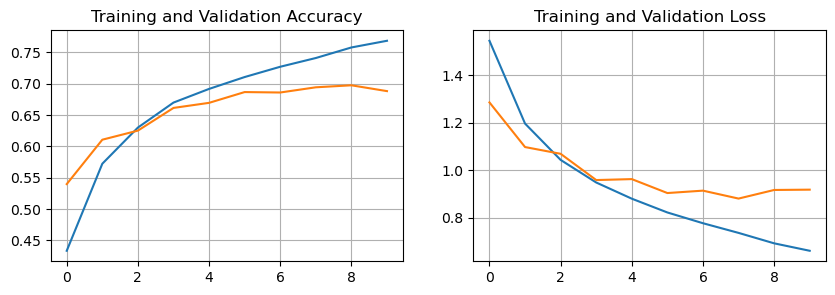

In [ ]:
epochs_range = range(EPOCHS)

plt.figure(figsize=(10, 3))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, history.history['accuracy'], label='Training Accuracy')
plt.plot(epochs_range, history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epochs_range, history.history['loss'], label='Training Loss')
plt.plot(epochs_range, history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.grid(True)
plt.show()

#### Fully Convolutional Network

**Reference**: [TensorFlow: Advanced Techniques Specialization - Coursera](https://www.coursera.org/specializations/tensorflow-advanced-techniques)

Advantages of fully convolutional implementation:
* Reduced model size
* Less compute power

In [ ]:
model = tf.keras.models.Sequential([
    # Conv layers for learning
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),

    # Replace FC layers with Conv2D and downsample with MaxPooling2D
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (2, 2), activation='relu'),
    tf.keras.layers.Conv2D(10, (1, 1), activation='relu'),
    tf.keras.layers.Flatten()
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 15, 15, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 64)          36928     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 2, 2, 64)        

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

EPOCHS = 1
history = model.fit(train_images, train_labels,
                    epochs=EPOCHS,
                    validation_data=(test_images, test_labels))

1563/1563 [==============================] - 21s 13ms/step - loss: 2.0938 - accuracy: 0.2575 - val_loss: 1.8679 - val_accuracy: 0.3736


### Recurrent Neural Networks (RNNs)


#### Fundamentals

Built-in RNN layers in Keras:

1. `keras.layers.SimpleRNN`, a fully-connected RNN where the output from previous timestep is to be fed to next timestep

2. `keras.layers.GRU`, first proposed in
[Cho et al., 2014](https://arxiv.org/abs/1406.1078)

3. `keras.layers.LSTM`, first proposed in
[Hochreiter & Schmidhuber, 1997](https://www.bioinf.jku.at/publications/older/2604.pdf)

Reference: [Working with RNNs - TensorFlow official documentation](https://www.tensorflow.org/guide/keras/working_with_rnns)

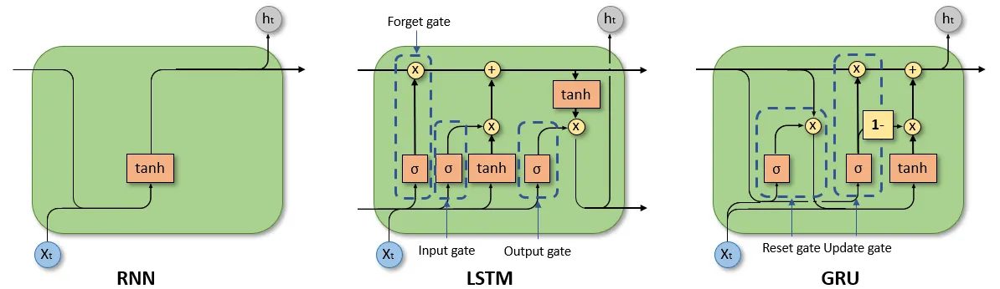

Image source: [A Brief Introduction to Recurrent Neural Networks](https://towardsdatascience.com/a-brief-introduction-to-recurrent-neural-networks-638f64a61ff4)

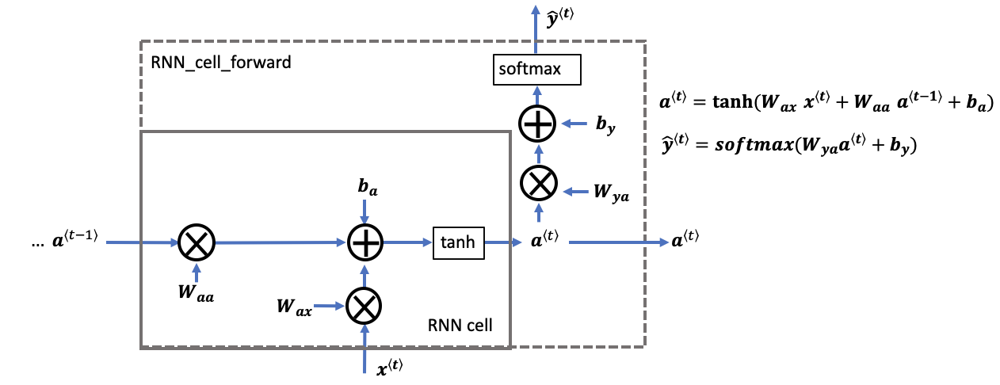

Image source: [Sequence Models -  DeepLearning.AI](https://www.coursera.org/learn/nlp-sequence-models?utm_medium=sem&utm_source=gg&utm_campaign=B2C_NAMER_deep-learning_deeplearning-ai_FTCOF_specializations_country-US-country-CA&campaignid=904733485&adgroupid=148411448815&device=c&keyword=&matchtype=&network=g&devicemodel=&adposition=&creativeid=654837734386&hide_mobile_promo&gad_source=1&gclid=CjwKCAjwnei0BhB-EiwAA2xuBibxTkryLv30lKz8weQ43XBotM8VPqVIn28xlprOxNJ2IVAs4pHklBoCM2IQAvD_BwE)


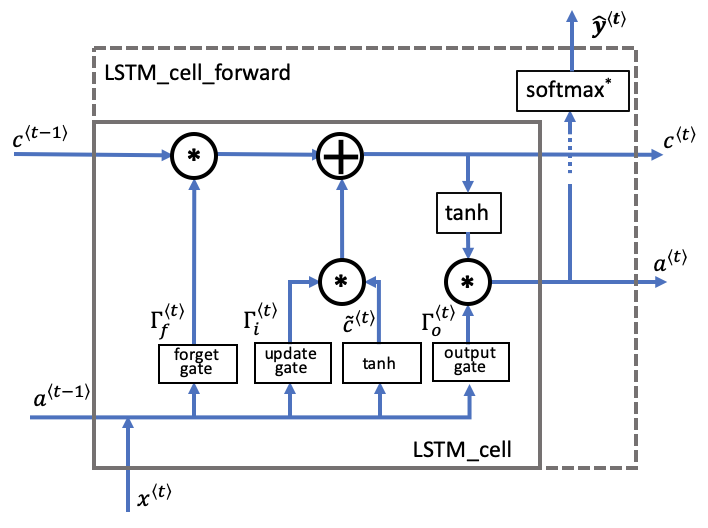

Image source: [Sequence Models -  DeepLearning.AI](https://www.coursera.org/learn/nlp-sequence-models?utm_medium=sem&utm_source=gg&utm_campaign=B2C_NAMER_deep-learning_deeplearning-ai_FTCOF_specializations_country-US-country-CA&campaignid=904733485&adgroupid=148411448815&device=c&keyword=&matchtype=&network=g&devicemodel=&adposition=&creativeid=654837734386&hide_mobile_promo&gad_source=1&gclid=CjwKCAjwnei0BhB-EiwAA2xuBibxTkryLv30lKz8weQ43XBotM8VPqVIn28xlprOxNJ2IVAs4pHklBoCM2IQAvD_BwE)

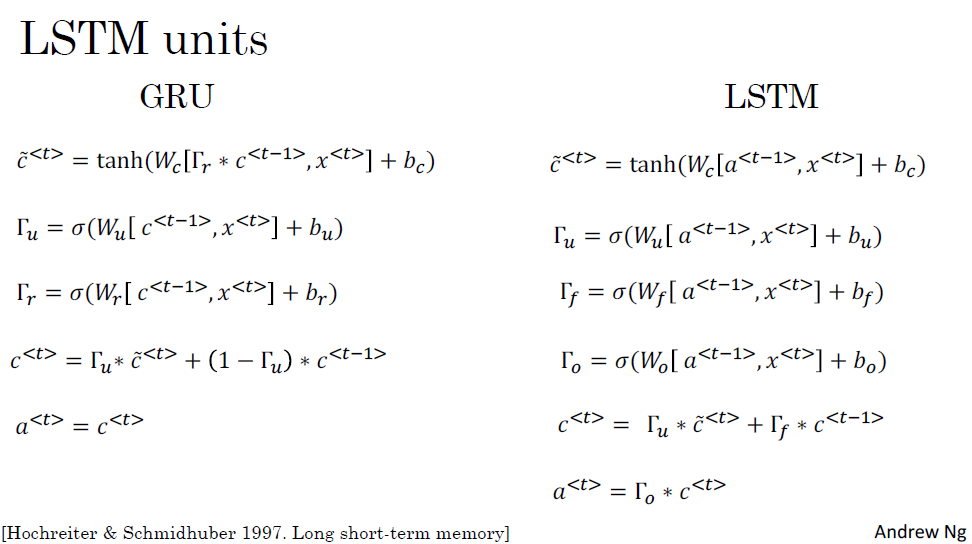

#### Single Unit - Intuition

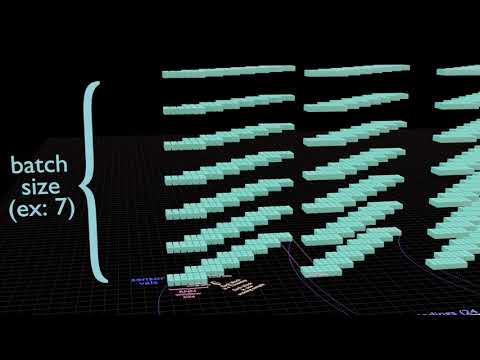

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('D6vxZ5KMD18', width=800, height=500)

In [ ]:
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import tensorflow as tf
import tensorflow_datasets as tfds

In [ ]:
# Code source: Intro to Autoencoders - Tensorflow official documentation
# Link: https://www.tensorflow.org/tutorials/generative/autoencoder#third_example_anomaly_detection

def min_max_scaler(train_df, test_df):
    min_val = tf.reduce_min(train_df)
    max_val = tf.reduce_max(train_df)
    # scale to [0, 1]
    train_data = (train_df - min_val) / (max_val - min_val)
    test_data = (test_df - min_val) / (max_val - min_val)
    # cast to float
    train_data = tf.cast(train_data, tf.float32)
    test_data = tf.cast(test_data, tf.float32)
    return train_data, test_data

def load_normalize_data():
    # download the dataset
    df = pd.read_csv('http://storage.googleapis.com/download.tensorflow.org/data/ecg.csv', header=None)
    raw_data = df.values
    # last elements as labels
    labels = raw_data[:, -1]
    data = raw_data[:, 0:-1]
    # split the data
    train_data, test_data, train_labels, test_labels = train_test_split(
        data, labels, test_size=0.2, random_state=21)
    # normalize the data to [0,1]
    train_data, test_data = min_max_scaler(train_data, test_data)
    return train_data, test_data, train_labels, test_labels

def plot_signal(signal, title, color='black'):
    length = len(signal)
    plt.figure(figsize=(8, 3))
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.plot(np.arange(length), signal, color=color)
    plt.grid(True)
    plt.title(title)
    plt.show()

def window_sequence(arr, seq_length, shift):
    return tf.stack([arr[i:i+seq_length] for i in range(0, len(arr)+1-seq_length, shift)])

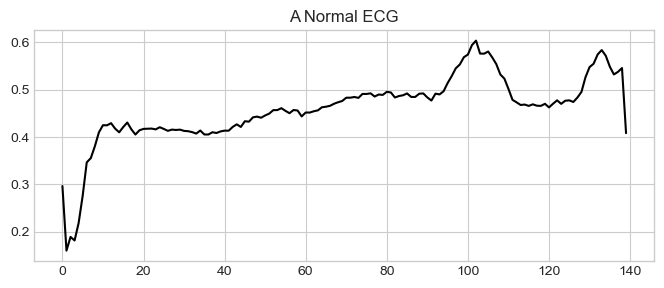

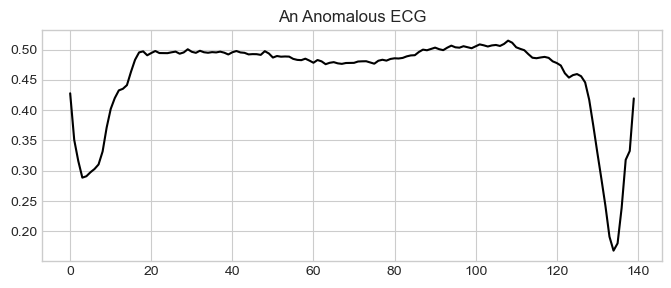

In [ ]:
train_data, test_data, train_labels, test_labels = load_normalize_data()

# plot normal and anomalous ECG exmples
plot_signal(train_data[np.where(train_labels == 1)[0][-1]], "A Normal ECG")
plot_signal(train_data[np.where(train_labels == 0)[0][-1]], "An Anomalous ECG")

In [ ]:
# specify window length and shift
example_length = train_data.shape[1]
win_length = 10
shift = 5

# split into windows & create a tf.data.Dataset object
train_data_ds = tf.data.Dataset.from_tensor_slices(train_data).map(lambda x: window_sequence(x, win_length, shift))
test_data_ds = tf.data.Dataset.from_tensor_slices(test_data).map(lambda x: window_sequence(x, win_length, shift))

train_labels_ds = tf.data.Dataset.from_tensor_slices(train_labels.astype(int))
test_labels_ds = tf.data.Dataset.from_tensor_slices(test_labels.astype(int))

train_ds = tf.data.Dataset.zip((train_data_ds, train_labels_ds)).batch(64)
test_ds = tf.data.Dataset.zip((test_data_ds, test_labels_ds)).batch(64)

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(1, input_shape=(None, win_length), name='LSTM'),
    tf.keras.layers.Dense(1, activation='sigmoid', name='Classifier')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 LSTM (LSTM)                 (None, 1)                 48        
                                                                 
 Classifier (Dense)          (None, 1)                 2         
                                                                 
Total params: 50
Trainable params: 50
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

EPOCHS = 100
history = model.fit(train_ds,
          epochs=EPOCHS,
          validation_data=test_ds,
          verbose=0)

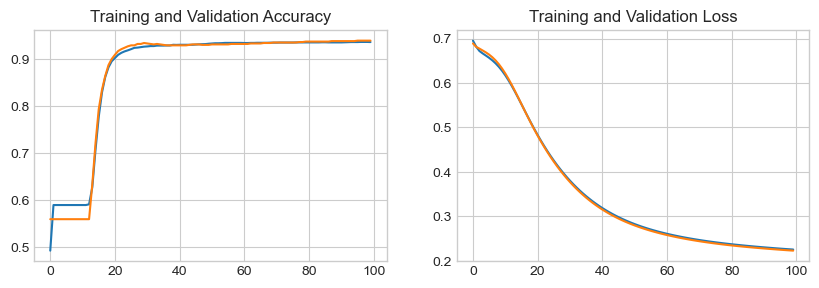

In [ ]:
epochs_range = range(EPOCHS)

plt.figure(figsize=(10, 3))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, history.history['accuracy'], label='Training Accuracy')
plt.plot(epochs_range, history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epochs_range, history.history['loss'], label='Training Loss')
plt.plot(epochs_range, history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.grid(True)
plt.show()

#### Image Classification with LSTM!

**Reference**: [Working with RNNs - TensorFlow offical documentation](https://www.tensorflow.org/guide/keras/working_with_rnns)

In [ ]:
# Code source: Working with RNNs - TensorFlow offical documentation
# Link: https://www.tensorflow.org/guide/keras/working_with_rnns

In [ ]:
import tensorflow as tf

import numpy as np
import matplotlib.pyplot as plt

In [ ]:
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0
sample, sample_label = x_train[0], y_train[0]

In [ ]:
# Each MNIST image batch is a tensor of shape (batch_size, 28, 28).
# Each input sequence will be of size (28, 28) (height is treated like time).
input_dim = 28

# Build model
model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, input_dim)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(10),  # labels are from 0 to 9
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                23808     
                                                                 
 batch_normalization (BatchN  (None, 64)               256       
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 10)                650       
                                                                 
Total params: 24,714
Trainable params: 24,586
Non-trainable params: 128
_________________________________________________________________


In [ ]:
model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer="adam",
    metrics=["accuracy"],
)

model.fit(x_train, y_train,
          validation_data=(x_test, y_test),
          batch_size=128,
          epochs=10)

Epoch 1/10
469/469 [==============================] - 7s 12ms/step - loss: 0.4692 - accuracy: 0.8516 - val_loss: 0.1587 - val_accuracy: 0.9512
Epoch 2/10
469/469 [==============================] - 5s 11ms/step - loss: 0.1280 - accuracy: 0.9608 - val_loss: 0.1068 - val_accuracy: 0.9662
Epoch 3/10
469/469 [==============================] - 6s 12ms/step - loss: 0.0922 - accuracy: 0.9711 - val_loss: 0.0723 - val_accuracy: 0.9768
Epoch 4/10
469/469 [==============================] - 6s 12ms/step - loss: 0.0723 - accuracy: 0.9772 - val_loss: 0.0670 - val_accuracy: 0.9799
Epoch 5/10
469/469 [==============================] - 6s 12ms/step - loss: 0.0616 - accuracy: 0.9808 - val_loss: 0.0889 - val_accuracy: 0.9705
Epoch 6/10
469/469 [==============================] - 6s 12ms/step - loss: 0.0520 - accuracy: 0.9837 - val_loss: 0.0552 - val_accuracy: 0.9832
Epoch 7/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0460 - accuracy: 0.9858 - val_loss: 0.0589 - val_accuracy: 0.9800

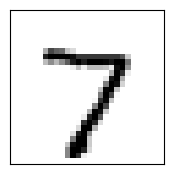

In [ ]:
plt.figure(figsize=(2,2))
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(x_test[0], cmap=plt.cm.binary)
plt.show()

In [ ]:
# model prediction
np.argmax(model.predict(x_test[:1]))

1/1 [==============================] - 0s 356ms/step


7

## $2.$ Computer Vision

**Main Reference**: [Deep Learning Specialization - Coursera](https://www.coursera.org/specializations/deep-learning#courses)

### Functional API

With functional API, you can build models with:
* Multiple inputs or multiple outputs
* Shared layers or layers with multiple inputs or multiple outputs
* Non-linear architecture (e.g. a residual connection, a multi-branch model)  

> Syntax: `new_layer(args)(previous_layer)`

Reworking the example from Sequential API using Functional API:

In [ ]:
import tensorflow as tf

In [ ]:
# sequential model
model = tf.keras.Sequential([
    tf.keras.Input(shape=(784,), name="digits"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(10, activation="softmax", name="predictions"),
])

In [ ]:
# functional model
inputs = tf.keras.Input(shape=(784,))
x = tf.keras.layers.Dense(64, activation="relu")(inputs)
x = tf.keras.layers.Dense(64, activation="relu")(x)
outputs = tf.keras.layers.Dense(10, activation="softmax")(x)
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 784)]             0         
                                                                 
 dense_2 (Dense)             (None, 64)                50240     
                                                                 
 dense_3 (Dense)             (None, 64)                4160      
                                                                 
 dense_4 (Dense)             (None, 10)                650       
                                                                 
Total params: 55,050
Trainable params: 55,050
Non-trainable params: 0
_________________________________________________________________


### Deep CNNs - Case Studies

**Reference**: [Deep Learning Specialization](https://www.coursera.org/specializations/deep-learning#courses)

* Multi-input and multi-output models
* Deep and very deep CNNs
* Inception module
* Residual networks
* CNN for edge devices


##### Wide &amp; Deep Models

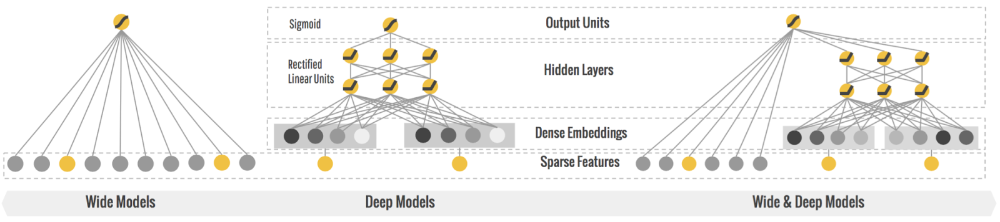

Image source: [Wide &amp; Deep Learning](https://research.google/blog/wide-amp-deep-learning-better-together-with-tensorflow/)

In [ ]:
import tensorflow as tf

In [ ]:
# Define the inputs
wide_input = tf.keras.Input(shape=(100,), name='Wide Input')
deep_input = tf.keras.Input(shape=(10,), name='Deep Input')

# Wide network
wide_net = tf.keras.layers.Dense(units=16, activation='relu')(wide_input)

# Deep network
deep_net = tf.keras.layers.Dense(units=64, activation='relu')(deep_input)
deep_net = tf.keras.layers.Dense(units=16, activation='relu')(deep_net)

# Concatenate wide and deep networks
merged = tf.keras.layers.concatenate([wide_net, deep_net])

# Output layer
output = tf.keras.layers.Dense(units=1, activation='sigmoid')(merged)

# Create model
model = tf.keras.Model(inputs=[wide_input, deep_input], outputs=output)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Deep Input (InputLayer)        [(None, 10)]         0           []                               
                                                                                                  
 Wide Input (InputLayer)        [(None, 100)]        0           []                               
                                                                                                  
 dense_1 (Dense)                (None, 64)           704         ['Deep Input[0][0]']             
                                                                                                  
 dense (Dense)                  (None, 16)           1616        ['Wide Input[0][0]']             
                                                                                              

##### AlexNet

* Deep CNNs  

Original paper: [ImageNet Classification with Deep Convolutional Neural Networks](https://papers.nips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf)

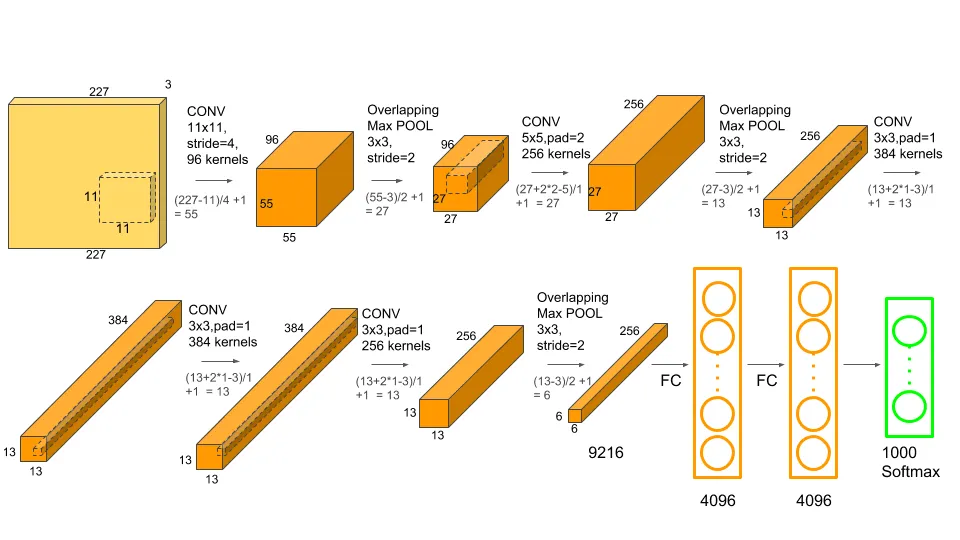

Image source: [Alex-net explanation and implementation in TensorFlow and Keras](https://medium.com/@syedsajjad62/alex-net-explanation-and-implementation-in-tensorflow-and-keras-8047efeb7a0f)

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
def AlexNet():
    inputs = tf.keras.Input(shape=(227,227,3))

    x = tf.keras.layers.Conv2D(96, kernel_size=(11, 11), strides=(4, 4), activation='relu')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

    x = tf.keras.layers.Conv2D(256, kernel_size=(5, 5), strides=(1, 1), padding='same', activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

    x = tf.keras.layers.Conv2D(384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Conv2D(384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Conv2D(256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)

    output = tf.keras.layers.Dense(1000, activation='softmax')(x)

    model = tf.keras.Model(inputs=inputs, outputs=output, name='AlexNet')
    model.summary()

    return model

In [ ]:
model = AlexNet()

Model: "AlexNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 227, 227, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 55, 55, 96)        34944     
                                                                 
 batch_normalization (Batch  (None, 55, 55, 96)        384       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 27, 27, 96)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 27, 27, 256)       614656    
                                                                 
 batch_normalization_1 (Bat  (None, 27, 27, 256)       1024

170498071/170498071 [==============================] - 11s 0us/step


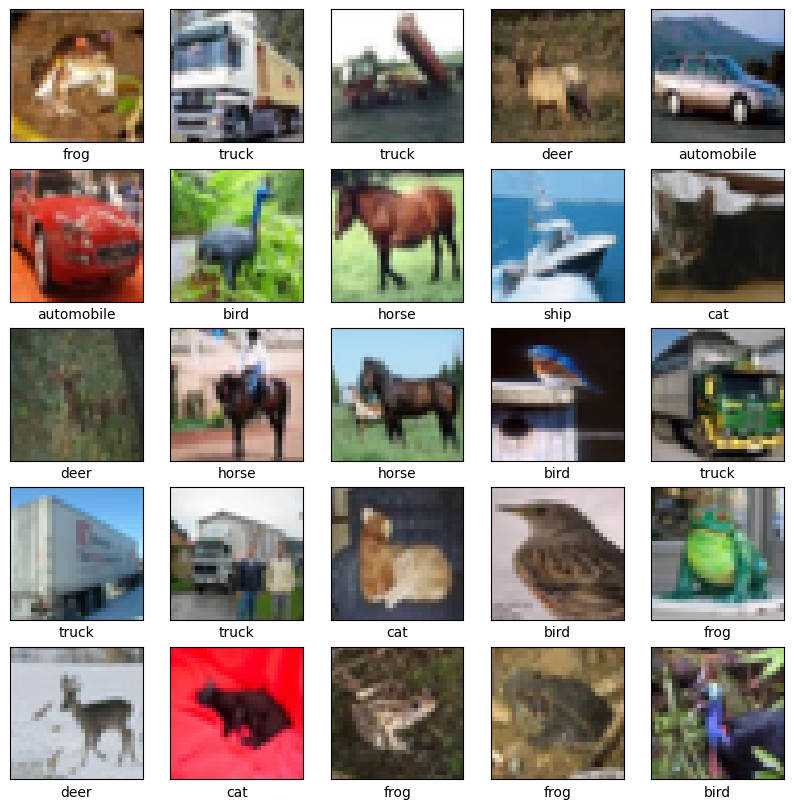

In [ ]:
# Cold source: Convolutional Neural Network (CNN) - TensorFlow offical documentation
# Link: https://www.tensorflow.org/tutorials/images/cnn

train_dataset, test_dataset = tf.keras.datasets.cifar10.load_data()

train_images, train_labels = train_dataset
test_images, test_labels = test_dataset

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    plt.xlabel(class_names[train_labels[i][0]])
plt.show()

In [ ]:
# code by Kolla Ananta Raj
def process_image(image,label):
    image=tf.image.per_image_standardization(image)
    image=tf.image.resize(image,(227,227))
    return image,label

In [ ]:
train_batches = tf.data.Dataset.from_tensor_slices(train_dataset).map(process_image).batch(32)
test_batches = tf.data.Dataset.from_tensor_slices(test_dataset).map(process_image).batch(32)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_batches,
          epochs=1,
          validation_data=test_batches)

1563/1563 [==============================] - 5649s 4s/step - loss: 1.3667 - accuracy: 0.5372 - val_loss: 1.0899 - val_accuracy: 0.6186


##### VGG-16

* Very Deep CNNs  

Original paper: [Very Deep Convolutional Networks for Large-Scale Image Recognition](https://arxiv.org/abs/1409.1556)

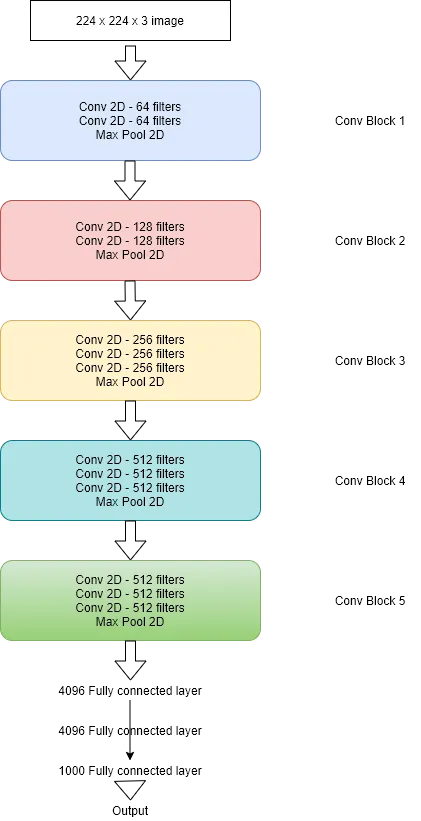

Image source: [Creating VGG from Scratch using Tensorflow](https://towardsdatascience.com/creating-vgg-from-scratch-using-tensorflow-a998a5640155)

In [ ]:
import tensorflow as tf

In [ ]:
def conv_block(block_inputs, repititions, filters):
    x = block_inputs
    layers = [tf.keras.layers.Conv2D(filters, kernel_size=3, padding='same', activation='relu')
              for _ in range(repititions)]
    for layer in layers:
        x = layer(x)
    block_output = tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='same')(x)
    return block_output

In [ ]:
def VGG16(num_classes=1000):
    inputs = tf.keras.Input(shape=(227, 227, 3))
    x = inputs
    for filters, repititions in zip([64, 128, 256, 512, 512], [2, 2, 3, 3, 3]):
        x = conv_block(x, repititions, filters)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs, name='VGG16')
    model.summary()
    return model

In [ ]:
model = VGG16()

Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 227, 227, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 227, 227, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 227, 227, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 114, 114, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 114, 114, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 114, 114, 128)     147584    
                                                             

In [ ]:
# Code source: Convolutional Neural Network (CNN) - TensorFlow offical documentation
# Link: https://www.tensorflow.org/tutorials/images/cnn

train_dataset, test_dataset = tf.keras.datasets.cifar10.load_data()

train_images, train_labels = train_dataset
test_images, test_labels = test_dataset

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

In [ ]:
# code by Kolla Ananta Raj
def process_image(image,label):
    image=tf.image.per_image_standardization(image)
    image=tf.image.resize(image,(227,227))
    return image,label

In [ ]:
train_batches = tf.data.Dataset.from_tensor_slices(train_dataset).map(process_image).batch(32)
test_batches = tf.data.Dataset.from_tensor_slices(test_dataset).map(process_image).batch(32)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_batches,
          epochs=1,
          validation_data=test_batches) # ETA: 3:41:07!

##### Inception

* Inception module: Parallelizing convolution layers $ $
    * Running different filter sizes in parallel branches
    *  $1 \times 1$ convolution to change filter sizes
    * Balancing (weighting) the number of filters coming from different branches

Original paper: [Going Deeper with Convolutions](https://arxiv.org/pdf/1409.4842)

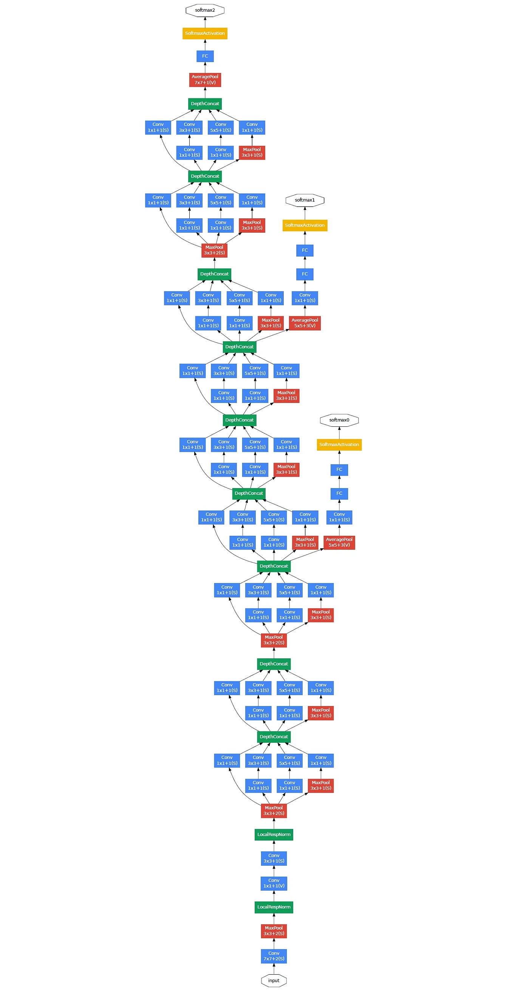


Image source: [Going Deeper with Convolutions](https://arxiv.org/pdf/1409.4842)

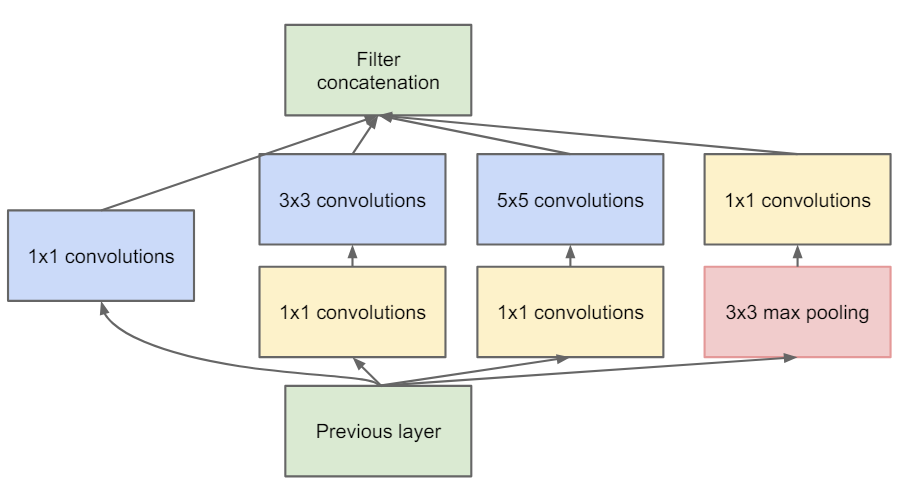

Image source: [Going Deeper with Convolutions](https://arxiv.org/pdf/1409.4842)

In [ ]:
# Code source: Understand GoogLeNet (Inception v1) and Implement it easily from scratch using Tensorflow and Keras
# Link: https://nitishkumarpilla.medium.com/understand-googlenet-inception-v1-and-implement-it-easily-from-scratch-using-tensorflow-and-keras-5404239f361

In [ ]:
import tensorflow as tf

In [ ]:
def inception_module(input_layer):
    cov_1x1_branch = tf.keras.layers.Conv2D(64, (1, 1), activation='relu')(input_layer)

    cov_3x3_branch = tf.keras.layers.Conv2D(96, (1, 1), padding='same', activation='relu')(input_layer)
    cov_3x3_branch = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(cov_3x3_branch)

    cov_5x5_branch = tf.keras.layers.Conv2D(16, (1, 1), activation='relu')(input_layer)
    cov_5x5_branch = tf.keras.layers.Conv2D(32, (5, 5), padding='same', activation='relu')(cov_5x5_branch)

    max_pool_branch = tf.keras.layers.MaxPool2D((3, 3), strides=(1, 1), padding='same')(input_layer)
    max_pool_branch = tf.keras.layers.Conv2D(32, (1, 1), activation='relu')(max_pool_branch)

    return tf.keras.layers.concatenate([cov_1x1_branch, cov_3x3_branch, cov_5x5_branch, max_pool_branch], axis=-1)

In [ ]:
def Mini_Inception():
    inputs = tf.keras.Input(shape=(227, 227, 3))

    x = tf.keras.layers.Conv2D(64, (1, 1), strides=(2, 2), activation='relu')(inputs)
    x = tf.keras.layers.MaxPool2D((3, 3), strides=(2, 2), padding='same')(x)

    for i in range(3):
        x = inception_module(x)

    x = tf.keras.layers.AveragePooling2D((7, 7), strides=(1, 1), padding='same')(x)
    x = tf.keras.layers.Conv2D(128, (1, 1), padding='same', activation='relu')(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(1024, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    outputs = tf.keras.layers.Dense(10, activation='softmax')(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
model = Mini_Inception()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 227, 227, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 114, 114, 64  256         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 57, 57, 64)   0           ['conv2d[0][0]']                 
                                                                                              

In [ ]:
# Cold source: Convolutional Neural Network (CNN) - TensorFlow offical documentation
# Link: https://www.tensorflow.org/tutorials/images/cnn

train_dataset, test_dataset = tf.keras.datasets.cifar10.load_data()

train_images, train_labels = train_dataset
test_images, test_labels = test_dataset

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

In [ ]:
# code by Kolla Ananta Raj
def process_image(image,label):
    image=tf.image.per_image_standardization(image)
    image=tf.image.resize(image,(227,227))
    return image,label

In [ ]:
train_batches = tf.data.Dataset.from_tensor_slices(train_dataset).map(process_image).batch(32)
test_batches = tf.data.Dataset.from_tensor_slices(test_dataset).map(process_image).batch(32)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_batches,
          epochs=1,
          validation_data=test_batches) # ETA: 2:13:41!

##### ResNet-50

* Residual/skip connection to learn *identity function*
    * Resolving the depth issue in neural networks

Original paper: [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385)

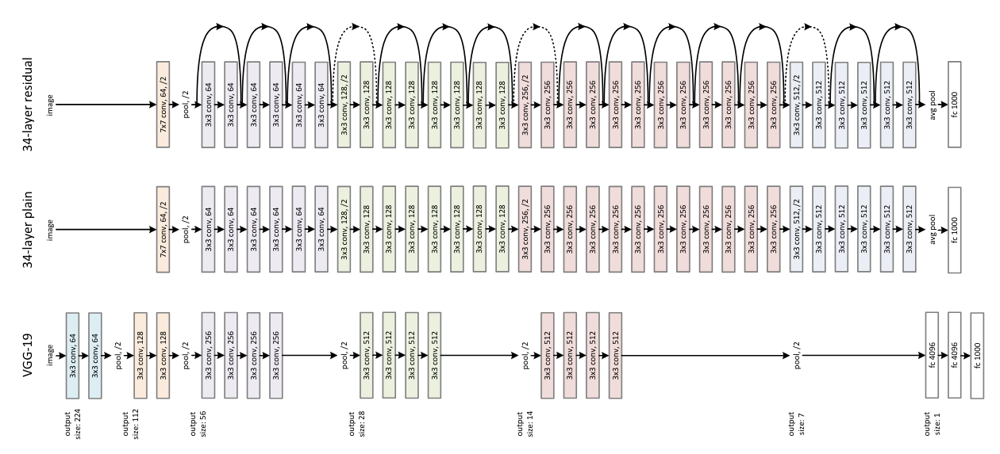

Image source: [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385)

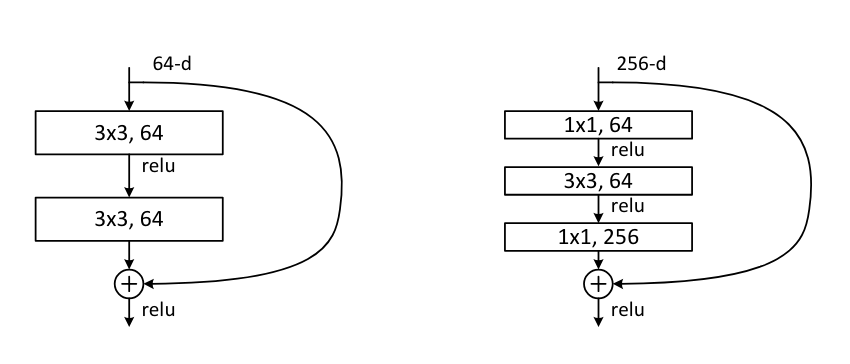

Image source: [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385)

In [ ]:
import tensorflow as tf

In [ ]:
# Code source: DeepLearning.AI - Convolutional Neural Networks
# Link : https://www.coursera.org/learn/convolutional-neural-networks?specialization=deep-learning

def identity_block(inputs):
    # First convolutional layer
    x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(inputs)
    x = tf.keras.layers.BatchNormalization(axis=3)(x)
    x = tf.keras.layers.Activation('relu')(x)

    # second convolutional layer
    x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(x)
    x = tf.keras.layers.BatchNormalization(axis=3)(x)
    x = tf.keras.layers.Activation('relu')(x)

    # skip connection
    if inputs.shape[-1] != 64:
        inputs = tf.keras.layers.Conv2D(64, (1, 1), padding='same', kernel_initializer='he_normal')(inputs)
    x = tf.keras.layers.add([x, inputs])

    # final activation
    outputs = tf.keras.layers.Activation('relu')(x)

    return outputs

In [ ]:
def Mini_ResNet():
    inputs = tf.keras.Input(shape=(227, 227, 3))
    x = inputs

    for i in range(3):
        x = identity_block(x)

    x = tf.keras.layers.AveragePooling2D((7, 7), strides=(2, 2), padding='same')(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(100, activation='relu')(x)
    outputs = tf.keras.layers.Dense(10, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs, name='ResNet')

    return model

In [ ]:
model = Mini_ResNet()
model.summary()

Model: "ResNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 227, 227, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_7 (Conv2D)              (None, 227, 227, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_6 (BatchNo  (None, 227, 227, 64  256        ['conv2d_7[0][0]']               
 rmalization)                   )                                                            

In [ ]:
# Cold source: Convolutional Neural Network (CNN) - TensorFlow offical documentation
# Link: https://www.tensorflow.org/tutorials/images/cnn

train_dataset, test_dataset = tf.keras.datasets.cifar10.load_data()

train_images, train_labels = train_dataset
test_images, test_labels = test_dataset

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

In [ ]:
# code by Kolla Ananta Raj
def process_image(image,label):
    image=tf.image.per_image_standardization(image)
    image=tf.image.resize(image,(227,227))
    return image,label

In [ ]:
train_batches = tf.data.Dataset.from_tensor_slices(train_dataset).map(process_image).batch(32)
test_batches = tf.data.Dataset.from_tensor_slices(test_dataset).map(process_image).batch(32)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_batches,
          epochs=1,
          validation_data=test_batches) # ETA: 5:40:47!

##### MobileNet

* Depthwise seperable convolution
* MobileNet V2 architecture  

Original paper: [MobileNetV2: Inverted Residuals and Linear Bottlenecks](https://arxiv.org/pdf/1801.04381)

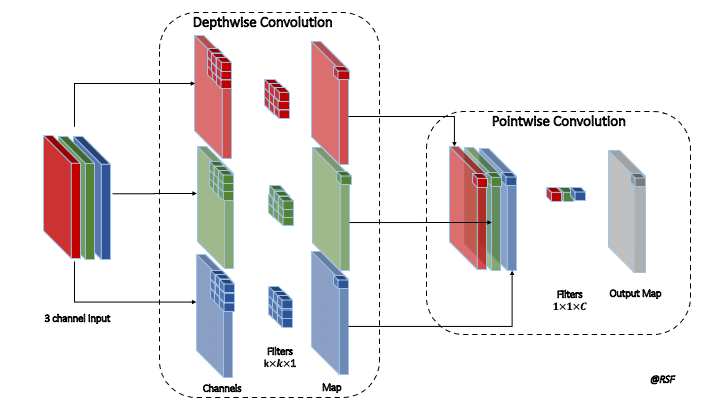

Image source: [An Efficient Multi-Level Convolutional Neural Network Approach for White Blood Cells Classification](https://www.mdpi.com/2075-4418/12/2/248)

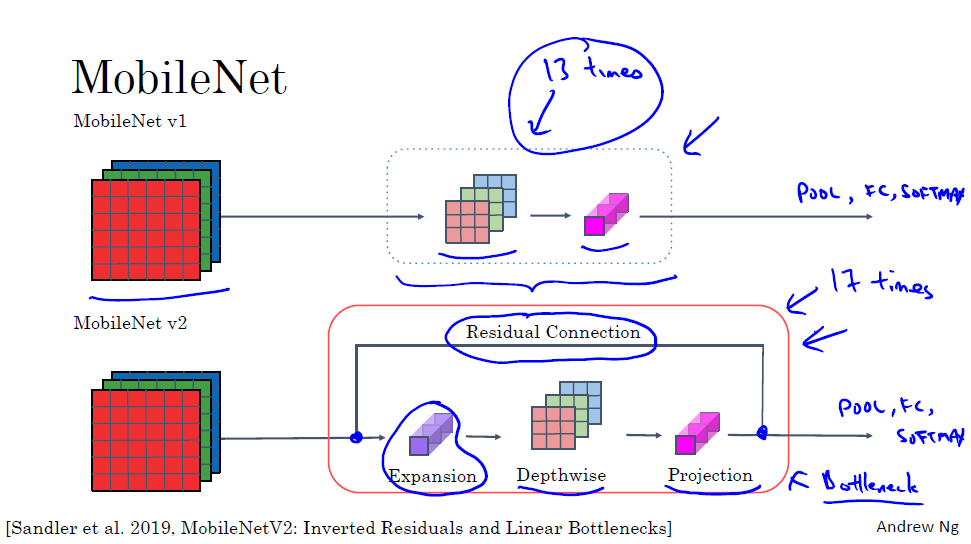

Image source: [DeepLearning.AI - Convolutional Neural Networks](https://www.coursera.org/learn/convolutional-neural-networks)

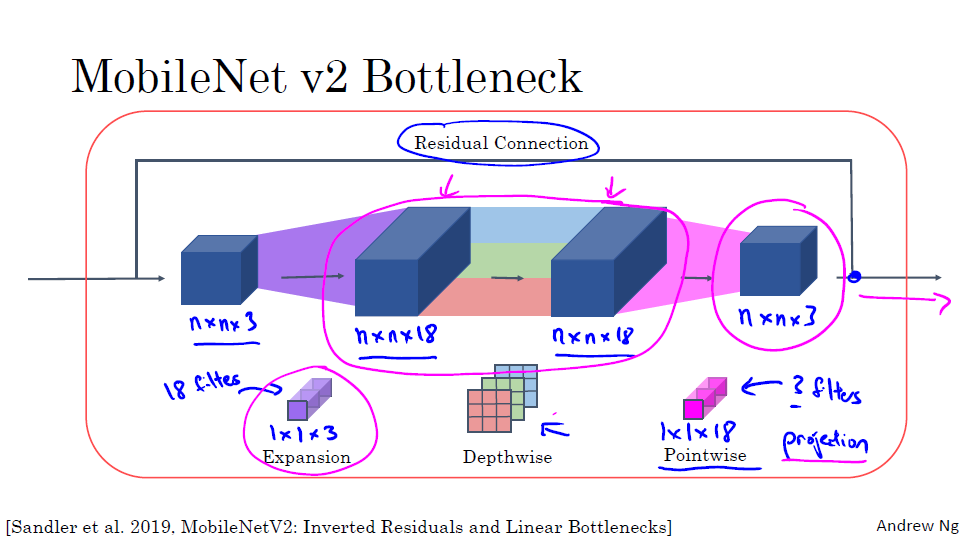


Image source: [DeepLearning.AI - Convolutional Neural Networks](https://www.coursera.org/learn/convolutional-neural-networks)

In [ ]:
import tensorflow as tf

In [ ]:
# Code source: Creating MobileNetsV2 with TensorFlow from scratch
# Link: https://medium.com/analytics-vidhya/creating-mobilenetsv2-with-tensorflow-from-scratch-c85eb8605342

def bottle_neck(input_layer):
    short_cut = input_layer

    # expansion
    x = tf.keras.layers.Conv2D(filters=18, kernel_size=1, padding='same')(input_layer)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    # depthwise conv
    x = tf.keras.layers.DepthwiseConv2D(kernel_size=3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    # pointwise conv i.e., projection
    x = tf.keras.layers.Conv2D(filters=3, kernel_size=1, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)

    # residual connection
    x = tf.keras.layers.Add()([short_cut, x])
    outputs = tf.keras.layers.Activation('relu')(x)

    return outputs

In [ ]:
def Mini_MobileNet():
    # define inputs
    inputs = tf.keras.layers.Input(shape=(227, 227, 3))
    x = inputs

    # add bottleneck
    for _ in range(2):
        x = bottle_neck(x)

    # add final layers
    x = tf.keras.layers.Conv2D(filters=1280, kernel_size=1, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    # define output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    outputs = tf.keras.layers.Dense(units=10, activation='softmax')(x)

    # define model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
model = Mini_MobileNet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 227, 227, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 227, 227, 18  72          ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 227, 227, 18  72         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
# Cold source: Convolutional Neural Network (CNN) - TensorFlow offical documentation
# Link: https://www.tensorflow.org/tutorials/images/cnn

train_dataset, test_dataset = tf.keras.datasets.cifar10.load_data()

train_images, train_labels = train_dataset
test_images, test_labels = test_dataset

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

In [ ]:
# code by Kolla Ananta Raj
def process_image(image,label):
    image=tf.image.per_image_standardization(image)
    image=tf.image.resize(image,(227,227))
    return image,label

In [ ]:
train_batches = tf.data.Dataset.from_tensor_slices(train_dataset).map(process_image).batch(32)
test_batches = tf.data.Dataset.from_tensor_slices(test_dataset).map(process_image).batch(32)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_batches,
          epochs=1,
          validation_data=test_batches) # ETA: 15:00:34!

### Transfer Learning

#### Concept

**Reference**: [TensorFlow: Advanced Techniques Specialization](https://www.coursera.org/specializations/tensorflow-advanced-techniques)

* Reuse past learning: Use pre-trained models and fine tune on your task
* Two approaches to transfer learning
    1. Freeze weights and just train the final layers
        * The smaller the dataset, the more layers needs to be frozen
        * For small datasets, use augmentation methods e.g., mirroring, random cropping, color shifting, etc.
    2. Use pre-trained weights as starting point and train the entire network
* The number of layers that we freeze in transfer learning is a function of amount of data that we have. The more data that we have the less number of layers we freeze

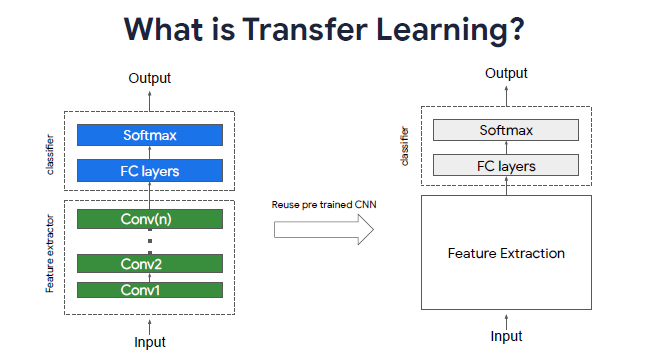

Slide source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

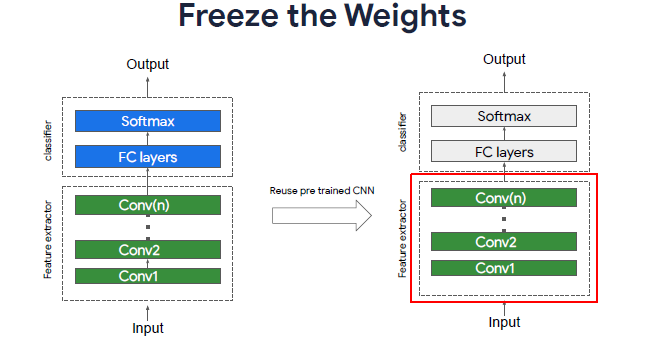

Slide source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

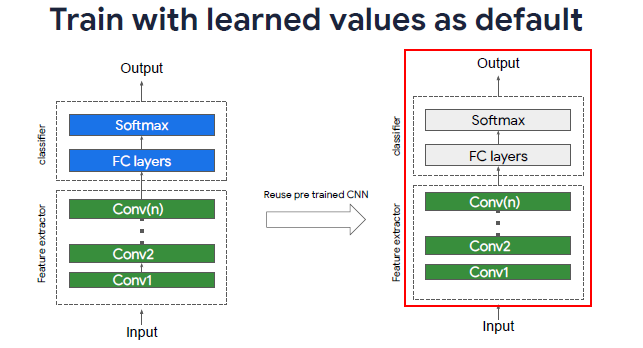

Slide source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

#### Image Classification Example

**Reference:** [Transfer learning & fine-tuning - TensorFlow official documentation](https://www.tensorflow.org/guide/keras/transfer_learning)

In [ ]:
# Code source: Transfer learning & fine-tuning - TensorFlow official documentation
# Link: https://www.tensorflow.org/guide/keras/transfer_learning

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

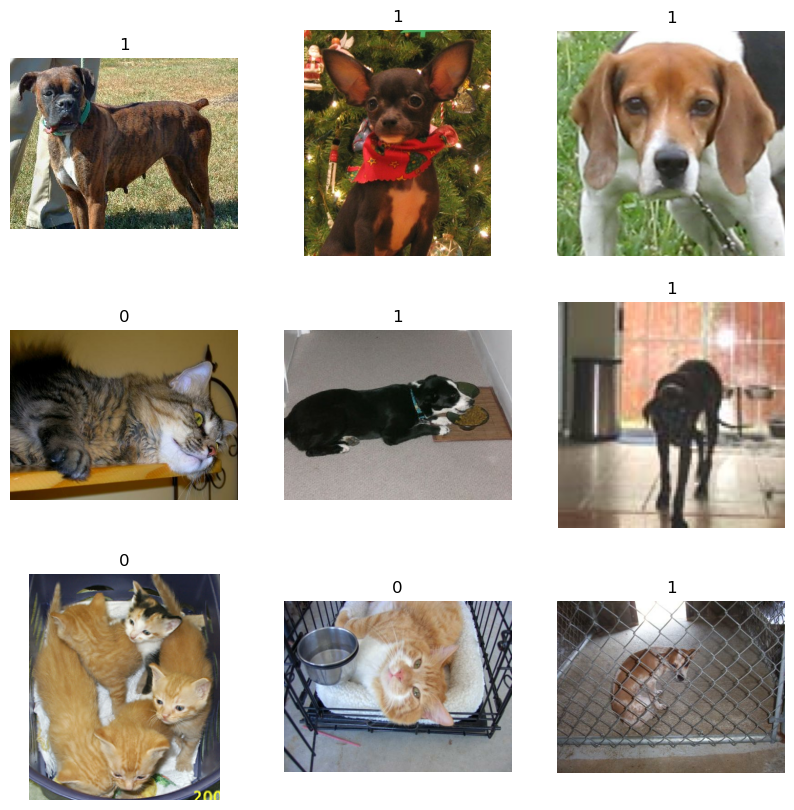

In [ ]:
tfds.disable_progress_bar()
train_ds, validation_ds, test_ds = tfds.load(
    "cats_vs_dogs",
    # Reserve 10% for validation and 10% for test
    split=["train[:40%]", "train[40%:50%]", "train[50%:60%]"],
    as_supervised=True,  # Include labels
    )

plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(int(label))
    plt.axis("off")

In [ ]:
size = (150, 150)
batch_size = 32

train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, size), y))
train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=10)

validation_ds = validation_ds.map(lambda x, y: (tf.image.resize(x, size), y))
validation_ds = validation_ds.cache().batch(batch_size).prefetch(buffer_size=10)

test_ds = test_ds.map(lambda x, y: (tf.image.resize(x, size), y))
test_ds = test_ds.cache().batch(batch_size).prefetch(buffer_size=10)

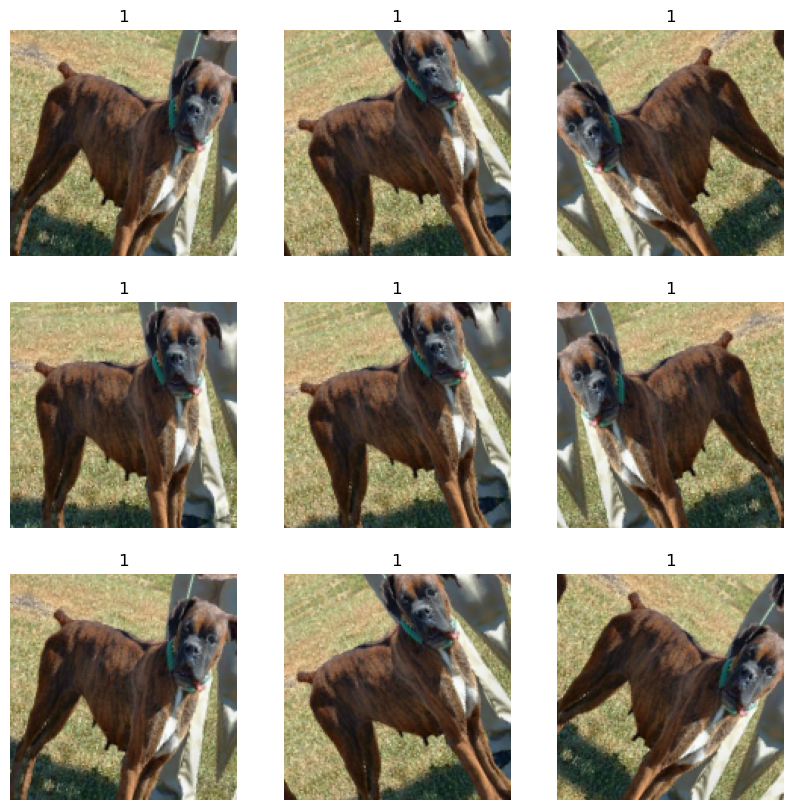

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    ])

for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        plt.imshow(augmented_image[0].numpy().astype("int32"))
        plt.title(int(labels[0]))
        plt.axis("off")
    plt.show()

In [ ]:
# Build a model
base_model = tf.keras.applications.Xception(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    input_shape=(150, 150, 3),
    include_top=False,
)  # Do not include the ImageNet classifier at the top.

# Freeze the base_model
base_model.trainable = False

# Create new model on top
inputs = tf.keras.Input(shape=(150, 150, 3))
x = data_augmentation(inputs)  # Apply random data augmentation

# Pre-trained Xception weights requires that input be scaled
# from (0, 255) to a range of (-1., +1.), the rescaling layer
# outputs: `(inputs * scale) + offset`
scale_layer = tf.keras.layers.Rescaling(scale=1 / 127.5, offset=-1)
x = scale_layer(x)

# The base model contains batchnorm layers. We want to keep them in inference mode
# when we unfreeze the base model for fine-tuning, so we make sure that the
# base_model is running in inference mode here.
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = tf.keras.layers.Dense(1)(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 150, 150, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 150, 150, 3)       0         
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                           

In [ ]:
# train the top layer only
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[tf.keras.metrics.BinaryAccuracy()],
)

epochs = 1
model.fit(train_ds,
          epochs=epochs,
          validation_data=validation_ds
)

291/291 [==============================] - 340s 1s/step - loss: 0.1608 - binary_accuracy: 0.9293 - val_loss: 0.0821 - val_binary_accuracy: 0.9669


In [ ]:
# train all layers
base_model.trainable = True

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[tf.keras.metrics.BinaryAccuracy()],
)

epochs = 1
model.fit(train_ds,
          epochs=epochs,
          validation_data=validation_ds) # ETA: 1:35:38!

### Object Localization

**Reference:** [Object Detection Part 1: Localization](https://johfischer.com/2021/09/19/simple-object-detection-using-a-convolutional-network-with-tensorflow-keras/)

* Intuition: Learning the 4 corners or the middle point plus width & height of the bounding box, a regression problem!  


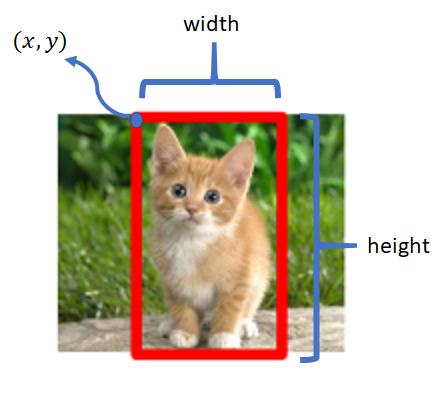

Image source: [Object Localization using Keras](https://medium.com/analytics-vidhya/object-localization-using-keras-d78d6810d0be)

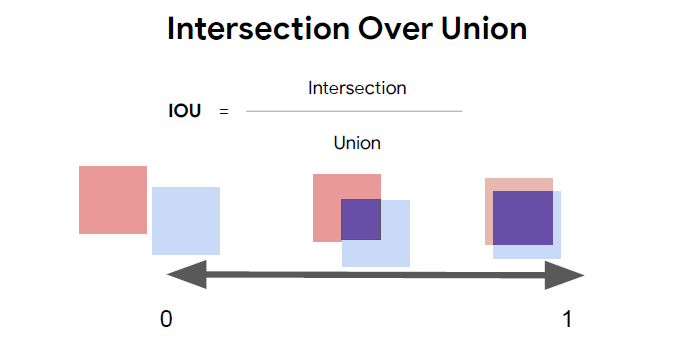


Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

In [ ]:
# Code source: Object Detection Part 1: Localization
# Link: https://johfischer.com/2021/09/19/simple-object-detection-using-a-convolutional-network-with-tensorflow-keras/

In [ ]:
import tensorflow as tf
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [ ]:
def generate_data(n, img_heigh, img_width):
    images, boxes = [], []
    for i in range(n):
        img = np.zeros((img_heigh, img_width, 3), dtype=np.uint8)
        x = np.random.randint(0, img_width - 7)
        y = np.random.randint(0, img_heigh - 7)
        w = np.random.randint(5, img_width - x)
        h = np.random.randint(5, img_heigh - y)
        cv2.rectangle(img, (x, y), (x + w, y + h), (255, 255, 255), -1)
        images.append(img)
        boxes.append([x, y, w, h])
    return np.array(images), np.array(boxes)

In [ ]:
n = 50000
img_heigh = 64
img_width = 64

# generate data
images, boxes = generate_data(n, img_heigh, img_width)
X_train, X_test, y_train, y_test = train_test_split(images, boxes, test_size=0.33)

# prepare dataset
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(32)
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(32)

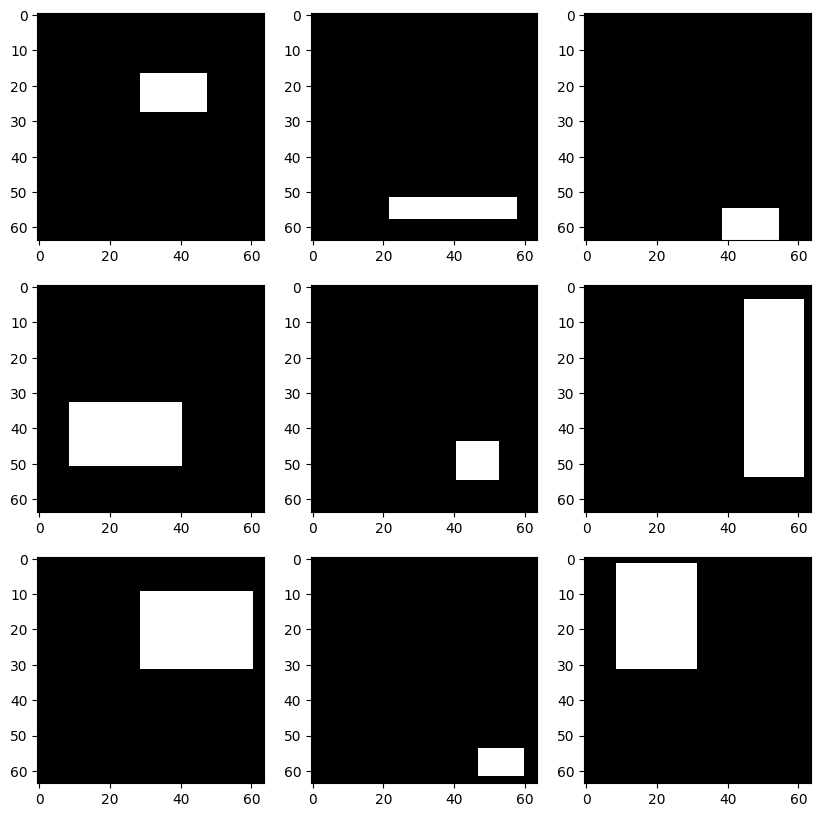

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i, ax in enumerate(axes.flatten()):
    img = X_train[i]
    box = y_train[i]
    ax.imshow(img)
plt.show()

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(64, 64, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(4)
])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 62, 62, 16)        448       
                                                                 
 batch_normalization_1 (Batc  (None, 62, 62, 16)       64        
 hNormalization)                                                 
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 31, 31, 16)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 32)        4640      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                      

In [ ]:
model.compile(optimizer='adam',
              loss='mse',
              metrics=['mse'])

EPOCHS = 50
history = model.fit(train_ds,
          epochs=EPOCHS,
          validation_data=test_ds,
          verbose=1)

Epoch 1/50
1047/1047 [==============================] - 36s 33ms/step - loss: 35.0301 - mse: 35.0301 - val_loss: 4.4636 - val_mse: 4.4636
Epoch 2/50
1047/1047 [==============================] - 33s 31ms/step - loss: 7.3475 - mse: 7.3475 - val_loss: 2.1683 - val_mse: 2.1683
Epoch 3/50
1047/1047 [==============================] - 32s 31ms/step - loss: 5.7195 - mse: 5.7195 - val_loss: 2.4114 - val_mse: 2.4114
Epoch 4/50
1047/1047 [==============================] - 32s 31ms/step - loss: 5.0911 - mse: 5.0911 - val_loss: 1.9076 - val_mse: 1.9076
Epoch 5/50
1047/1047 [==============================] - 32s 31ms/step - loss: 4.8526 - mse: 4.8526 - val_loss: 1.5927 - val_mse: 1.5927
Epoch 6/50
1047/1047 [==============================] - 32s 31ms/step - loss: 4.4256 - mse: 4.4256 - val_loss: 1.4894 - val_mse: 1.4894
Epoch 7/50
1047/1047 [==============================] - 32s 31ms/step - loss: 4.2201 - mse: 4.2201 - val_loss: 1.6238 - val_mse: 1.6238
Epoch 8/50
1047/1047 [========================

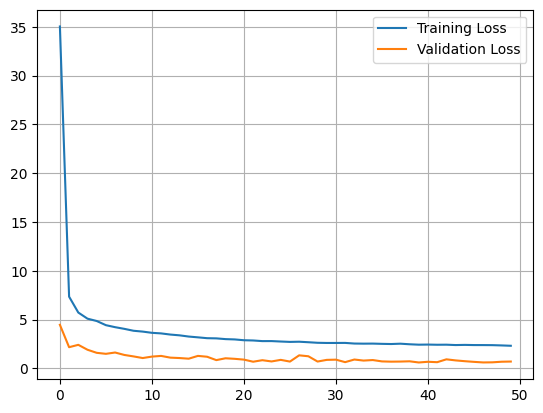

In [ ]:
epochs_range = range(EPOCHS)
plt.plot(epochs_range, history.history['loss'], label='Training Loss')
plt.plot(epochs_range, history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

516/516 [==============================] - 6s 11ms/step


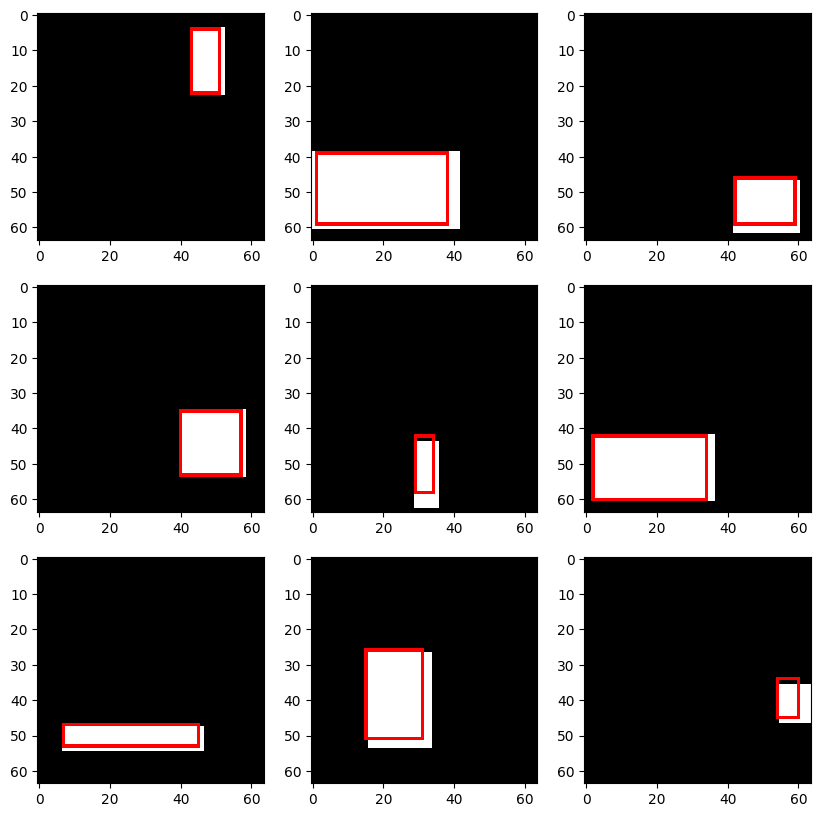

In [ ]:
preds = model.predict(test_ds)
test_images, bounding_boxes = test_ds.as_numpy_iterator().next()

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i, ax in enumerate(axes.flatten()):
    img = test_images[i]
    box = bounding_boxes[i]
    x, y, w, h = preds[i].astype('int32')
    img_bb = cv2.rectangle(np.array(img), (x, y), (x + w, y + h), (255, 0, 0), 1)
    ax.imshow(img_bb)
plt.show()

In [ ]:
# Code source: Simple Object Localization and Classification using a Convolutional Network with Tensorflow/Keras
# Link: https://github.com/joh-fischer/object-localization-and-classification/blob/main/Object%20Detection%20-%203%20Objects%20LocalizeClassify%20-%20Blog.ipynb

def computeIoU(bbox1, bbox2):
    (x1, y1, w1, h1) = bbox1
    (x2, y2, w2, h2) = bbox2

    # area of both rectangles
    area1 = (w1 + 1) * (h1 + 1)
    area2 = (w2 + 1) * (h2 + 1)

    # intersection rectangle coordinates
    inter_x1 = np.max((x1, x2))
    inter_y1 = np.max((y1, y2))
    inter_x2 = np.min((x1 + w1, x2 + w2))
    inter_y2 = np.min((y1 + h1, y2 + h2))

    # intersection rectangle width and height
    inter_w = np.max((0, inter_x2 - inter_x1 + 1))
    inter_h = np.max((0, inter_y2 - inter_y1 + 1))

    if inter_w <= 0 or inter_h <= 0:
        return 0.0

    # intersection area
    inter_area = inter_w * inter_h

    # return iou
    return inter_area / float(area1 + area2 - inter_area)

def mean_IoU(preds, anchors):
    iou = []
    for pred, anchor in zip(preds, anchors):
        iou.append(computeIoU(pred, anchor))
    return np.mean(iou)

print('Mean IoU: {:.3f}'.format(mean_IoU(preds, bounding_boxes)))

Mean IoU: 0.865


### Object Detection

#### Concept

**Reference**: [TensorFlow: Advanced Techniques Specialization](https://www.coursera.org/specializations/tensorflow-advanced-techniques)

![image.png](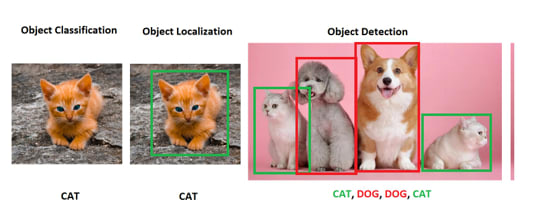
)

Image source: [Detection or localization and segmentation Deep Learning for Computer Vision](https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.pinnaxis.com%2F%3Fk%3Ddetection-or-localization-and-segmentation-deep-learning-for-computer-ee-ZX512mIo&psig=AOvVaw3LhrWfZj1AWMHIaNCq_-qK&ust=1720797759022000&source=images&cd=vfe&opi=89978449&ved=0CBQQjhxqFwoTCOiEnKyln4cDFQAAAAAdAAAAABAZ)

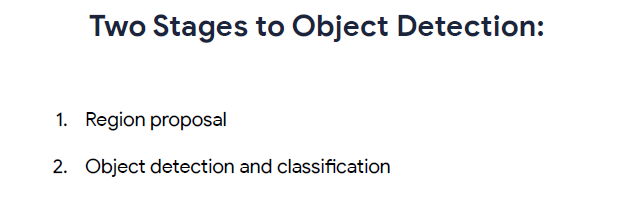


Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

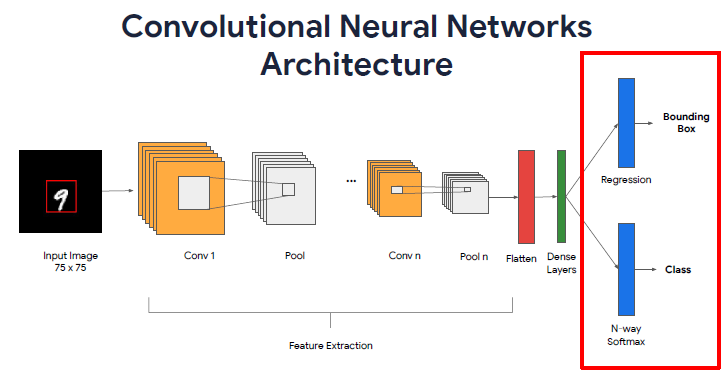

Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

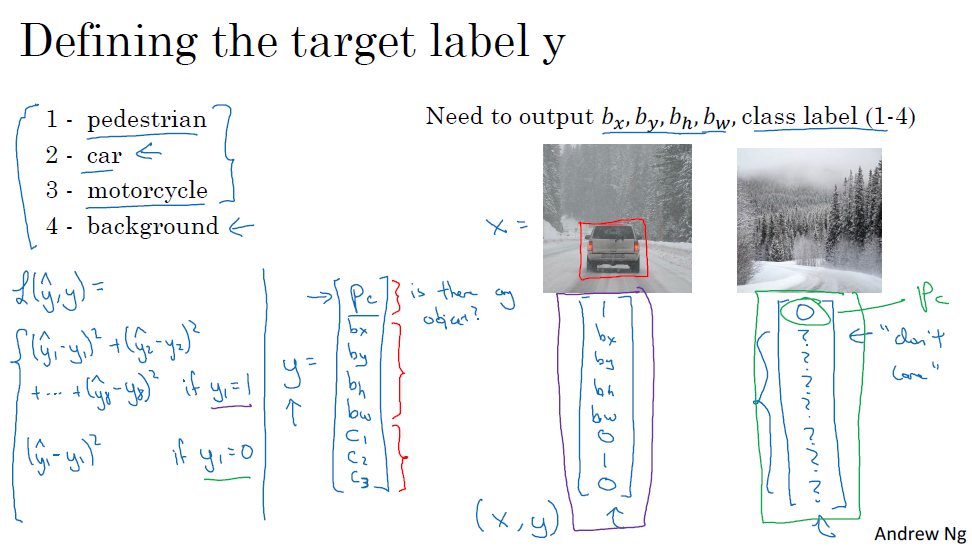

Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

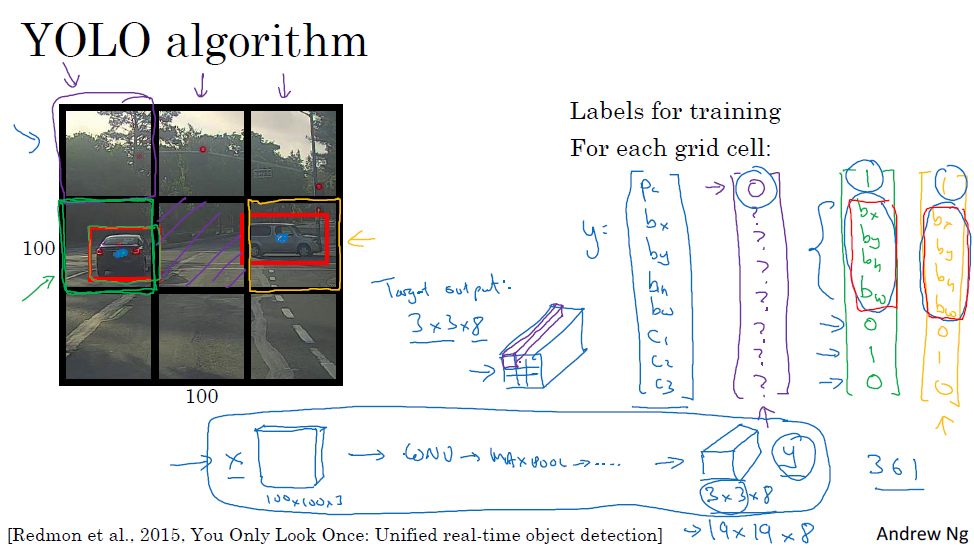

Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

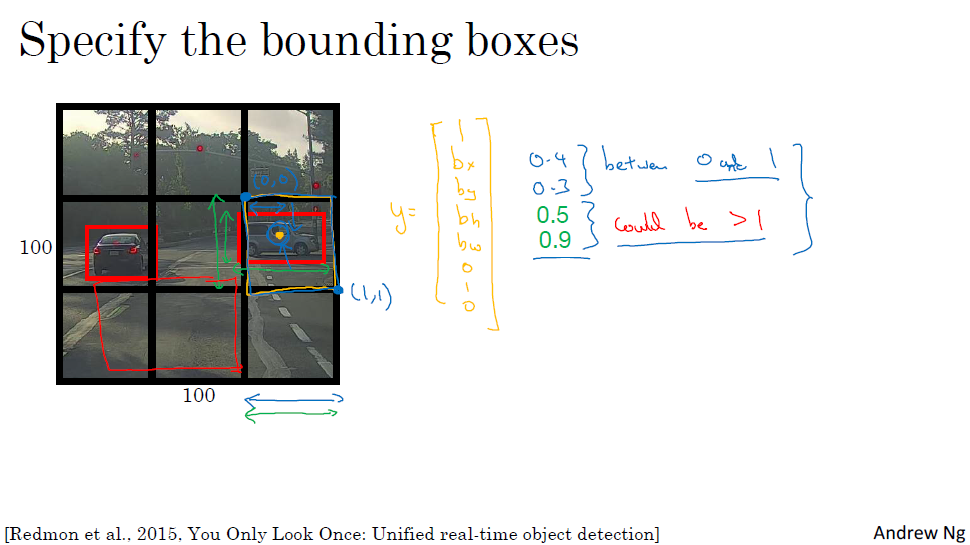

Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)


**YOLO**  
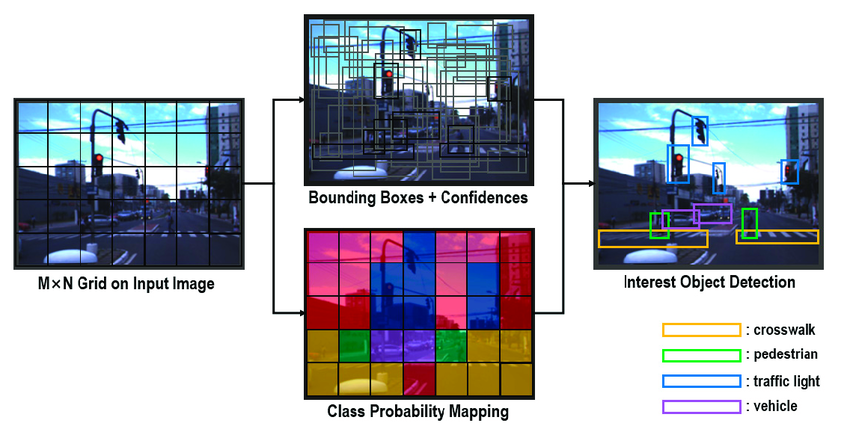

Imgae source: [Detection Model of Occluded Object Based on YOLO Using Hard-Example Mining and Augmentation Policy Optimization](https://www.researchgate.net/publication/353641234_Detection_Model_of_Occluded_Object_Based_on_YOLO_Using_Hard-Example_Mining_and_Augmentation_Policy_Optimization)

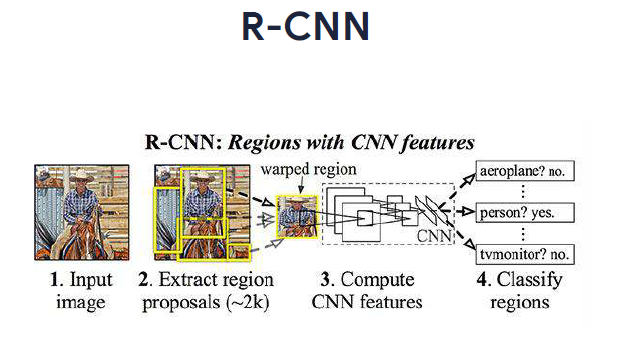



Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

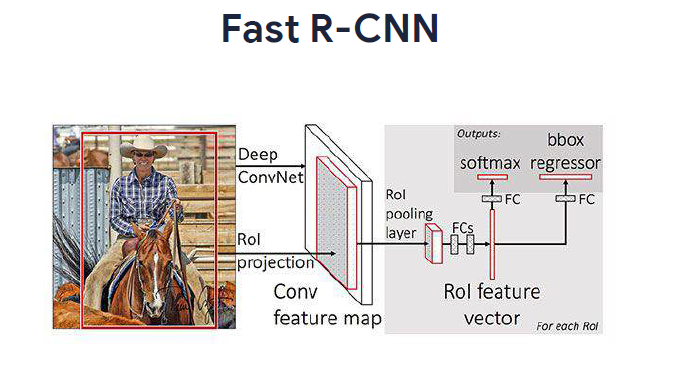



Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

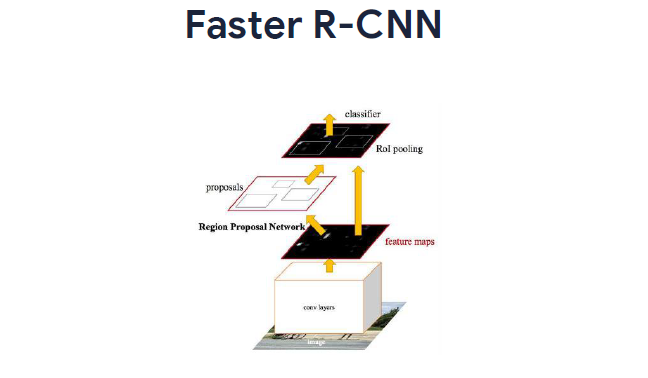


Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

R-CNNs:
* R-CNN:
    * 2000 region proposals are generated using the [selective search algorithm](https://ivi.fnwi.uva.nl/isis/publications/2013/UijlingsIJCV2013/UijlingsIJCV2013.pdf)
    * Region proposals are warped into a square and fed into a CNN (feature extractor)
    * The output dense layer from the CNN is fed into a SVM for classification
* Fast R-CNN:
    *  Similar to R-CNN, instead of feeding the region proposals to the CNN, the input image is fed into to the CNN to generate a convolutional feature map
    * From the convolutional feature map, the region of proposals are identified using a [selective search algorithm](https://ivi.fnwi.uva.nl/isis/publications/2013/UijlingsIJCV2013/UijlingsIJCV2013.pdf) and warpped into squares, reshaped into a fixed size using a RoI pooling layer, and fed into a fully connected layer for classification
* Faster R-CNN:
    * Similar to Fast R-CNN, instead of using selective search algorithm on the feature map to identify the region proposals, a separate network is used to predict the region proposals

**Reference**: [R-CNN, Fast R-CNN, Faster R-CNN, YOLO — Object Detection Algorithms](https://towardsdatascience.com/r-cnn-fast-r-cnn-faster-r-cnn-yolo-object-detection-algorithms-36d53571365e)

#### Zero-Shot Object Detection

**Reference:** [Object Detection - TensorFlow Hub](https://www.tensorflow.org/hub/tutorials/object_detection)

In [ ]:
# Code source: TensorFlow Object Detection API - Official Tutorial
# Link: https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(10, 12))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.LANCZOS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getbbox(ds)[3] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    bbox = font.getbbox(display_str)
    text_width, text_height = bbox[2], bbox[3]
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf", 25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"), int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image


In [ ]:
# load trained ojbect detection model from TensorFlow Hub
# model: FasterRCNN + InceptionResNet V2

module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']

In [ ]:
# load a random image
image_url = "https://upload.wikimedia.org/wikipedia/commons/5/5b/St_Mary%27s_Church%2C_Castle_Street_1.jpg"
image_path = download_and_resize_image(image_url, 640, 480)

image = tf.io.read_file(image_path)
image = tf.image.decode_jpeg(image, channels=3)
converted_image  = tf.image.convert_image_dtype(image, tf.float32)[tf.newaxis, ...]

In [ ]:
# run detector
results = detector(converted_image)
result = {key:value.numpy() for key,value in results.items()}
[key for key in result.keys()]

['detection_class_names',
 'detection_boxes',
 'detection_scores',
 'detection_class_labels',
 'detection_class_entities']

Font not found, using default font.


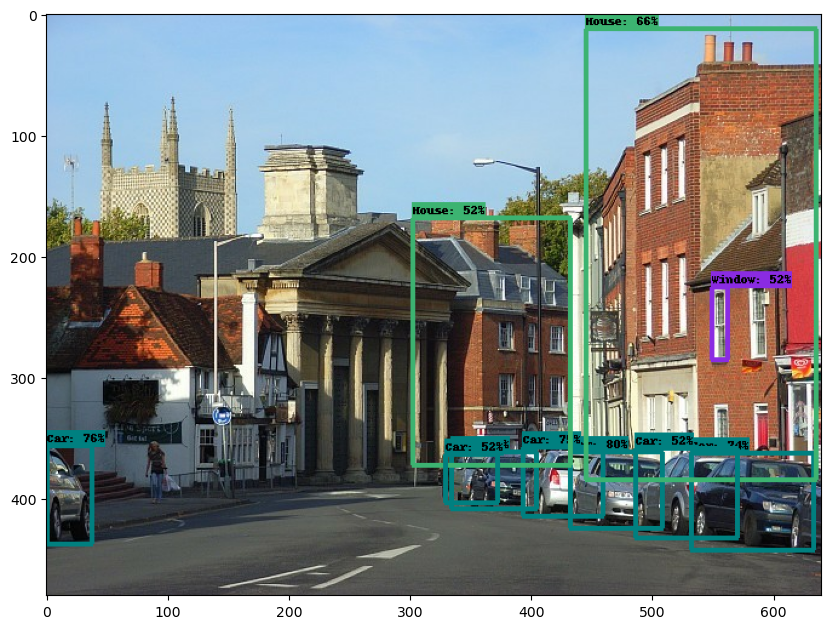

In [ ]:
# display detected labels and boudning boxes
image_with_boxes = draw_boxes(image.numpy(),
                              result["detection_boxes"],
                              result["detection_class_entities"],
                              result["detection_scores"])
display_image(image_with_boxes)

#### Transfer Learning for Object Detection

**Reference**: [TensorFlow: Advanced Techniques Specialization](https://www.coursera.org/specializations/tensorflow-advanced-techniques)

**Note**: For a small dataset like the one used in this section, transfer learning is not recommended!  
Designing a convolutional architecture from scratch would be more efficient. Transfer learning has applied here to illustrate how the technique could be used in practice.

In [ ]:
# Code source: Advanced Computer Vision with TensorFlow - DeepLearning.AI
# Link: https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

In [ ]:
import os, re, time, json
import PIL.Image, PIL.ImageFont, PIL.ImageDraw
import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt
import tensorflow_datasets as tfds
import tensorflow_hub as hub

In [ ]:
def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color='red',
                               thickness=1,
                               display_str=None,
                               use_normalized_coordinates=True):
    """Adds a bounding box to an image.
    Bounding box coordinates can be specified in either absolute (pixel) or
    normalized coordinates by setting the use_normalized_coordinates argument.
    Args:
        image: a PIL.Image object.
        ymin: ymin of bounding box.
        xmin: xmin of bounding box.
        ymax: ymax of bounding box.
        xmax: xmax of bounding box.
        color: color to draw bounding box. Default is red.
        thickness: line thickness. Default value is 4.
        display_str_list: string to display in box
        use_normalized_coordinates: If True (default), treat coordinates
        ymin, xmin, ymax, xmax as relative to the image.  Otherwise treat
        coordinates as absolute.
    """
    draw = PIL.ImageDraw.Draw(image)
    im_width, im_height = image.size
    if use_normalized_coordinates:
        (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                    ymin * im_height, ymax * im_height)
    else:
        (left, right, top, bottom) = (xmin, xmax, ymin, ymax)
    draw.line([(left, top), (left, bottom), (right, bottom),
                (right, top), (left, top)], width=thickness, fill=color)

def draw_bounding_boxes_on_image(image,
                                 boxes,
                                 color=[],
                                 thickness=1,
                                 display_str_list=()):
    """Draws bounding boxes on image.
    Args:
        image: a PIL.Image object.
        boxes: a 2 dimensional numpy array of [N, 4]: (ymin, xmin, ymax, xmax).
            The coordinates are in normalized format between [0, 1].
        color: color to draw bounding box. Default is red.
        thickness: line thickness. Default value is 4.
        display_str_list: a list of strings for each bounding box.

    Raises:
        ValueError: if boxes is not a [N, 4] array
    """
    boxes_shape = boxes.shape
    if not boxes_shape:
        return
    if len(boxes_shape) != 2 or boxes_shape[1] != 4:
        raise ValueError('Input must be of size [N, 4]')
    for i in range(boxes_shape[0]):
        draw_bounding_box_on_image(image, boxes[i, 1], boxes[i, 0], boxes[i, 3],
                                boxes[i, 2], color[i], thickness, display_str_list[i])

def draw_bounding_boxes_on_image_array(image,
                                       boxes,
                                       color=[],
                                       thickness=1,
                                       display_str_list=()):
    """Draws bounding boxes on image (numpy array).
    Args:
        image: a numpy array object.
        boxes: a 2 dimensional numpy array of [N, 4]: (ymin, xmin, ymax, xmax).
            The coordinates are in normalized format between [0, 1].
        color: color to draw bounding box. Default is red.
        thickness: line thickness. Default value is 4.
        display_str_list_list: a list of strings for each bounding box.
    Raises:
        ValueError: if boxes is not a [N, 4] array
    """
    image_pil = PIL.Image.fromarray(image)
    rgbimg = PIL.Image.new("RGBA", image_pil.size)
    rgbimg.paste(image_pil)
    draw_bounding_boxes_on_image(rgbimg, boxes, color, thickness,
                                display_str_list)
    return np.array(rgbimg)

In [ ]:
plt.rc('image', cmap='gray')
plt.rc('grid', linewidth=0)
plt.rc('xtick', top=False, bottom=False, labelsize='large')
plt.rc('ytick', left=False, right=False, labelsize='large')
plt.rc('axes', facecolor='F8F8F8', titlesize="large", edgecolor='white')
plt.rc('text', color='a8151a')
plt.rc('figure', facecolor='F0F0F0')# Matplotlib fonts
MATPLOTLIB_FONT_DIR = os.path.join(os.path.dirname(plt.__file__), "mpl-data/fonts/ttf")


def dataset_to_numpy_util(training_dataset, validation_dataset, N):
    # get one batch from each: 10000 validation digits, N training digits
    batch_train_ds = training_dataset.unbatch().batch(N)

    # eager execution: loop through datasets normally
    if tf.executing_eagerly():
      for validation_digits, (validation_labels, validation_bboxes) in validation_dataset:
        validation_digits = validation_digits.numpy()
        validation_labels = validation_labels.numpy()
        validation_bboxes = validation_bboxes.numpy()
        break
      for training_digits, (training_labels, training_bboxes) in batch_train_ds:
        training_digits = training_digits.numpy()
        training_labels = training_labels.numpy()
        training_bboxes = training_bboxes.numpy()
        break

    # these were one-hot encoded in the dataset
    validation_labels = np.argmax(validation_labels, axis=1)
    training_labels = np.argmax(training_labels, axis=1)

    return (training_digits, training_labels, training_bboxes,
            validation_digits, validation_labels, validation_bboxes)

def create_digits_from_local_fonts(n):
    font_labels = []
    img = PIL.Image.new('LA', (75*n, 75), color = (0,255)) # format 'LA': black in channel 0, alpha in channel 1
    font1 = PIL.ImageFont.truetype(os.path.join(MATPLOTLIB_FONT_DIR, 'DejaVuSansMono-Oblique.ttf'), 25)
    font2 = PIL.ImageFont.truetype(os.path.join(MATPLOTLIB_FONT_DIR, 'STIXGeneral.ttf'), 25)
    d = PIL.ImageDraw.Draw(img)
    for i in range(n):
      font_labels.append(i%10)
      d.text((7+i*75,0 if i<10 else -4), str(i%10), fill=(255,255), font=font1 if i<10 else font2)
    font_digits = np.array(img.getdata(), np.float32)[:,0] / 255.0 # black in channel 0, alpha in channel 1 (discarded)
    font_digits = np.reshape(np.stack(np.split(np.reshape(font_digits, [75, 75*n]), n, axis=1), axis=0), [n, 75*75])
    return font_digits, font_labels

def display_digits_with_boxes_rgb(digits, predictions, labels, pred_bboxes, bboxes, iou, title):
    n = 10
    indexes = np.random.choice(len(predictions), size=n)
    n_digits = digits[indexes]
    n_predictions = predictions[indexes]
    n_labels = labels[indexes]

    n_iou = []
    if len(iou) > 0:
      n_iou = iou[indexes]
    if (len(pred_bboxes) > 0):
      n_pred_bboxes = pred_bboxes[indexes,:]
    if (len(bboxes) > 0):
      n_bboxes = bboxes[indexes,:]

    # Assuming digits are already RGB and normalized to 0-1, scale to 0-255 for display
    n_digits = n_digits * 255.0
    n_digits = np.clip(n_digits, 0, 255).astype(np.uint8) # Ensure values are valid uint8 for image display

    fig = plt.figure(figsize=(20, 4))
    plt.title(title)
    plt.yticks([])
    plt.xticks([])

    for i in range(n): # Corrected loop to iterate up to n, not 10 if n < 10
      ax = fig.add_subplot(1, n, i+1) # Corrected subplot index to use n for number of columns
      bboxes_to_plot = []
      if (len(pred_bboxes) > 0):
        bboxes_to_plot.append(n_pred_bboxes[i])
      if (len(bboxes) > 0):
        bboxes_to_plot.append(n_bboxes[i])

      # No reshape needed, n_digits[i] is already (75, 75, 3) or similar RGB shape
      img_to_draw = draw_bounding_boxes_on_image_array(image=n_digits[i], boxes=np.asarray(bboxes_to_plot),
                                                       color=['red', 'green'], display_str_list=["true", "pred"])
      plt.xlabel(n_predictions[i])
      plt.xticks([])
      plt.yticks([])
      if n_predictions[i] != n_labels[i]:
        ax.xaxis.label.set_color('red')
      plt.imshow(img_to_draw)
      if len(iou) > i :
        color = "black"
        if (n_iou[i][0] < iou_threshold):
          color = "red"
        ax.text(0.2, -0.3, "iou: %s" %(n_iou[i][0]), color=color, transform=ax.transAxes)
    plt.show() # Added plt.show() to display the figure


In [ ]:
def plot_metrics(metric_name, title, ylim=5):
    plt.title(title)
    plt.ylim(0, ylim)
    plt.plot(history.history[metric_name],color='blue',label=metric_name)
    plt.plot(history.history['val_' + metric_name],color='green',label='val_' + metric_name)

def intersection_over_union(pred_box, true_box):
    xmin_pred, ymin_pred, xmax_pred, ymax_pred =  np.split(pred_box, 4, axis = 1)
    xmin_true, ymin_true, xmax_true, ymax_true = np.split(true_box, 4, axis = 1)

    smoothing_factor = 1e-10
    xmin_overlap = np.maximum(xmin_pred, xmin_true)
    xmax_overlap = np.minimum(xmax_pred, xmax_true)
    ymin_overlap = np.maximum(ymin_pred, ymin_true)
    ymax_overlap = np.minimum(ymax_pred, ymax_true)

    pred_box_area = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
    true_box_area = (xmax_true - xmin_true) * (ymax_true - ymin_true)
    overlap_area = np.maximum((xmax_overlap - xmin_overlap), 0)  * np.maximum((ymax_overlap - ymin_overlap), 0)
    union_area = (pred_box_area + true_box_area) - overlap_area
    iou = (overlap_area + smoothing_factor) / (union_area + smoothing_factor)
    return iou

In [ ]:
def read_image_tfds(image, label):
    xmin = tf.random.uniform((), 0, 48, dtype=tf.int32)
    ymin = tf.random.uniform((), 0, 48, dtype=tf.int32)
    image = tf.reshape(image, (28, 28, 1,))
    image = tf.image.pad_to_bounding_box(image, ymin, xmin, 75, 75)
    image_rgb = tf.image.grayscale_to_rgb(image)
    image_rgb = tf.cast(image_rgb, tf.float32) / 255.0
    xmin = tf.cast(xmin, tf.float32) / 75
    ymin = tf.cast(ymin, tf.float32) / 75
    xmax = (xmin + 28/75)
    ymax = (ymin + 28/75)
    return image_rgb, (tf.one_hot(label, 10), [xmin, ymin, xmax, ymax])

def get_training_dataset():
    dataset = tfds.load("mnist", split="train", as_supervised=True, try_gcs=True)
    dataset = dataset.map(read_image_tfds, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(5000, reshuffle_each_iteration=True)
    dataset = dataset.batch(512, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

def get_validation_dataset():
    dataset = tfds.load("mnist", split="test", as_supervised=True, try_gcs=True)
    dataset = dataset.map(read_image_tfds, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(512, drop_remainder=True)
    return dataset

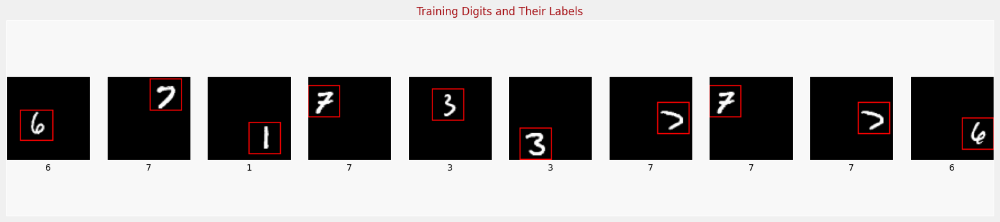

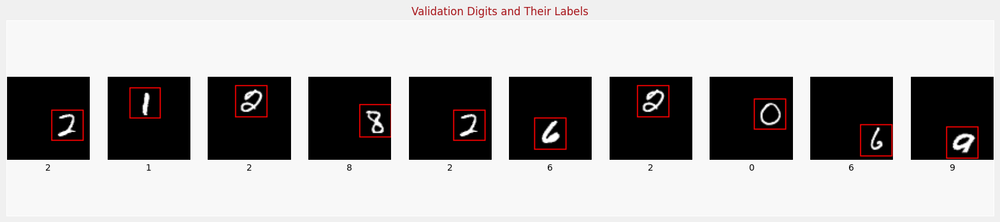

In [ ]:
im_width = 75
im_height = 75
use_normalized_coordinates = True

training_dataset = get_training_dataset()
validation_dataset = get_validation_dataset()

(training_digits, training_labels, training_bboxes, \
validation_digits, validation_labels, validation_bboxes) = dataset_to_numpy_util(training_dataset, validation_dataset, 10)

display_digits_with_boxes_rgb(training_digits, training_labels, training_labels, np.array([]),\
                             training_bboxes, np.array([]), "Training Digits and Their Labels")
display_digits_with_boxes_rgb(validation_digits, validation_labels, validation_labels, np.array([]), \
                             validation_bboxes, np.array([]), "Validation Digits and Their Labels")

In [ ]:
# Load a pre-trained InceptionResNetV2
input_shape = (75, 75, 3)
num_classes = 10

base_model = tf.keras.applications.InceptionResNetV2(
    input_shape=input_shape,
    include_top=False,
    weights='imagenet',)

# Keep only the first 5 blocks in InceptionResNetV2
feature_extractor_layer_name = 'batch_normalization_8'
feature_extractor_output = base_model.get_layer(feature_extractor_layer_name).output

# Create feature extractor model
feature_extractor = tf.keras.Model(inputs=base_model.input, outputs=feature_extractor_output, name='FeatureExtractor')

# Freeze the feature extractor layers
feature_extractor.trainable = False

# Create new model on top
inputs = tf.keras.Input(shape=input_shape)
features = feature_extractor(inputs, training=False)
x = tf.keras.layers.Flatten()(features)
x = tf.keras.layers.Dense(64, activation='relu')(x)

# Classification head
clf_output = tf.keras.layers.Dense(num_classes, activation='softmax', name='classifier')(x)

# Bounding box regression head
bbox_output = tf.keras.layers.Dense(4, name='bounding_box')(x)

model = tf.keras.Model(inputs, outputs=[clf_output, bbox_output], name='ObjectDetector')
model.summary()

Model: "ObjectDetector"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 75, 75, 3)]  0           []                               
                                                                                                  
 FeatureExtractor (Functional)  (None, 7, 7, 64)     185552      ['input_2[0][0]']                
                                                                                                  
 flatten (Flatten)              (None, 3136)         0           ['FeatureExtractor[0][0]']       
                                                                                                  
 dense (Dense)                  (None, 64)           200768      ['flatten[0][0]']                
                                                                                     

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss={'classifier': tf.keras.losses.CategoricalCrossentropy(),
                    'bounding_box': tf.keras.losses.MeanSquaredError()},
              metrics={'classifier': 'accuracy',
                       'bounding_box': tf.keras.metrics.MeanSquaredError()})

EPOCHS = 10
history = model.fit(training_dataset,
                    validation_data=validation_dataset,
                    epochs=EPOCHS)

Epoch 1/10
117/117 [==============================] - 65s 546ms/step - loss: 2.4478 - classifier_loss: 2.2061 - bounding_box_loss: 0.2416 - classifier_accuracy: 0.1892 - bounding_box_mean_squared_error: 0.2416 - val_loss: 2.0462 - val_classifier_loss: 1.9539 - val_bounding_box_loss: 0.0924 - val_classifier_accuracy: 0.3105 - val_bounding_box_mean_squared_error: 0.0924
Epoch 2/10
117/117 [==============================] - 81s 695ms/step - loss: 1.7603 - classifier_loss: 1.6723 - bounding_box_loss: 0.0880 - classifier_accuracy: 0.4063 - bounding_box_mean_squared_error: 0.0880 - val_loss: 1.4072 - val_classifier_loss: 1.3486 - val_bounding_box_loss: 0.0586 - val_classifier_accuracy: 0.5371 - val_bounding_box_mean_squared_error: 0.0586
Epoch 3/10
117/117 [==============================] - 79s 671ms/step - loss: 1.1449 - classifier_loss: 1.0930 - bounding_box_loss: 0.0519 - classifier_accuracy: 0.6421 - bounding_box_mean_squared_error: 0.0519 - val_loss: 0.8842 - val_classifier_loss: 0.8384

1/1 [==============================] - 0s 238ms/step - loss: 0.2788 - classifier_loss: 0.2717 - bounding_box_loss: 0.0071 - classifier_accuracy: 0.9180 - bounding_box_mean_squared_error: 0.0071
Validation accuracy:  0.91796875


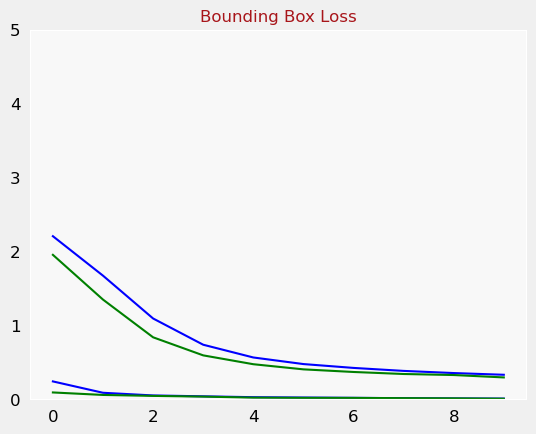

In [ ]:
loss, classification_loss, bounding_box_loss, classification_accuracy, bounding_box_mse = model.evaluate(validation_dataset, steps=1)
print("Validation accuracy: ", classification_accuracy)
plot_metrics("classifier_loss", "Classification Loss")
plot_metrics("bounding_box_loss", "Bounding Box Loss")

8/8 [==============================] - 0s 30ms/step
Number of predictions where iou > threshold(0.6): 196
Number of predictions where iou < threshold(0.6): 316


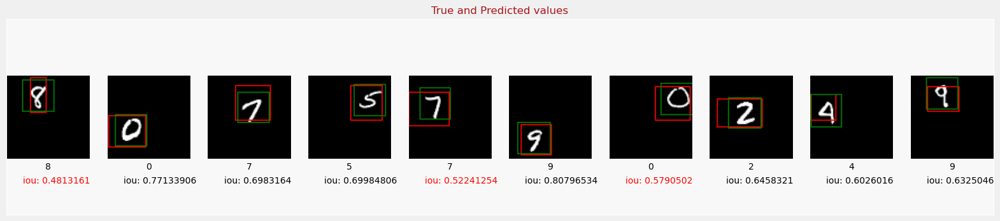

In [ ]:
predictions = model.predict(validation_digits, batch_size=64)
predicted_labels = np.argmax(predictions[0], axis=1)
predicted_bboxes = predictions[1]
iou = intersection_over_union(predicted_bboxes, validation_bboxes)
iou_threshold = 0.6
print("Number of predictions where iou > threshold(%s): %s" % (iou_threshold, (iou >= iou_threshold).sum()))
print("Number of predictions where iou < threshold(%s): %s" % (iou_threshold, (iou < iou_threshold).sum()))
display_digits_with_boxes_rgb(validation_digits, predicted_labels, validation_labels, predicted_bboxes, validation_bboxes, iou, "True and Predicted values")

### Image Segmentation

#### Concept

**Reference**: [TensorFlow: Advanced Techniques Specialization](https://www.coursera.org/specializations/tensorflow-advanced-techniques)

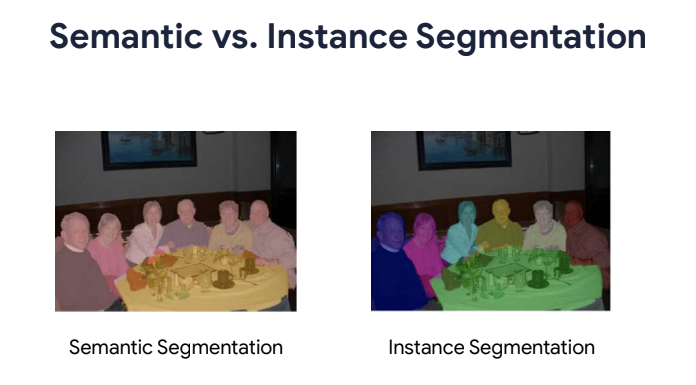


Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

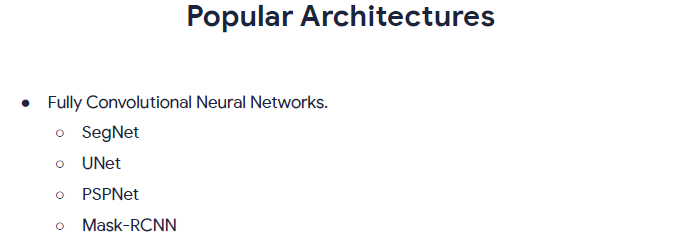


Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

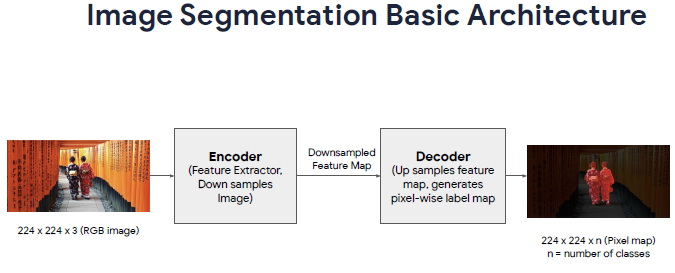


Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)


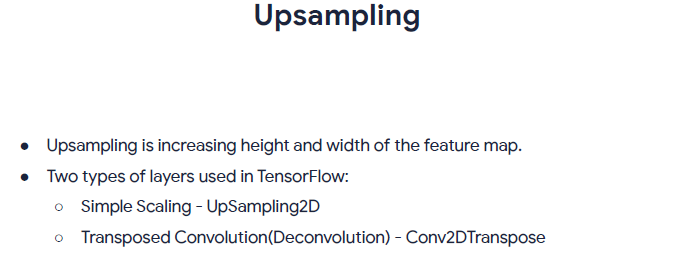

Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

**Transposed Convolution**   

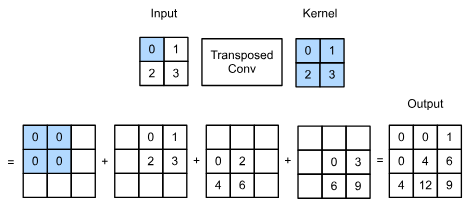

Image source: [14.10. Transposed Convolution](https://d2l.ai/chapter_computer-vision/transposed-conv.html)

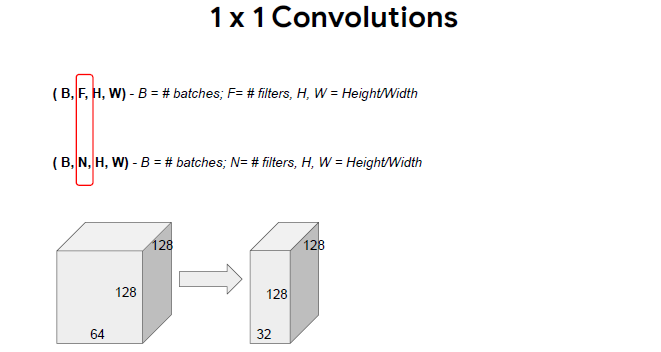

Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

#### UNet

**Reference**: [TensorFlow: Advanced Techniques Specialization](https://www.coursera.org/specializations/tensorflow-advanced-techniques)

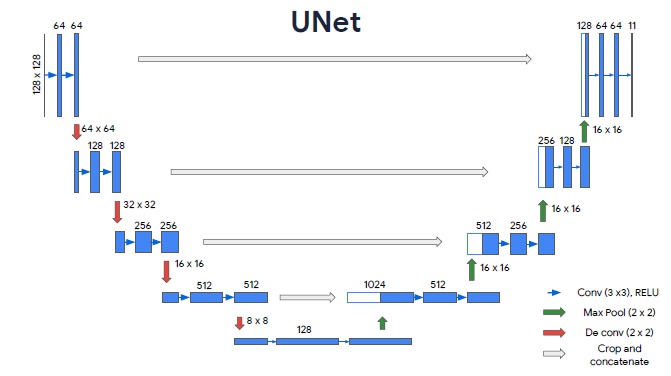

Image source: [DeepLearning.AI - Advanced Computer Vision with TensorFlow](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

In [ ]:
## Code sources:
# DeepLearning.AI - Advanced Computer Vision with TensorFlow | Link: https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)
# Image Segmentation - TensorFlow Official Documentation | Link: https://www.tensorflow.org/tutorials/images/segmentation

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
def conv_block(inputs, filters):
    x = tf.keras.layers.Conv2D(filters, kernel_size=(3,3), activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    x = tf.keras.layers.Conv2D(filters, kernel_size=(3,3), activation='relu', padding='same', kernel_initializer='he_normal')(x)
    conv = tf.keras.layers.MaxPooling2D(pool_size=2, strides=2)(x)
    skip = x
    return conv, skip

def bottleneck_block(inputs, filters):
    x = tf.keras.layers.Conv2D(filters, kernel_size=(3,3), activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    x = tf.keras.layers.Conv2D(filters, kernel_size=(3,3), activation='relu', padding='same', kernel_initializer='he_normal')(x)
    bottleneck = tf.keras.layers.Dropout(0.3)(x)
    return bottleneck

def upsampling_block(skip, inputs, filters):
    x = tf.keras.layers.Conv2DTranspose(filters, kernel_size=(3,3), strides=2, padding='same')(inputs)
    x = tf.keras.layers.concatenate([x, skip])
    x = tf.keras.layers.Conv2D(filters, kernel_size=(3,3), activation='relu', padding='same', kernel_initializer='he_normal')(x)
    up = tf.keras.layers.Conv2D(filters, kernel_size=(3,3), activation='relu', padding='same', kernel_initializer='he_normal')(x)
    return up

def classifier(inputs, n_classes):
    x = tf.keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    outputs = tf.keras.layers.Conv2D(n_classes, kernel_size=(1,1), padding='same')(x)
    return outputs

In [ ]:
def UNet(*, num_classes=1):
    # encoder
    inputs = tf.keras.layers.Input(shape=(128, 128, 3))
    conv, skip1 = conv_block(inputs, 64)
    conv, skip2 = conv_block(conv, 128)
    conv, skip3 = conv_block(conv, 256)
    conv, skip4 = conv_block(conv, 512)

    # bottleneck
    bottleneck = bottleneck_block(conv, 512)

    # decoder
    up = upsampling_block(skip4, bottleneck, 512)
    up = upsampling_block(skip3, up, 256)
    up = upsampling_block(skip2, up, 128)
    up = upsampling_block(skip1, up, 64)
    outputs = classifier(up, num_classes)

    # build model
    model = tf.keras.Model(inputs, outputs, name='UNet')

    return model

In [ ]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask -= 1
    return input_image, input_mask

def load_image(datapoint):
    input_image = tf.image.resize(datapoint['image'], (128, 128))
    input_mask = tf.image.resize(
        datapoint['segmentation_mask'], (128, 128),
        method = tf.image.ResizeMethod.NEAREST_NEIGHBOR,)
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

def display(display_list):
    plt.figure(figsize=(8, 8))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def create_mask(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

def show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
        else:
            display([sample_image, sample_mask,
                create_mask(model.predict(sample_image[tf.newaxis, ...]))])

In [ ]:
dl_config = tfds.download.DownloadConfig(verify_ssl=False)
dataset, info = tfds.load('oxford_iiit_pet', with_info=True, download_and_prepare_kwargs={'download_config': dl_config})

In [ ]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 64
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

train_images = dataset['train'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_images = dataset['test'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

train_batches = (train_images
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .prefetch(buffer_size=tf.data.AUTOTUNE))
test_batches = test_images.batch(BATCH_SIZE)

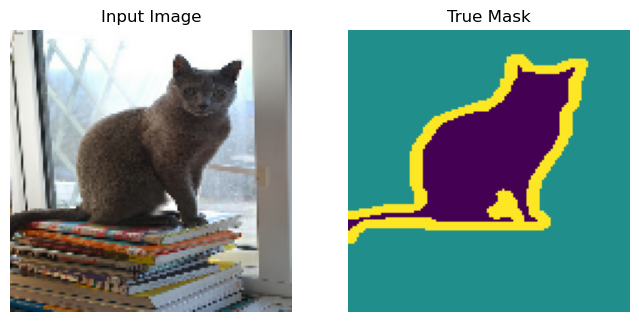

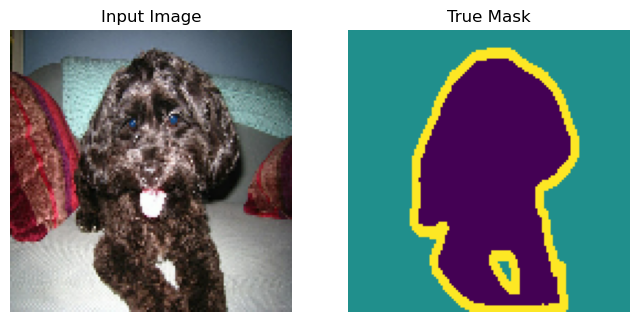

In [ ]:
for images, masks in train_batches.take(2):
    sample_image, sample_mask = images[0], masks[0]
    display([sample_image, sample_mask])

In [ ]:
OUTPUT_CLASSES = 3

model = UNet(num_classes=OUTPUT_CLASSES)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches)

Epoch 1/20
57/57 [==============================] - 887s 16s/step - loss: 1.1839 - accuracy: 0.5863 - val_loss: 0.8405 - val_accuracy: 0.6817
Epoch 2/20
57/57 [==============================] - 851s 15s/step - loss: 0.7485 - accuracy: 0.7044 - val_loss: 0.7525 - val_accuracy: 0.7069
Epoch 3/20
57/57 [==============================] - 887s 16s/step - loss: 0.6757 - accuracy: 0.7356 - val_loss: 0.6377 - val_accuracy: 0.7454
Epoch 4/20
57/57 [==============================] - 880s 15s/step - loss: 0.6232 - accuracy: 0.7565 - val_loss: 0.6034 - val_accuracy: 0.7586
Epoch 5/20
57/57 [==============================] - 852s 15s/step - loss: 0.5515 - accuracy: 0.7831 - val_loss: 0.5285 - val_accuracy: 0.7857
Epoch 6/20
57/57 [==============================] - 868s 15s/step - loss: 0.4994 - accuracy: 0.8051 - val_loss: 0.4850 - val_accuracy: 0.8065
Epoch 7/20
57/57 [==============================] - 873s 15s/step - loss: 0.4513 - accuracy: 0.8247 - val_loss: 0.4849 - val_accuracy: 0.8132
Epoch 

2/2 [==============================] - 3s 2s/step


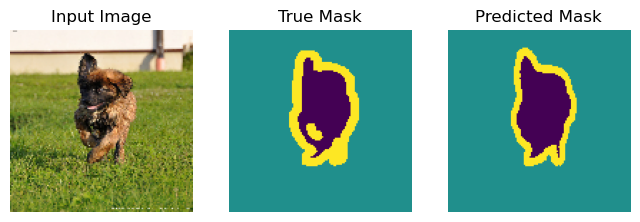

2/2 [==============================] - 3s 2s/step


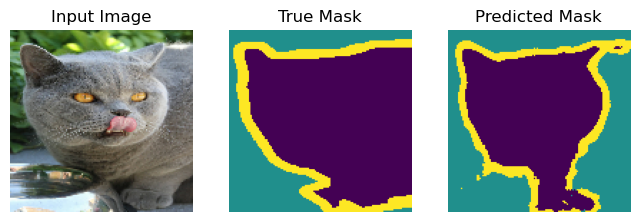

2/2 [==============================] - 3s 2s/step


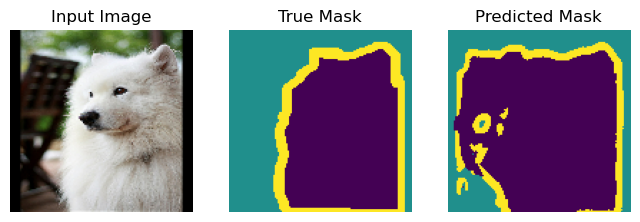

1/1 [==============================] - 0s 198ms/step


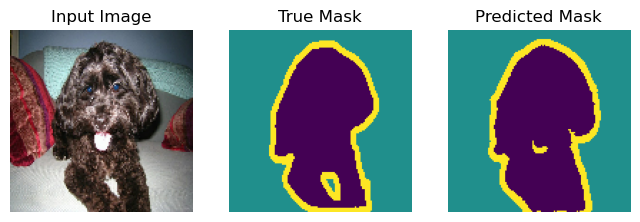

In [ ]:
show_predictions(test_batches, 3)

## $3.$ Advanced Topics

**Main Reference**: [TensorFlow: Advanced Techniques Specialization - Coursera](https://www.coursera.org/specializations/tensorflow-advanced-techniques)

### Custom Loss Functions and Layers

#### Custom Loss Functions

**Reference**: [TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)](https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques)


[Huber Loss (Wikipedia)](https://en.wikipedia.org/wiki/Huber_loss)

The Huber loss function describes the penalty incurred by an estimation procedure $f$. Huber (1964) defines the loss function piecewise by

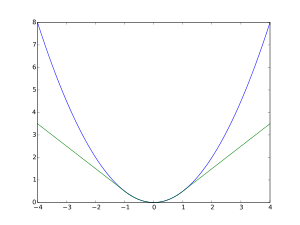

${\displaystyle L_{\delta }(a)={\begin{cases}{\frac {1}{2}}{a^{2}}&{\text{for }}|a|\leq \delta ,\\\delta \cdot \left(|a|-{\frac {1}{2}}\delta \right),&{\text{otherwise.}}\end{cases}}}$

<br>

This function is quadratic for small values of $a$, and linear for large values, with equal values and slopes of the different sections at the two points where $|a|=\delta$ . The variable a often refers to the residuals, that is to the difference between the observed and predicted values $a=y-f(x)$, so the former can be expanded to

${\displaystyle L_{\delta }(y,f(x))={\begin{cases}{\frac {1}{2}}(y-f(x))^{2}&{\textrm {for}}|y-f(x)|\leq \delta ,\\\delta \ \cdot \left(|y-f(x)|-{\frac {1}{2}}\delta \right),&{\textrm {otherwise.}}\end{cases}}}$  

In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

import tensorflow as tf

In [ ]:
def generate_data(size=100):
    eps = stats.norm.rvs(loc=0, scale=0.2, size=size) * 30
    x = np.linspace(0, 10, size)
    y = x**2 + eps
    return x, y

def plot_dataset(x, y, title):
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.title(title)
    sns.scatterplot(x=x, y=y)
    plt.show()

def load_dataset(x, y):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    # split the dataset into train and test sets
    train_dataset = dataset.take(80)
    test_dataset = dataset.skip(80)
    # batch the datasets
    train_dataset = train_dataset.batch(8)
    test_dataset = test_dataset.batch(8)
    return train_dataset, test_dataset

def plot_regression_line(x, y, model, title):
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.title(title)
    sns.scatterplot(x=x, y=y)
    sns.lineplot(x=x, y=model.predict(x).flatten(), color='black')
    plt.show()

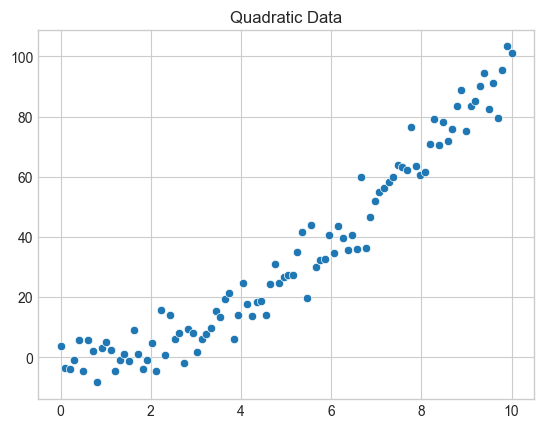

In [ ]:
x, y = generate_data(100)
train_dataset, test_dataset = load_dataset(x, y)

plot_dataset(x, y, 'Quadratic Data')

In [ ]:
# Code source: TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)
# Link: https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques\

class MyHuberLoss(tf.keras.losses.Loss):
    # initialize instance attributes
    def __init__(self, threshold=1):
        super().__init__()
        self.threshold = threshold

    # compute loss
    def call(self, y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) <= self.threshold
        small_error_loss = tf.square(error) / 2
        big_error_loss = self.threshold * (tf.abs(error) - (0.5 * self.threshold))
        return tf.where(is_small_error, small_error_loss, big_error_loss)

4/4 [==============================] - 0s 1ms/step


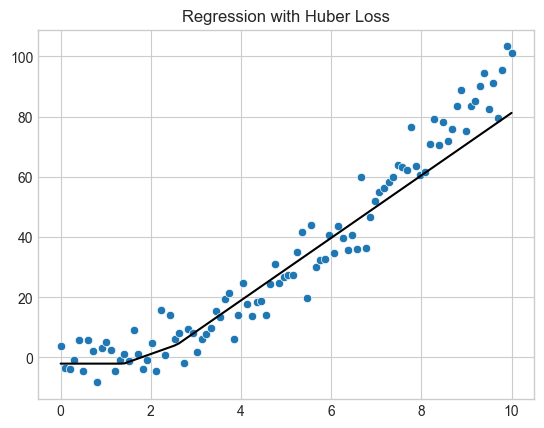

In [ ]:
# Define model
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(1,)),
    tf.keras.layers.Dense(3, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Compile the model
model.compile(tf.keras.optimizers.Adam(0.01),
              loss=MyHuberLoss(threshold=1.05),
              metrics=['mse', 'mae'])

# Train the model
model.fit(train_dataset, epochs=200, verbose=0)

# Plot the fit line
plot_regression_line(x, y, model, 'Regression with Huber Loss')

#### Custom Layers

**Reference**: [TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)](https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques)




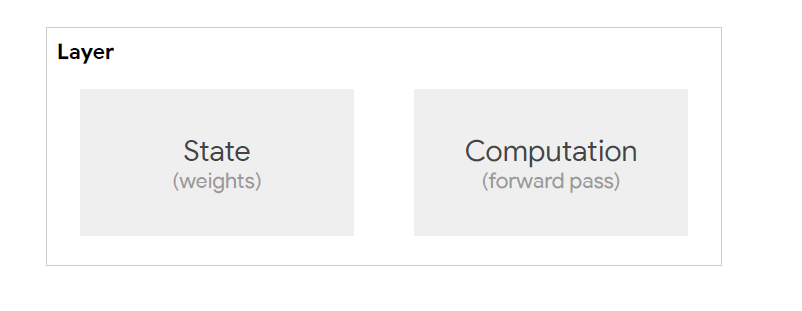

Image source: [DeepLearning.AI - Custom Models, Layers, and Loss Functions with TensorFlow](https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques)


**Dense Layer**

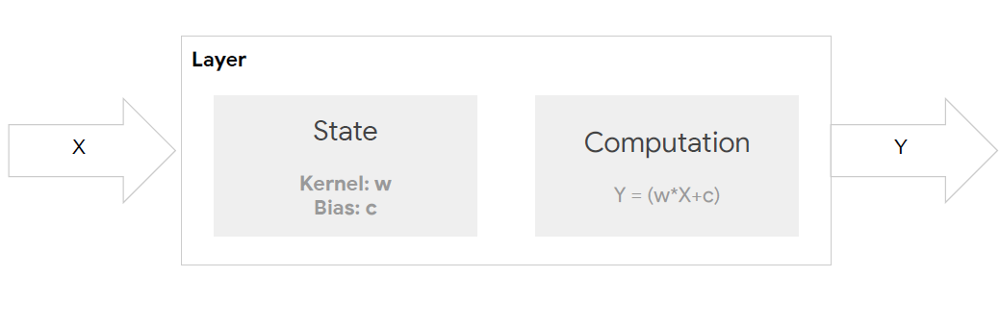

Image source: [DeepLearning.AI - Custom Models, Layers, and Loss Functions with TensorFlow](https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques)

Make custom *trainable* layer by inheriting from Keras's base [Layer](https://keras.io/api/layers/base_layer/#layer-class) class. This class requires the following functions:   

* `__init__()`
* `build()`: Where you define the *state* of the layer
* `call()`: Where you define the *computation*

In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

import tensorflow as tf

In [ ]:
def generate_data(size=100):
    eps = stats.norm.rvs(loc=0, scale=0.2, size=size) * 30
    x = np.linspace(0, 10, size)
    y = x**2 + eps
    return x, y

def plot_dataset(x, y, title):
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.title(title)
    sns.scatterplot(x=x, y=y)
    plt.show()

def load_dataset(x, y):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    # split the dataset into train and test sets
    train_dataset = dataset.take(80)
    test_dataset = dataset.skip(80)
    # batch the datasets
    train_dataset = train_dataset.batch(8)
    test_dataset = test_dataset.batch(8)
    return train_dataset, test_dataset

def plot_regression_line(x, y, model, title):
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.title(title)
    sns.scatterplot(x=x, y=y)
    sns.lineplot(x=x, y=model.predict(x).flatten(), color='black')
    plt.show()

In [ ]:
# Code source: TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)
# Link: https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques\

class CustomDense(tf.keras.layers.Layer):
    def __init__(self, units):
        super(CustomDense, self).__init__()
        self.units = units

    def build(self, input_shape):
        # Define layer state
        w_init = tf.keras.initializers.HeNormal()
        b_init = tf.keras.initializers.Zeros()

        self.w = tf.Variable(name='weights',
                             initial_value=w_init(shape=(input_shape[-1], self.units)),
                             trainable=True)
        self.b = tf.Variable(name='bias',
                             initial_value=b_init(shape=(self.units)),
                             trainable=True)

    def call(self, inputs):
        computation = tf.matmul(inputs, self.w) + self.b
        return computation

In [ ]:
# Code source: TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)
# Link: https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques\

# Add activation function

class CustomDense(tf.keras.layers.Layer):
    def __init__(self, units, activation=None):
        super(CustomDense, self).__init__()
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # define layer state (w, b)
        w_init = tf.keras.initializers.HeNormal()
        b_init = tf.keras.initializers.Zeros()

        self.w = tf.Variable(name='weights',
                             initial_value=w_init(shape=(input_shape[-1], self.units)),
                             trainable=True)
        self.b = tf.Variable(name='bias',
                             initial_value=b_init(shape=(self.units)),
                             trainable=True)

    def call(self, inputs):
        computation = tf.matmul(inputs, self.w) + self.b
        return self.activation(computation)

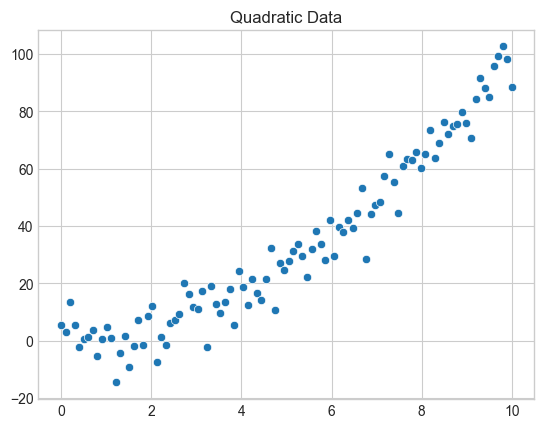

In [ ]:
x, y = generate_data(100)
train_dataset, test_dataset = load_dataset(x, y)

plot_dataset(x, y, 'Quadratic Data')

4/4 [==============================] - 0s 1ms/step


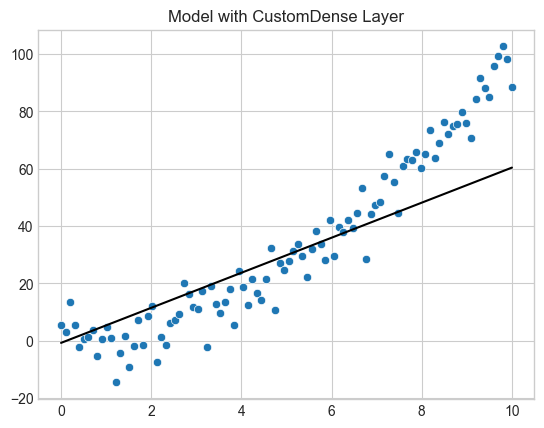

In [ ]:
# Create the model
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(1,)),
    CustomDense(1)
])

# Compile the model
model.compile(tf.keras.optimizers.Adam(0.01),
              loss='mse',
              metrics=['mse', 'mae'])

# Train the model
model.fit(train_dataset, epochs=200, verbose=0)

# Plot the fit line
plot_regression_line(x, y, model, 'Model with CustomDense Layer')

In [ ]:
# Code source: TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)
# Link: https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques\

class CustomQuadratic(tf.keras.layers.Layer):
    def __init__(self, units, activation=None):
        super(CustomQuadratic, self).__init__()
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # define layer state (w1, w2, b)
        w1_init = tf.keras.initializers.HeNormal()
        w2_init = tf.keras.initializers.HeNormal()
        b_init = tf.keras.initializers.Zeros()

        self.w1 = tf.Variable(name='weights-qudratic',
                             initial_value=w1_init(shape=(input_shape[-1], self.units)),
                             trainable=True)
        self.w2 = tf.Variable(name='weights-linear',
                             initial_value=w2_init(shape=(input_shape[-1], self.units)),
                             trainable=True)
        self.b = tf.Variable(name='bias',
                             initial_value=b_init(shape=(self.units)),
                             trainable=True)

    def call(self, inputs):
        # compute quadratic term
        squared_inputs = tf.math.square(inputs)
        # do the computation: w1*X^2 + w2*X + b
        computation = tf.matmul(squared_inputs, self.w1) + tf.matmul(inputs, self.w2) + self.b
        return self.activation(computation)

4/4 [==============================] - 0s 1ms/step


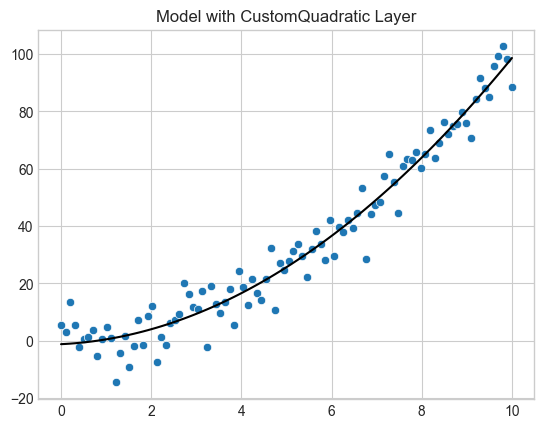

In [ ]:
# Create the model
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(1,)),
    CustomQuadratic(1)
])

# Compile the model
model.compile(tf.keras.optimizers.Adam(0.01),
              loss='mse',
              metrics=['mse', 'mae'])

# Train the model
model.fit(train_dataset, epochs=200, verbose=0)

# Plot the fit line
plot_regression_line(x, y, model, 'Model with CustomQuadratic Layer')

### Custom Models (Subclassing API)

**Reference**: [TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)](https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques)


Limitations of Sequential/Functional APIs:  
* Only suited to models that are Directed Acyclic Graphs of layers e.g. `MobileNet`, `Inception`, etc.
* More exotic architecture e.g. *dynamic* and *recursive* networks

Benefits of Subclassing Models:
* Continue to use functional and sequential code
* Modular architecture
* Try out experiments quickly
* Control flow in the network


| Feature                 | Functional API                                  | Subclassing API                                       |
|-------------------------|-------------------------------------------------|--------------------------------------------------------|
| Training Loop Control     | Limited                                         | Full control over `train_step` and `test_step` methods  |
| State Management         | Primarily stateless layers                         | Can define models with internal state                   |
| Model Architecture       | Flexible, but can be cumbersome for complex models | More freedom for intricate architectures and control flow |

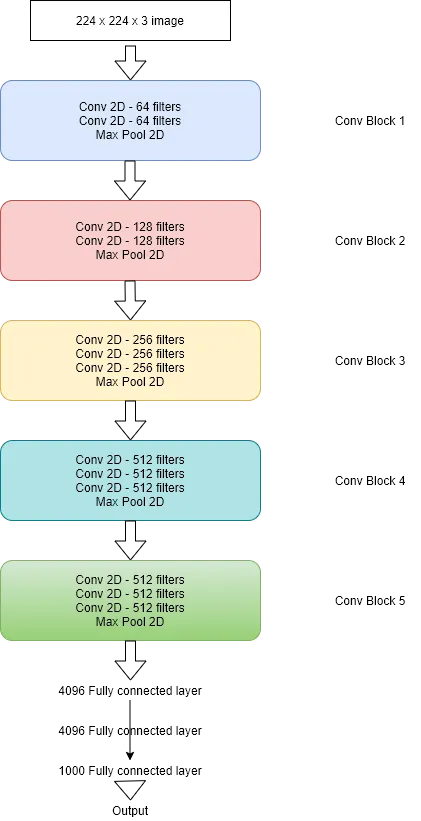

Image source: [Creating VGG from Scratch using Tensorflow](https://towardsdatascience.com/creating-vgg-from-scratch-using-tensorflow-a998a5640155)

In [ ]:
import tensorflow as tf

In [ ]:
def conv_block(block_inputs, repititions, filters):
    x = block_inputs
    for _ in range(repititions):
        x = tf.keras.layers.Conv2D(filters, kernel_size=3, padding='same', activation='relu')(x)
    block_output = tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='same')(x)
    return block_output

def VGG16(num_classes=1000):
    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = inputs
    for filters, repititions in zip([64, 128, 256, 512, 512], [2, 2, 3, 3, 3]):
        x = conv_block(x, repititions, filters)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs, name='VGG16')
    model.summary()
    return model

In [ ]:
functional_vgg = VGG16(num_classes=1000)

Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                             

In [ ]:
class ConvBlock(tf.keras.Model):
    def __init__(self, repititions, filters, kernel_size=3, strides=2, pool_size=2):
        super(ConvBlock, self).__init__()
        self.repititions = repititions
        self.filters = filters
        self.kernel_size = kernel_size
        self.strides = strides
        self.pool_size = pool_size
        self.conv_layers = [tf.keras.layers.Conv2D(self.filters, kernel_size=self.kernel_size, padding='same', activation='relu') \
                            for _ in range(self.repititions)]
        self.max_pool = tf.keras.layers.MaxPool2D(pool_size=self.pool_size, strides=self.strides, padding='same')

    def call(self, inputs):
        x = inputs
        for layer in self.conv_layers:
            x = layer(x)
        outputs = self.max_pool(x)
        return outputs

In [ ]:
class MLP(tf.keras.Model):
    def __init__(self, hidden_units, output_units):
        super(MLP, self).__init__()
        self.flatten = tf.keras.layers.Flatten()
        self.hidden_1 = tf.keras.layers.Dense(hidden_units, activation='relu')
        self.hidden_2 = tf.keras.layers.Dense(hidden_units, activation='relu')
        self.classification_head = tf.keras.layers.Dense(output_units, activation='softmax')

    def call(self, inputs):
        x = self.flatten(inputs)
        x = self.hidden_1(x)
        x = self.hidden_2(x)
        outputs = self.classification_head(x)
        return outputs

In [ ]:
class VGG16Class(tf.keras.Model):
    def __init__(self, num_classes):
        super(VGG16Class, self).__init__()
        self.conv_block_1 = ConvBlock(2, 64,  kernel_size=3, strides=2, pool_size=2)
        self.conv_block_2 = ConvBlock(2, 128, kernel_size=3, strides=2, pool_size=2)
        self.conv_block_3 = ConvBlock(3, 256, kernel_size=3, strides=2, pool_size=2)
        self.conv_block_4 = ConvBlock(3, 512, kernel_size=3, strides=2, pool_size=2)
        self.conv_block_5 = ConvBlock(3, 512, kernel_size=3, strides=2, pool_size=2)
        self.classifier = MLP(4096, num_classes)

    def call(self, inputs):
        x = self.conv_block_1(inputs)
        x = self.conv_block_2(x)
        x = self.conv_block_3(x)
        x = self.conv_block_4(x)
        x = self.conv_block_5(x)
        outputs = self.classifier(x)
        return outputs

In [ ]:
subclassed_vgg = VGG16Class(num_classes=1000)
subclassed_vgg(tf.ones((1, 224, 224, 3)))
subclassed_vgg.summary()

Model: "vgg16_class"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_block (ConvBlock)      multiple                  38720     
                                                                 
 conv_block_1 (ConvBlock)    multiple                  221440    
                                                                 
 conv_block_2 (ConvBlock)    multiple                  1475328   
                                                                 
 conv_block_3 (ConvBlock)    multiple                  5899776   
                                                                 
 conv_block_4 (ConvBlock)    multiple                  7079424   
                                                                 
 mlp (MLP)                   multiple                  123642856 
                                                                 
Total params: 138,357,544
Trainable params: 138,357,544

In [ ]:
# now you can access blocks directly!
subclassed_vgg.conv_block_1.summary()

Model: "conv_block"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          multiple                  1792      
                                                                 
 conv2d_14 (Conv2D)          multiple                  36928     
                                                                 
 max_pooling2d_5 (MaxPooling  multiple                 0         
 2D)                                                             
                                                                 
Total params: 38,720
Trainable params: 38,720
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# plus layers in each block
subclassed_vgg.conv_block_1.layers

### Custom Training

**Reference**: [TensorFlow: Advanced Techniques Specialization (Custom Models, Layers, and Loss Functions with TensorFlow)](https://www.coursera.org/learn/custom-models-layers-loss-functions-with-tensorflow?specialization=tensorflow-advanced-techniques)


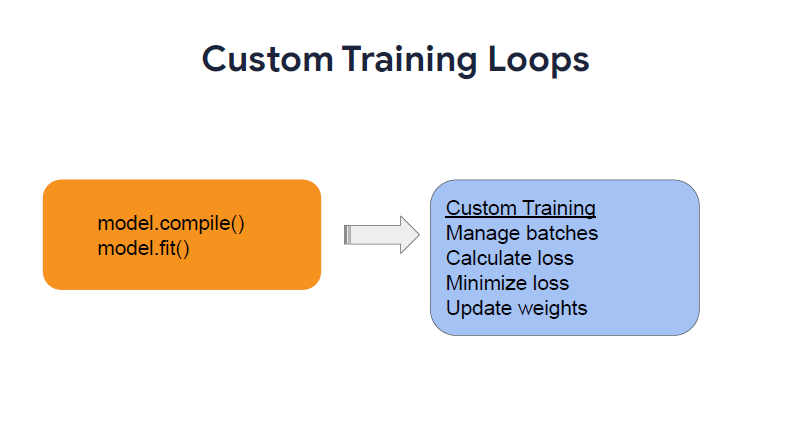

Image source: [DeepLearning.AI - Custom and Distributed Training with TensorFlow](https://www.coursera.org/learn/custom-distributed-training-with-tensorflow?specialization=tensorflow-advanced-techniques)



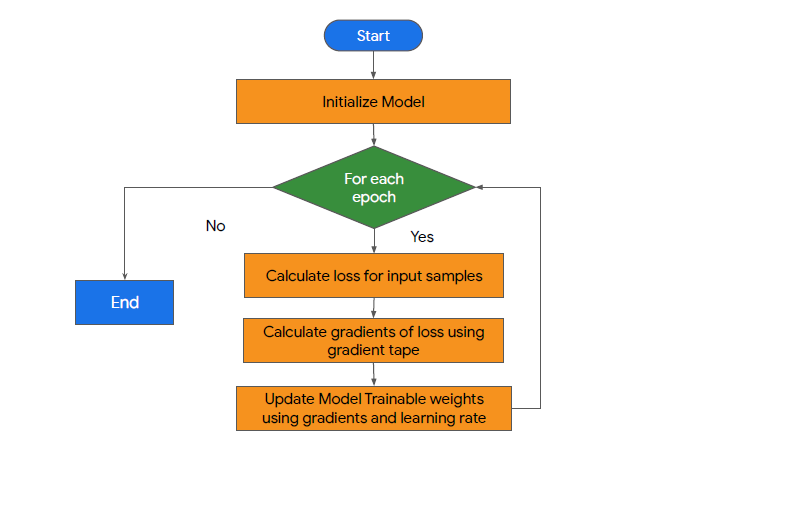


Image source: [DeepLearning.AI - Custom and Distributed Training with TensorFlow](https://www.coursera.org/learn/custom-distributed-training-with-tensorflow?specialization=tensorflow-advanced-techniques)


#### Automatic Differentiation with `tf.GradientTape()`

**Reference:** [Introduction to gradients and automatic differentiation - Tensorflow Official Documentation](https://www.tensorflow.org/guide/autodiff)

In [ ]:
import tensorflow as tf

In [ ]:
x = tf.Variable(3.0)

with tf.GradientTape() as tape:
    # you can the tape to watch 'x'
    # but it's not necessary in general
    # there are special use case for this
    tape.watch(x)
    y = x**2
# dy = 2x * dx
dy_dx = tape.gradient(y, x)
dy_dx.numpy()

6.0

In [ ]:
layer = tf.keras.layers.Dense(2, activation='relu')
x = tf.constant([[1., 2., 3.]])

with tf.GradientTape() as tape:
  # Forward pass
  y = layer(x)
  loss = tf.reduce_mean(y**2)

# Calculate gradients with respect to every trainable variable
grad = tape.gradient(loss, layer.trainable_variables)

for var, g in zip(layer.trainable_variables, grad):
  print(f'{var.name}, shape: {g.shape}')

dense/kernel:0, shape: (3, 2)
dense/bias:0, shape: (2,)


#### Custom Training Loop

**Reference:** [Custom training: walkthrough - Tensorflow Official Documentation](https://www.tensorflow.org/tutorials/customization/custom_training_walkthrough)

In [ ]:
import time
import tensorflow as tf
import tensorflow_datasets as tfds

In [ ]:
ds_preview, info = tfds.load('penguins/simple', split='train', with_info=True)
df = tfds.as_dataframe(ds_preview.take(5), info)
df.head()

,body_mass_g,culmen_depth_mm,culmen_length_mm,flipper_length_mm,island,sex,species
0,4200.0,13.9,45.500000,210.0,0,0,2
1,4650.0,13.7,40.900002,214.0,0,0,2
2,5300.0,14.2,51.299999,218.0,0,1,2
3,5650.0,15.0,47.799999,215.0,0,1,2
4,5050.0,15.8,46.299999,215.0,0,1,2


In [ ]:
(ds_test, ds_train), info = tfds.load("penguins/processed", split=['train[:20%]', 'train[20%:]'], as_supervised=True, with_info=True)

df_train = tfds.as_dataframe(ds_train.take(5), info)
df_test = tfds.as_dataframe(ds_test.take(5), info)

ds_train_batch = ds_train.batch(32)
ds_test_batch = ds_test.batch(32)

In [ ]:
class MLP(tf.keras.Model):
    def __init__(self, hidden_units=10, hidden_layers=2, num_classes=3):
        super(MLP, self).__init__()
        self.hidden_layers = [tf.keras.layers.Dense(hidden_units, activation='relu') for _ in range(hidden_layers)]
        self.classification_head = tf.keras.layers.Dense(num_classes)

    def call(self, inputs):
        x = inputs
        for layer in self.hidden_layers:
            x = layer(x)
        return self.classification_head(x)

In [ ]:
# Get model
model = MLP(hidden_units=10, hidden_layers=2, num_classes=3)

# Instantiate an optimizer to train the model
optimizer = tf.keras.optimizers.Adam()

# Instantiate a loss function.
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

In [ ]:
train_loss_results = []
train_accuracy_results = []

EPOCHS = 101
for epoch in range(EPOCHS):
  start_time = time.time()

  ## Set up loss object and metric(s)
  epoch_loss_avg = tf.keras.metrics.Mean()
  epoch_accuracy = tf.keras.metrics.SparseCategoricalAccuracy()
  epoch_test_accuracy = tf.keras.metrics.Accuracy()

  ## Training loop using batches
  for x, y in ds_train_batch:

    ## Optimize the model
    with tf.GradientTape() as tape:
        # forward prop
        preds = model(x, training=True)
        # back prop
        loss_value = loss_fn(y_true=y, y_pred=preds)
        grads = tape.gradient(loss_value, model.trainable_variables)
        # update weights
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

    ## Track progress
    epoch_loss_avg.update_state(loss_value) # Add current batch loss
    # compare predicted label to actual label
    # training=True is needed only if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
    epoch_accuracy.update_state(y, model(x, training=True))

  ## Keep training results for plotting
  train_loss_results.append(epoch_loss_avg.result())
  train_accuracy_results.append(epoch_accuracy.result())

  ## Run a validation loop at the end of each epoch
  for x_val, y_val in ds_test_batch:
    # training=False is needed only if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
    val_logits = model(x_val, training=False)
    predictions = tf.math.argmax(val_logits, axis=1, output_type=tf.int64)
    epoch_test_accuracy(predictions, y_val)

  if epoch % 20 == 0:
    duration = time.time() - start_time
    print("Epoch {:03d}: Loss: {:.3f}, Accuracy: {:.3%}, Test Accuracy: {:.3%} - Time Taken: {:.2f} sec.".format(epoch,
                                                                                                                 epoch_loss_avg.result(),
                                                                                                                 epoch_accuracy.result(),
                                                                                                                 epoch_test_accuracy.result(),
                                                                                                                 duration))

Epoch 000: Loss: 1.160, Accuracy: 44.944%, Test Accuracy: 38.806% - Time Taken: 0.32 sec.
Epoch 020: Loss: 0.629, Accuracy: 81.648%, Test Accuracy: 77.612% - Time Taken: 0.13 sec.
Epoch 040: Loss: 0.261, Accuracy: 96.255%, Test Accuracy: 97.015% - Time Taken: 0.12 sec.
Epoch 060: Loss: 0.133, Accuracy: 97.753%, Test Accuracy: 98.507% - Time Taken: 0.12 sec.
Epoch 080: Loss: 0.080, Accuracy: 97.753%, Test Accuracy: 98.507% - Time Taken: 0.13 sec.
Epoch 100: Loss: 0.052, Accuracy: 98.502%, Test Accuracy: 98.507% - Time Taken: 0.12 sec.


#### AutoGraph

**Reference**: [TensorFlow: Advanced Techniques Specialization (Custom and Distributed Training with TensorFlow)](https://www.coursera.org/learn/custom-distributed-training-with-tensorflow?specialization=tensorflow-advanced-techniques)


* The `@tf.function` decorator automatically generates the graph-style code.
* Call `tf.autograph.to_code()` to see what the generated code looks like

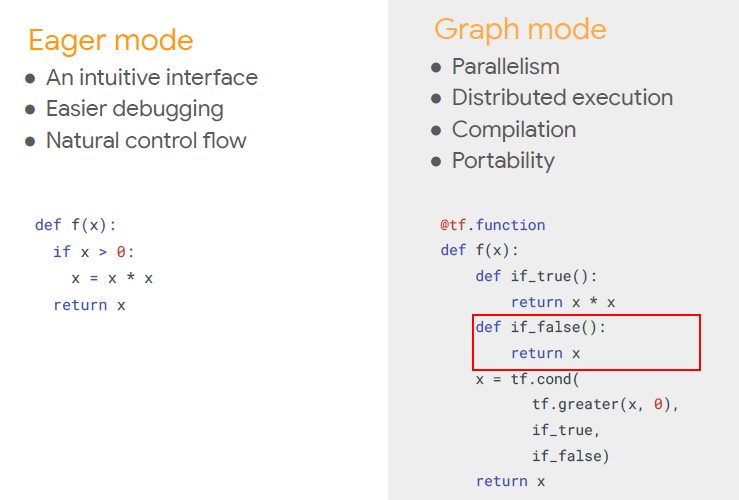

Image source: [DeepLearning.AI - Custom and Distributed Training with TensorFlow](https://www.coursera.org/learn/custom-distributed-training-with-tensorflow?specialization=tensorflow-advanced-techniques)


In [ ]:
import tensorflow as tf

@tf.function
def func(x):
    if x > 0:
        x = x * x
    return x

In [ ]:
print(tf.autograph.to_code(func.python_function))

def tf__func(x):
    with ag__.FunctionScope('func', 'fscope', ag__.ConversionOptions(recursive=True, user_requested=True, optional_features=(), internal_convert_user_code=True)) as fscope:
        do_return = False
        retval_ = ag__.UndefinedReturnValue()

        def get_state():
            return (x,)

        def set_state(vars_):
            nonlocal x
            (x,) = vars_

        def if_body():
            nonlocal x
            x = ag__.ld(x) * ag__.ld(x)

        def else_body():
            nonlocal x
            pass
        ag__.if_stmt(ag__.ld(x) > 0, if_body, else_body, get_state, set_state, ('x',), 1)
        try:
            do_return = True
            retval_ = ag__.ld(x)
        except:
            do_return = False
            raise
        return fscope.ret(retval_, do_return)



**Speed Up Training with Graph Mode Execution**

In [ ]:
# Get model
model = MLP(hidden_units=10, hidden_layers=2, num_classes=3)

# Instantiate an optimizer to train the model
optimizer = tf.keras.optimizers.Adam()

# Instantiate a loss function.
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

In [ ]:
@tf.function
def train_step(x, y):
    with tf.GradientTape() as tape:
        preds = model(x, training=True)
        loss_value = loss_fn(y_true=y, y_pred=preds)
    grads = tape.gradient(loss_value, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return loss_value

In [ ]:
@tf.function
def test_step(x, y):
    val_logits = model(x, training=False)
    predictions = tf.math.argmax(val_logits, axis=1, output_type=tf.int64)
    return predictions

In [ ]:
EPOCHS = 101
for epoch in range(EPOCHS):
  start_time = time.time()

  ## Set up loss object and metrics
  epoch_loss_avg = tf.keras.metrics.Mean()
  epoch_accuracy = tf.keras.metrics.SparseCategoricalAccuracy()
  epoch_test_accuracy = tf.keras.metrics.Accuracy()

  ## Training loop using batches
  for x, y in ds_train_batch:
    loss_value = train_step(x, y)
    epoch_loss_avg.update_state(loss_value)
    epoch_accuracy.update_state(y, model(x, training=True))

  ## Run a validation loop at the end of each epoch
  for x_val, y_val in ds_test_batch:
    predictions = test_step(x_val, y_val)
    epoch_test_accuracy(predictions, y_val)

  if epoch % 20 == 0:
    duration = time.time() - start_time
    print("Epoch {:03d}: Loss: {:.3f}, Accuracy: {:.3%}, Test Accuracy: {:.3%} - Time Taken: {:.2f} sec.".format(epoch,
                                                                                                                 epoch_loss_avg.result(),
                                                                                                                 epoch_accuracy.result(),
                                                                                                                 epoch_test_accuracy.result(),
                                                                                                                 duration))

Epoch 000: Loss: 1.063, Accuracy: 34.831%, Test Accuracy: 55.224% - Time Taken: 0.82 sec.
Epoch 020: Loss: 0.667, Accuracy: 80.524%, Test Accuracy: 76.119% - Time Taken: 0.05 sec.
Epoch 040: Loss: 0.431, Accuracy: 80.524%, Test Accuracy: 76.119% - Time Taken: 0.05 sec.
Epoch 060: Loss: 0.323, Accuracy: 85.393%, Test Accuracy: 86.567% - Time Taken: 0.04 sec.
Epoch 080: Loss: 0.226, Accuracy: 95.506%, Test Accuracy: 97.015% - Time Taken: 0.05 sec.
Epoch 100: Loss: 0.149, Accuracy: 97.004%, Test Accuracy: 97.015% - Time Taken: 0.05 sec.


In [ ]:
# Cut the traning time almost by half!

### Model Interpretation - Saliency

**Main Reference**: [TensorFlow: Advanced Techniques Specialization (Advanced Computer Vision with TensorFlow) - Coursera](https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow)

Gradient-based saliency methods leverage the gradients of a model's output with respect to the input image to understand which parts of the input image most strongly influence the model's decision.  
* **The Goal**: Pixel Importance. We want to generate a saliency map, which is essentially a heatmap overlaid on the input image. Each pixel in the heatmap will represent the "importance" of that pixel in influencing the model's output (e.g., classification score). Higher values mean more important.  
* **Gradient-Based Intuition**: The core idea is that the gradient of the output (say, the score for a specific class) with respect to the input image pixels tells us how much a small change in each pixel would affect the output score. Large gradients indicate pixels that have a significant impact on the model's decision.

In [ ]:
## Code sources:

# DeepLearning.AI - Advanced Computer Vision with TensorFlow
# link: https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow

# Integrated gradients - TensorFlow official documentation
# link: https://www.tensorflow.org/tutorials/interpretability/integrated_gradients

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
def download_image():
    !wget -O image.jpg http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg

def read_image(file_name):
    img = cv2.imread(file_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224)) / 255.0
    return img

def plot_image(image, title):
    plt.figure(figsize=(5,5))
    plt.imshow(image)
    plt.axis('off')
    plt.title(title)
    plt.show()

def load_image():
    download_image()
    image = read_image('image.jpg')
    plot_image(image, 'Giant Panda')
    return image

def load_imagenet_labels(file_path):
  labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
  with open(labels_file) as reader:
    f = reader.read()
    labels = f.splitlines()
  return np.array(labels)

def get_class_index_in_imagenet(class_name):
    imagenet_labels = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')
    return np.where(imagenet_labels == class_name)[0][0]

In [ ]:
# load a pretrained model i.e., transfer learning
model = tf.keras.Sequential([
    hub.KerasLayer(handle='https://tfhub.dev/google/tf2-preview/inception_v3/classification/4', name='InceptionV3'),
    tf.keras.layers.Activation('softmax', name='Softmax')
    ], name='Inception V3')
model.build([None, 224, 224, 3])
model.summary()

Model: "Inception V3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 InceptionV3 (KerasLayer)    (None, 1001)              23853833  
                                                                 
 Softmax (Activation)        (None, 1001)              0         
                                                                 
Total params: 23,853,833
Trainable params: 0
Non-trainable params: 23,853,833
_________________________________________________________________


--2025-04-09 13:01:09--  http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.191.251, 172.217.5.27, 142.250.190.123, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.191.251|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 802859 (784K) [image/jpeg]
Saving to: 'image.jpg'

     0K .......... .......... .......... .......... ..........  6%  251K 3s
    50K .......... .......... .......... .......... .......... 12% 3.62M 1s
   100K .......... .......... .......... .......... .......... 19% 4.08M 1s
   150K .......... .......... .......... .......... .......... 25% 53.6M 1s
   200K .......... .......... .......... .......... .......... 31% 10.8M 0s
   250K .......... .......... .......... .......... .......... 38% 6.46M 0s
   300K .......... .......... .......... .......... .......... 44% 16.1M 0s
   350K .......... .......... ..........

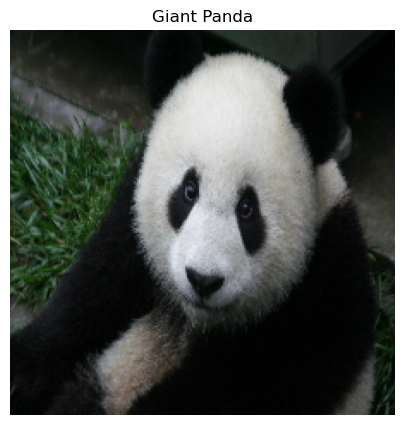

In [ ]:
img = load_image()

In [ ]:
# define the class and number of classes
num_classes = model.output_shape[1]
class_index = get_class_index_in_imagenet(class_name='giant panda')

# add a batch dimension in front
image = np.expand_dims(img, axis=0)

# get the expected output: convert class index to one-hot vector
expected_output = tf.one_hot([class_index] * image.shape[0], num_classes)

# compute gradients with resp
with tf.GradientTape() as tape:

    # cast image to float
    inputs = tf.cast(image, tf.float32)

    # watch the input pixels
    tape.watch(inputs)

    # generate the predictions
    predictions = model(inputs)

    # get the loss
    loss = tf.keras.losses.categorical_crossentropy(expected_output,
                                                    predictions)
# get the gradients of loss with respect to input image
gradients = tape.gradient(loss, inputs)

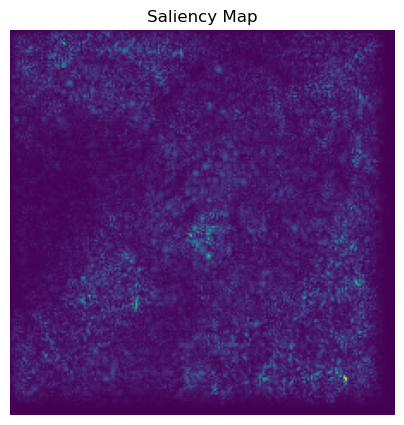

In [ ]:
# reduce the RGB image to grayscale
grayscale_tensor = tf.reduce_sum(tf.abs(gradients), axis=-1)

# normalize the pixel values to be in the range [0, 255].
# the max value in the grayscale tensor will be pushed to 255.
# the min value will be pushed to 0.
denormalized_tensor = tf.cast(
    255
    * (grayscale_tensor - tf.reduce_min(grayscale_tensor))
    / (tf.reduce_max(grayscale_tensor) - tf.reduce_min(grayscale_tensor)),
    tf.uint8,
)

# remove the channel dimension to make the tensor a 2d tensor
denormalized_tensor = tf.squeeze(denormalized_tensor)
plot_image(denormalized_tensor, 'Saliency Map')

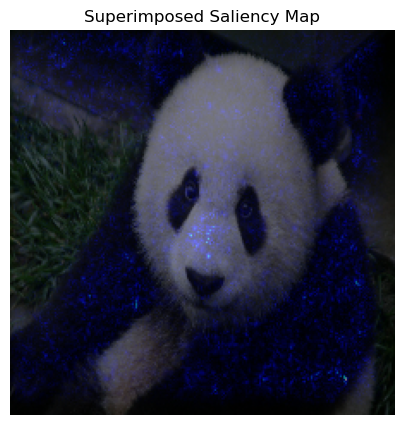

In [ ]:
# superimpose the normalized tensor to the input image
gradient_color = cv2.applyColorMap(denormalized_tensor.numpy(), cv2.COLORMAP_HOT)
gradient_color = gradient_color / 255.0
super_imposed = cv2.addWeighted(img, 0.5, gradient_color, 0.5, 0.0)
plot_image(super_imposed, 'Superimposed Saliency Map')

### AutoEncoders



#### Concept

**Reference**: [TensorFlow: Advanced Techniques Specialization (Generative Deep Learning with TensorFlow) - Coursera](https://www.coursera.org/learn/generative-deep-learning-with-tensorflow?specialization=tensorflow-advanced-techniques)

* Learning representation of input data without supervision  (learns efficient ways to represent data)
* Common applications:
    * Denoising
    * Anomaly detection

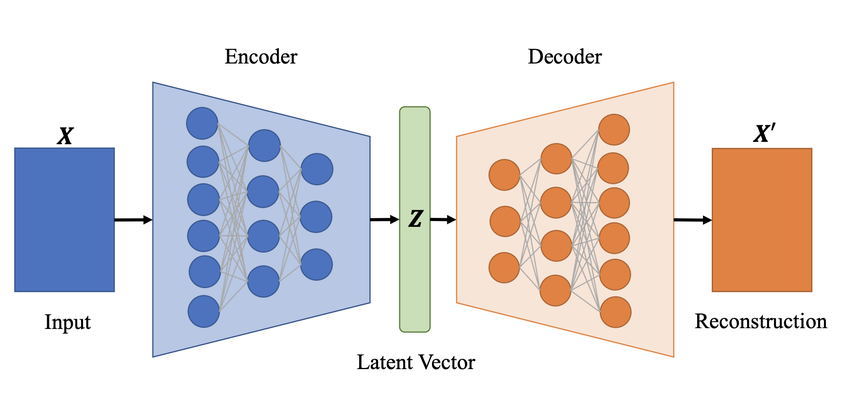

Image source: [Deep Learning in Single-Cell Analysis](https://www.researchgate.net/publication/364690235_Deep_Learning_in_Single-Cell_Analysis)

#### Simple AutoEncoder

**Reference:** [TensorFlow: Advanced Techniques Specialization (Generative Deep Learning with TensorFlow)](https://www.coursera.org/learn/generative-deep-learning-with-tensorflow?specialization=tensorflow-advanced-techniques)

In [ ]:
# Code source: DeepLearning.AI - Generative Deep Learning with TensorFlow
# Link: https://www.coursera.org/learn/generative-deep-learning-with-tensorflow?specialization=tensorflow-advanced-techniques)

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def map_image(image, label):
  '''Normalizes and flattens the image. Returns image as input and label.'''
  image = tf.cast(image, dtype=tf.float32)
  image = image / 255.0
  image = tf.reshape(image, shape=(784,))
  return image, image

def display_one_row(disp_images, offset, shape=(28, 28)):
  '''Display sample outputs in one row.'''
  for idx, test_image in enumerate(disp_images):
    plt.subplot(3, 10, offset + idx + 1)
    plt.xticks([])
    plt.yticks([])
    test_image = np.reshape(test_image, shape)
    plt.imshow(test_image, cmap='gray')

def display_results(disp_input_images, disp_encoded, disp_predicted, enc_shape=(8,4)):
  '''Displays the input, encoded, and decoded output values.'''
  plt.figure(figsize=(15, 5))
  display_one_row(disp_input_images, 0, shape=(28,28,))
  display_one_row(disp_encoded, 10, shape=enc_shape)
  display_one_row(disp_predicted, 20, shape=(28,28,))

In [ ]:
train_dataset = tfds.load('mnist', as_supervised=True, split="train")
train_dataset = train_dataset.map(map_image)
train_dataset = train_dataset.batch(8)

test_dataset = tfds.load('mnist', as_supervised=True, split="test")
test_dataset = test_dataset.map(map_image)
test_dataset = test_dataset.batch(8)

In [ ]:
train_dataset = tfds.load('mnist', as_supervised=True, split="train")
train_dataset = train_dataset.map(map_image)
train_dataset = train_dataset.batch(8)

test_dataset = tfds.load('mnist', as_supervised=True, split="test")
test_dataset = test_dataset.map(map_image)
test_dataset = test_dataset.batch(8)

In [ ]:
class Autoencoder(tf.keras.Model):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = tf.keras.layers.Dense(32, activation='relu')
        self.decoder = tf.keras.layers.Dense(784, activation='sigmoid')

    def call(self, inputs):
        encoded = self.encoder(inputs)
        reconstructed = self.decoder(encoded)
        return reconstructed

In [ ]:
model = Autoencoder()
model.compile(optimizer='adam', loss='binary_crossentropy')
model.fit(train_dataset, epochs=10, validation_data=test_dataset)

Epoch 1/10
7500/7500 [==============================] - 8s 1ms/step - loss: 0.1255 - val_loss: 0.0965
Epoch 2/10
7500/7500 [==============================] - 7s 975us/step - loss: 0.0965 - val_loss: 0.0944
Epoch 3/10
7500/7500 [==============================] - 7s 970us/step - loss: 0.0955 - val_loss: 0.0939
Epoch 4/10
7500/7500 [==============================] - 7s 936us/step - loss: 0.0952 - val_loss: 0.0936
Epoch 5/10
7500/7500 [==============================] - 8s 1ms/step - loss: 0.0949 - val_loss: 0.0934
Epoch 6/10
7500/7500 [==============================] - 8s 1ms/step - loss: 0.0947 - val_loss: 0.0933
Epoch 7/10
7500/7500 [==============================] - 8s 1ms/step - loss: 0.0946 - val_loss: 0.0932
Epoch 8/10
7500/7500 [==============================] - 8s 1ms/step - loss: 0.0944 - val_loss: 0.0930
Epoch 9/10
7500/7500 [==============================] - 8s 1ms/step - loss: 0.0943 - val_loss: 0.0930
Epoch 10/10
7500/7500 [==============================] - 8s 1ms/step - loss:

In [ ]:
test_images = test_dataset.as_numpy_iterator().next()[0]

trained_encoder = model.layers[0]
encoded_images = trained_encoder(test_images)
reconstructed_images = model.predict(test_images)

1/1 [==============================] - 0s 81ms/step


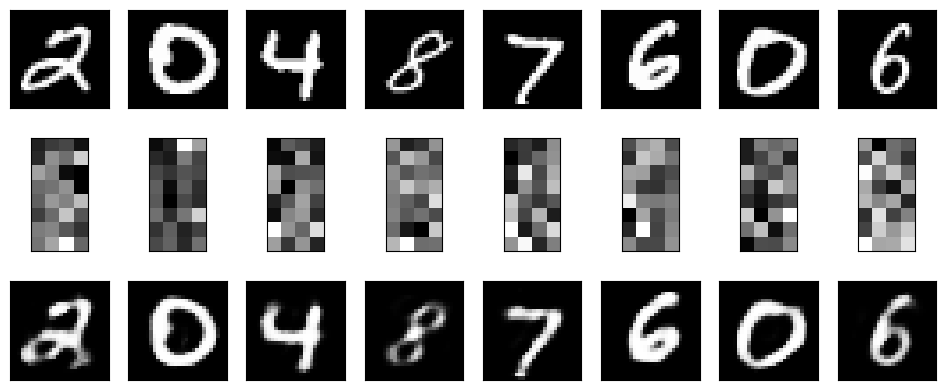

In [ ]:
display_results(test_images, encoded_images, reconstructed_images)

#### Denoising with Convolutional AutoEncoders

**Reference:** [TensorFlow: Advanced Techniques Specialization (Generative Deep Learning with TensorFlow)](https://www.coursera.org/learn/generative-deep-learning-with-tensorflow?specialization=tensorflow-advanced-techniques)

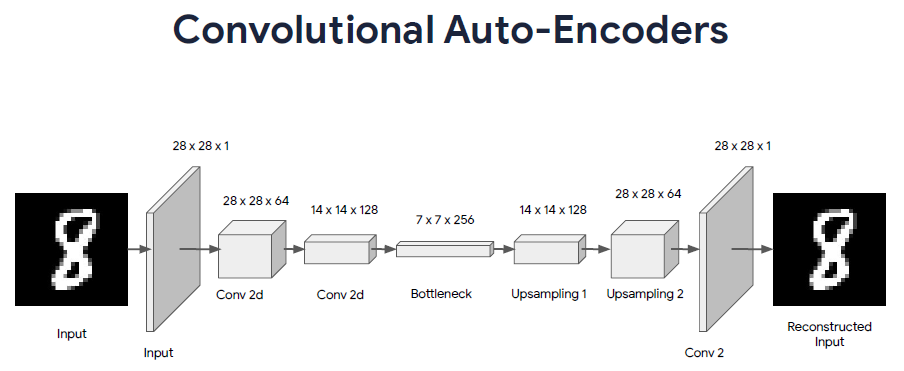

Image source: [DeepLearning.AI - Generative Deep Learning with TensorFlow](https://www.coursera.org/learn/generative-deep-learning-with-tensorflow?specialization=tensorflow-advanced-techniques)

In [ ]:
# Code source: DeepLearning.AI - Generative Deep Learning with TensorFlow
# Link: https://www.coursera.org/learn/generative-deep-learning-with-tensorflow?specialization=tensorflow-advanced-techniques)

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def map_image_with_noise(image, label):
  '''Normalizes the images and generates noisy inputs.'''
  image = tf.cast(image, dtype=tf.float32)
  image = image / 255.0
  noise_factor = 0.3
  factor = noise_factor * tf.random.normal(shape=image.shape)
  image_noisy = image + factor
  image_noisy = tf.clip_by_value(image_noisy, 0.0, 1.0)
  return image_noisy, image

def display_one_row(disp_images, offset, shape=(28, 28)):
  '''Display sample outputs in one row.'''
  for idx, test_image in enumerate(disp_images):
    plt.subplot(3, 10, offset + idx + 1)
    plt.xticks([])
    plt.yticks([])
    test_image = np.reshape(test_image, shape)
    plt.imshow(test_image, cmap='gray')

def display_results(disp_input_images, disp_encoded, disp_predicted, enc_shape=(8,4)):
  '''Displays the input, encoded, and decoded output values.'''
  plt.figure(figsize=(15, 5))
  display_one_row(disp_input_images, 0, shape=(28,28,))
  display_one_row(disp_encoded, 10, shape=enc_shape)
  display_one_row(disp_predicted, 20, shape=(28,28,))

In [ ]:
BATCH_SIZE = 128
SHUFFLE_BUFFER_SIZE = 1024

train_dataset = tfds.load('fashion_mnist', as_supervised=True, split="train")
train_dataset = train_dataset.map(map_image_with_noise)
train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)

test_dataset = tfds.load('fashion_mnist', as_supervised=True, split="test")
test_dataset = test_dataset.map(map_image_with_noise)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
class ConvAutoencoder(tf.keras.Model):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()

        # define encoder as Model object
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'),
            tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
            tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'),
            tf.keras.layers.MaxPooling2D(pool_size=(2, 2))], name='Encoder')

        # define bottleneck and visualization as Layer
        self.bottleneck = tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same', name='Bottleneck')
        self.encoder_visualization = tf.keras.layers.Conv2D(filters=1, kernel_size=(3, 3), activation='sigmoid', padding='same', name='EncoderVisualization')

        # define decoder as Model object
        self.decoder = tf.keras.Sequential([
            tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'),
            tf.keras.layers.UpSampling2D(size=(2, 2)),
            tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'),
            tf.keras.layers.UpSampling2D(size=(2, 2)),
            tf.keras.layers.Conv2D(filters=1, kernel_size=(3, 3), activation='sigmoid', padding='same')], name='Decoder')

    def call(self, inputs):
        encoded = self.encoder(inputs)
        bottle_neck = self.bottleneck(encoded)
        encoder_visualization = self.encoder_visualization(bottle_neck)
        reconstructed = self.decoder(bottle_neck)
        return reconstructed

    @tf.function
    def train_step(self, data):
        # Unpack the data. Its structure depends on your model and
        # on what you pass to `fit()`.
        x, y = data

        with tf.GradientTape() as tape:
            # the loss function is configured in `compile()`
            y_pred = self(x, training=True)
            loss = self.compute_loss(y=y, y_pred=y_pred)

        # Compute gradients
        gradients = tape.gradient(loss, self.trainable_variables)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        # Update metrics (includes the metric that tracks the loss)
        for metric in self.metrics:
            if metric.name == "loss":
                metric.update_state(loss)
            else:
                metric.update_state(y, y_pred)
        # Return a dict mapping metric names to current value
        # Note that it will include the loss (tracked in self.metrics)
        return {m.name: m.result() for m in self.metrics}

    @tf.function
    def test_step(self, data):
        # Unpack the data
        x, y = data
        # Compute predictions
        y_pred = self(x, training=False)
        # Updates the metrics tracking the loss
        self.compute_loss(y=y, y_pred=y_pred)
        # Update the metrics
        for metric in self.metrics:
            if metric.name != "loss":
                metric.update_state(y, y_pred)
        return {m.name: m.result() for m in self.metrics}

In [ ]:
conv_autoencoder = ConvAutoencoder()
conv_autoencoder.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy')
conv_autoencoder.fit(train_dataset, epochs=10, validation_data=test_dataset)

Epoch 1/10


469/469 [==============================] - 126s 267ms/step - loss: 0.3034 - val_loss: 0.2824
Epoch 2/10
469/469 [==============================] - 119s 255ms/step - loss: 0.2773 - val_loss: 0.2769
Epoch 3/10
469/469 [==============================] - 125s 267ms/step - loss: 0.2733 - val_loss: 0.2745
Epoch 4/10
469/469 [==============================] - 110s 235ms/step - loss: 0.2710 - val_loss: 0.2726
Epoch 5/10
469/469 [==============================] - 110s 234ms/step - loss: 0.2697 - val_loss: 0.2716
Epoch 6/10
469/469 [==============================] - 110s 235ms/step - loss: 0.2687 - val_loss: 0.2705
Epoch 7/10
469/469 [==============================] - 111s 237ms/step - loss: 0.2680 - val_loss: 0.2701
Epoch 8/10
469/469 [==============================] - 118s 252ms/step - loss: 0.2674 - val_loss: 0.2692
Epoch 9/10
469/469 [==============================] - 119s 253ms/step - loss: 0.2670 - val_loss: 0.2689
Epoch 10/10
469/469 [==============================] - 122s 261ms/step - lo

In [ ]:
conv_autoencoder.summary()

Model: "conv_autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Encoder (Sequential)        (None, 7, 7, 128)         74496     
                                                                 
 Bottleneck (Conv2D)         multiple                  295168    
                                                                 
 EncoderVisualization (Conv2  multiple                 2305      
 D)                                                              
                                                                 
 Decoder (Sequential)        (None, 28, 28, 1)         369409    
                                                                 
Total params: 741,378
Trainable params: 741,378
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# define the encoder visualization model using the layers of trained autoencoder
encoder_visualization_model = tf.keras.Sequential([
    conv_autoencoder.encoder,
    conv_autoencoder.bottleneck,
    conv_autoencoder.encoder_visualization])

In [ ]:
test_images = test_dataset.as_numpy_iterator().next()[0][0:8, :]
encoded_images = encoder_visualization_model(test_images)
reconstructed_images = conv_autoencoder.predict(test_images)

1/1 [==============================] - 0s 129ms/step


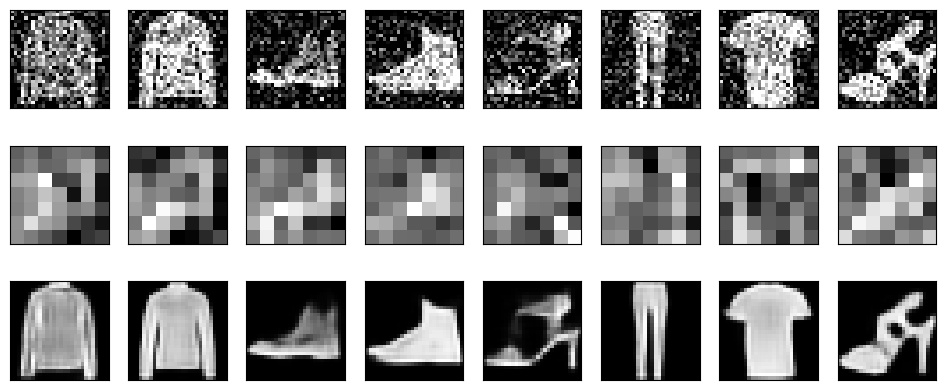

In [ ]:
display_results(test_images, encoded_images, reconstructed_images, enc_shape=(7,7))

### Anomaly Detection

**Reference:** [Intro to Autoencoders - TensorFlow official documentation](https://www.tensorflow.org/tutorials/generative/autoencoder#third_example_anomaly_detection)

* Train an AutoEncoder on normal data
* Define a $threshold$ for normal behavior$ $
    * Use the same type of loss function as training
    * Recostructed all the normal data using the *trained* AutoEncoder
    * Compute the loss on reconstructed normal data
    * Define the boundary outside which the loss for the reconstructed input would be considered anomalous:  
        * $Loss_{train} = Loss_{trained-AutoEncoder}(normal-data)$   
        * $threshold = 𝔼[Loss_{train}] + 1 * \sigma{[Loss_{train}]}$
* Create an anomaly detector:
    * Trained AutoEncoder that takes input and recostructs it
    * Loss function (same as above) to computes the loss on reconstructed input
    * Comparison with the defined threshold (Yes/No)
* Evaluate the anomaly detector using classification metrics

In [ ]:
# Code source: Intro to Autoencoders - TensorFlow official documentation
# Link: https://www.tensorflow.org/tutorials/generative/autoencoder#third_example_anomaly_detection

In [ ]:
import os
import shutil
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score

import tensorflow as tf
import tensorflow_datasets as tfds

In [ ]:
def plot_original(signal, title):
    length = len(signal)
    plt.figure(figsize=(8, 3))
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.plot(np.arange(length), signal)
    plt.grid(True)
    plt.title(title)
    plt.show()

def plot_original_and_reconstructed(original_data, reconstructed_data, title):
    plt.figure(figsize=(8, 4))
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.plot(original_data)
    plt.plot(reconstructed_data)
    plt.fill_between(np.arange(140), reconstructed_data, original_data, color='lightgray')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    plt.grid(True)
    plt.title(title)
    plt.show()

def histplot_loss(loss, title):
    plt.figure(figsize=(6, 3))
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.hist(loss[None,:], bins=50)
    plt.xlabel(title)
    plt.ylabel("No. of examples")
    plt.show()

In [ ]:
# download the dataset
df = pd.read_csv('http://storage.googleapis.com/download.tensorflow.org/data/ecg.csv', header=None)
raw_data = df.values

# last elements as labels
labels = raw_data[:, -1]
data = raw_data[:, 0:-1]

# split the data
train_data, test_data, train_labels, test_labels = train_test_split(
    data, labels, test_size=0.2, random_state=21)

# normalize the data to [0,1]
min_val = tf.reduce_min(train_data)
max_val = tf.reduce_max(train_data)

train_data = (train_data - min_val) / (max_val - min_val)
test_data = (test_data - min_val) / (max_val - min_val)

train_data = tf.cast(train_data, tf.float32)
test_data = tf.cast(test_data, tf.float32)

# divide into normal and anomalous
train_labels = train_labels.astype(bool)
test_labels = test_labels.astype(bool)

normal_train_data = train_data[train_labels]
normal_test_data = test_data[test_labels]

anomalous_train_data = train_data[~train_labels]
anomalous_test_data = test_data[~test_labels]

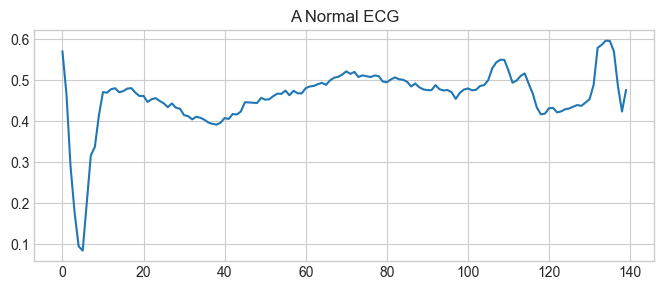

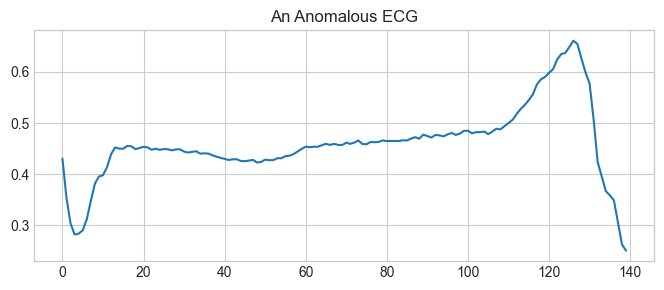

In [ ]:
plot_original(normal_train_data[0], "A Normal ECG")
plot_original(anomalous_train_data[0], "An Anomalous ECG")

In [ ]:
class AnomalyDetector(tf.keras.Model):
    def __init__(self):
        super(AnomalyDetector, self).__init__()
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.Dense(32, activation="relu"),
            tf.keras.layers.Dense(16, activation="relu"),
            tf.keras.layers.Dense(8, activation="relu")])

        self.decoder = tf.keras.Sequential([
            tf.keras.layers.Dense(16, activation="relu"),
            tf.keras.layers.Dense(32, activation="relu"),
            tf.keras.layers.Dense(140, activation="sigmoid")])

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [ ]:
# Load TensorBoard
%load_ext tensorboard
try:
    shutil.rmtree('./logs/')
except:
    pass
log_dir = "YOUR-LOCAL-PATH/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
autoencoder = AnomalyDetector()
autoencoder.compile(optimizer='adam', loss='mae')
history = autoencoder.fit(normal_train_data,
                          normal_train_data,
                          epochs=20,
                          batch_size=512,
                          validation_data=(test_data, test_data),
                          shuffle=True,
                          callbacks=[tensorboard_callback])

Epoch 1/20
5/5 [==============================] - 1s 67ms/step - loss: 0.0583 - val_loss: 0.0535
Epoch 2/20
5/5 [==============================] - 0s 24ms/step - loss: 0.0564 - val_loss: 0.0520
Epoch 3/20
5/5 [==============================] - 0s 25ms/step - loss: 0.0540 - val_loss: 0.0501
Epoch 4/20
5/5 [==============================] - 0s 24ms/step - loss: 0.0505 - val_loss: 0.0489
Epoch 5/20
5/5 [==============================] - 0s 24ms/step - loss: 0.0465 - val_loss: 0.0469
Epoch 6/20
5/5 [==============================] - 0s 26ms/step - loss: 0.0425 - val_loss: 0.0445
Epoch 7/20
5/5 [==============================] - 0s 24ms/step - loss: 0.0385 - val_loss: 0.0425
Epoch 8/20
5/5 [==============================] - 0s 24ms/step - loss: 0.0347 - val_loss: 0.0410
Epoch 9/20
5/5 [==============================] - 0s 25ms/step - loss: 0.0315 - val_loss: 0.0398
Epoch 10/20
5/5 [==============================] - 0s 24ms/step - loss: 0.0291 - val_loss: 0.0388
Epoch 11/20
5/5 [============

In [ ]:
# add specific directory to path e.g., 20251006-102139
# If doesn't load use: http://localhost:6010
%tensorboard --logdir "YOUR-LOCAL-PATH/logs/fit/20251006-102139" --port 6010

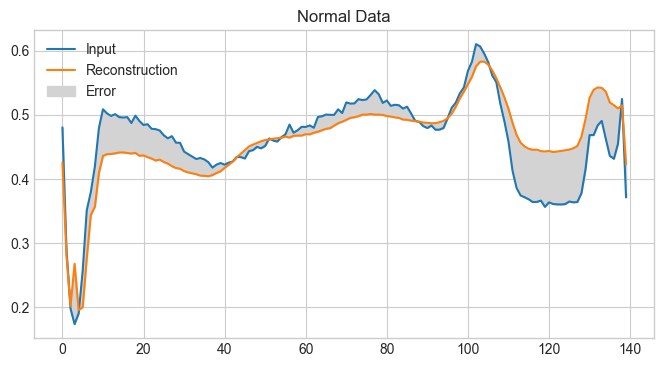

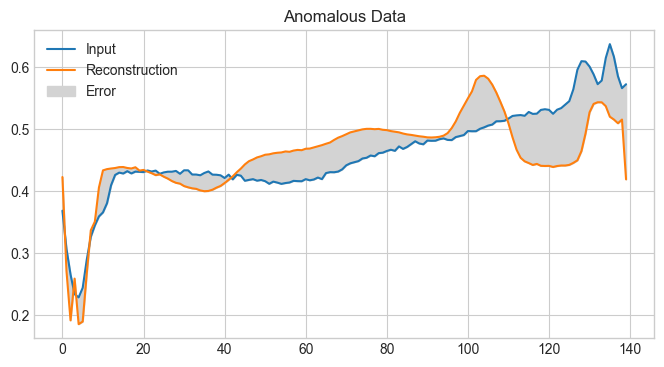

In [ ]:
normal_decoded = autoencoder(normal_test_data).numpy()
anomalous_decoded = autoencoder(anomalous_test_data).numpy()

plot_original_and_reconstructed(normal_test_data[0], normal_decoded[0], "Normal Data")
plot_original_and_reconstructed(anomalous_test_data[0], anomalous_decoded[0], "Anomalous Data")

14/14 [==============================] - 0s 847us/step


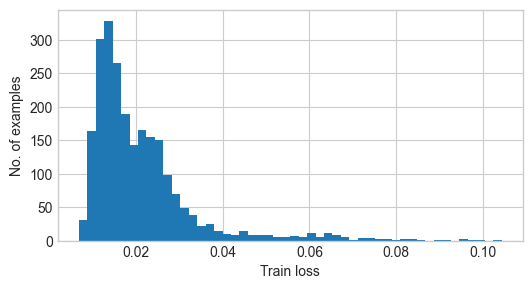

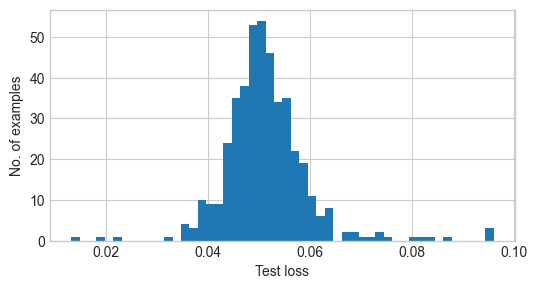

In [ ]:
normal_reconstructions = autoencoder.predict(normal_train_data)
anomalous_reconstructions = autoencoder.predict(anomalous_test_data)

train_loss = tf.keras.losses.mae(normal_reconstructions, normal_train_data)
test_loss = tf.keras.losses.mae(anomalous_reconstructions, anomalous_test_data)

histplot_loss(train_loss, "Train loss")
histplot_loss(test_loss, "Test loss")

In [ ]:
threshold = np.mean(train_loss) + np.std(train_loss)
print("Threshold: {:.4f}".format(threshold))

Threshold: 0.0334


Classify an ECG as an anomaly if the reconstruction error is greater than the threshold.

In [ ]:
def detect(model, data, threshold):
  reconstructions = model(data)
  loss = tf.keras.losses.mae(reconstructions, data)
  return tf.math.less(loss, threshold)

def print_stats(predictions, labels):
  print("Accuracy = {}".format(accuracy_score(labels, predictions)))
  print("Precision = {}".format(precision_score(labels, predictions)))
  print("Recall = {}".format(recall_score(labels, predictions)))

In [ ]:
preds = detect(autoencoder, test_data, threshold)
print_stats(preds, test_labels)

Accuracy = 0.945
Precision = 0.9922027290448343
Recall = 0.9089285714285714


### Introduction to Transformers

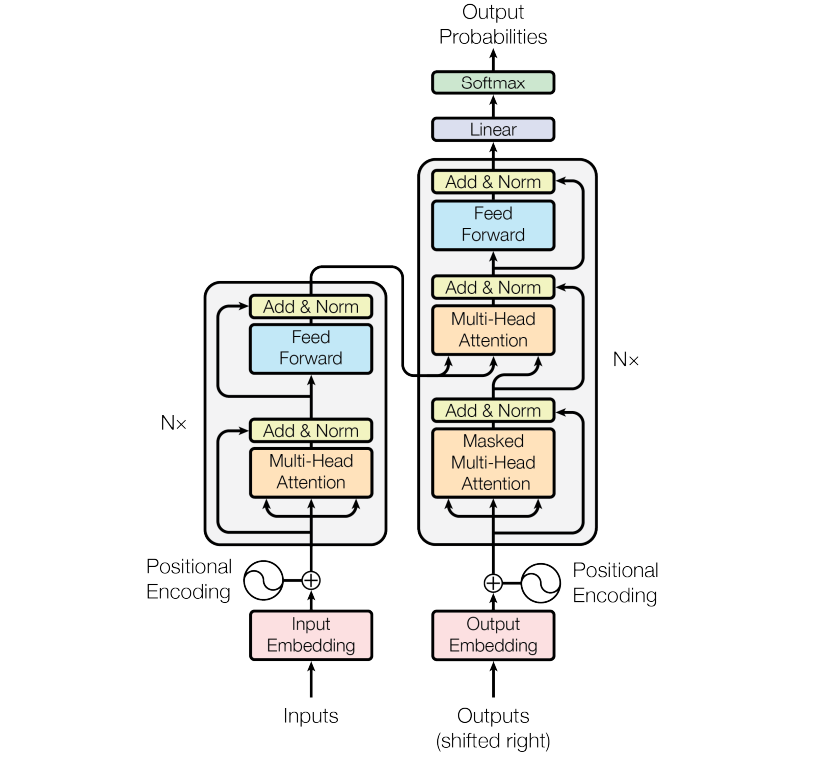

Image source: [Attention Is All You Need](https://arxiv.org/pdf/1706.03762)

**Self-Attention - Intuition**:  
* Learn three parallel, independent linear projections from the input ($W_{Query}, W_{Key}, W_{Value}$) to generate the components (**Query, Key, Value**) needed to implement soft-search in a content-based setting.

* Soft-search standpoint:
    * Value: Word embeddings from the input sequence tokens stacked horizontally
    * Query × Key:
        * Gives the similarity of two vectors (dot product)
        * Scaling the dot product
        * (plus softmax) Constructs correlation matrix of input sequence
        * This product serves as the weights for (importance level of) each column vector/word embedding (columns of Value)  

        **$QK^T$ → Scaling → Normalization (Softmax) → Weights: Importance level for columns of V**  

        $$
        \text{Attention}(Q, K, V) = \text{softmax}\left( \frac{QK^\top}{\sqrt{d_k}} \right) V
        $$

* Multi-head self-attention:
    * Learning several representations for the relationship between Q, K, and V

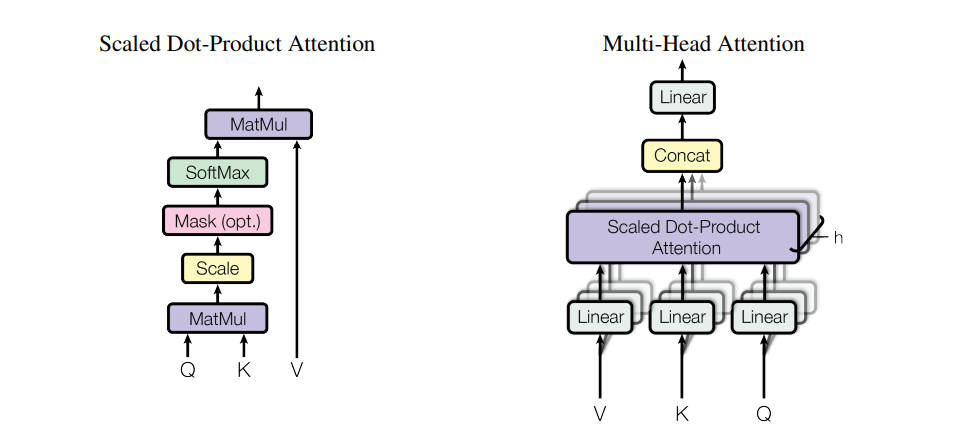


Image source: [Attention Is All You Need](https://arxiv.org/pdf/1706.03762)

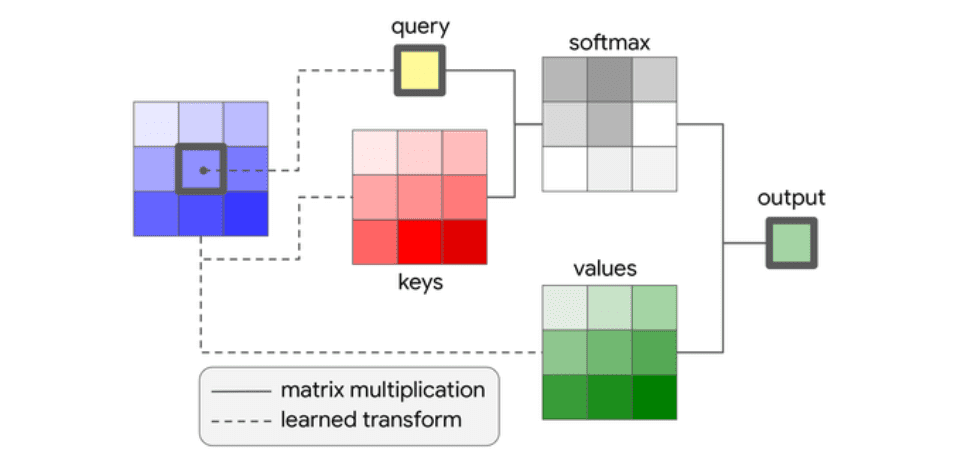

Image source: [How Positional Embeddings work in Self-Attention (code in Pytorch) | AI Summer](https://www.google.com/url?sa=i&url=https%3A%2F%2Ftheaisummer.com%2Fpositional-embeddings%2F&psig=AOvVaw0T7rzGUZLPE0UG14limssR&ust=1726349261774000&source=images&cd=vfe&opi=89978449&ved=0CBQQjhxqFwoTCOjz_6fuwIgDFQAAAAAdAAAAABAZ)

**Masked Self-Attention - Intuition**:  
* Mask Value i.e., set the future states (upper triangle in Attention Scores: $QK^T$) to `-inf` that means block the backwards flow of information ($x_1$ ← $x_2$)
    * `-inf` so that after softmax it becomes zero
* Learn three streams (**Query, Key, Value**) for the masked Attention Scores (learn the forward logic or structure of the sequence for generation purposes)
    * Equivalent to shifting the target sequence one position to the right by prepending a `<start>` token to it. When done simultaneously, takes the form of masked upper triangle


**Transformers - Intuition**:
* Encoder:  
    * Take input from one language (source sequence)
    * Learn three parallel, independent linear projections from the input ($W_{Query}, W_{Key}, W_{Value}$) to generate the components (**Query, Key, Value**) needed to implement soft-search in a content-based setting.
* Decoder:
    * Take translation (target sequence)
    * Query, Key, Value from the output sequence by just looking at the past not the future/next words (masked self-attention) - Learn the logic behind the forward flow of information (the right logic for generative purposes)
    * Take the structure/syntax of source sequence into account while generating output (cross-attention)

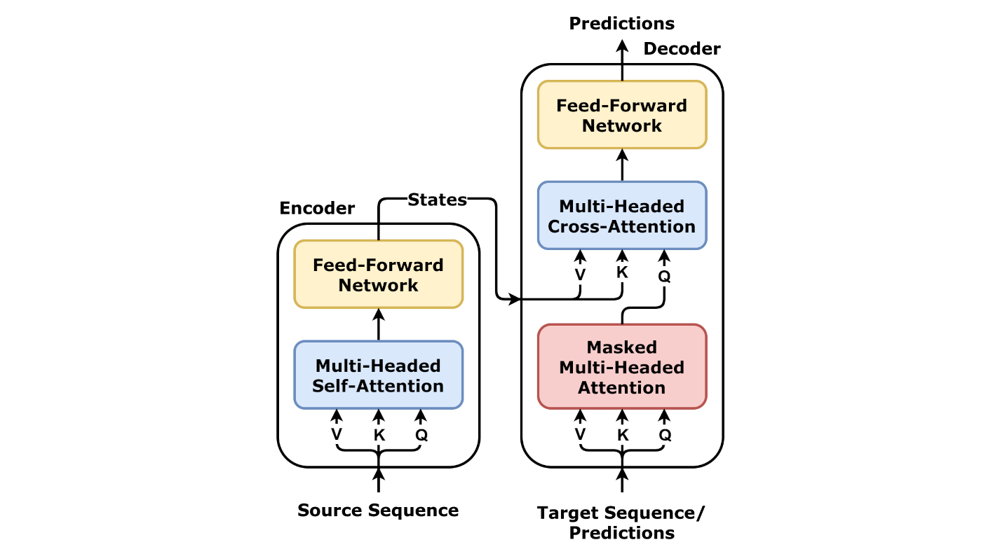

Image source: [Wikipedia - Transformer (deep learning architecture)](https://en.wikipedia.org/wiki/Transformer_(deep_learning_architecture))

Read more:
* [The math behind Attention: Keys, Queries, and Values matrices](https://www.youtube.com/watch?v=UPtG_38Oq8o&t=912s)  
* [Attention? Attention!](https://lilianweng.github.io/posts/2018-06-24-attention/)
* [Transformers: The Nuts and Bolts](https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.revistek.com%2Fposts%2Ftransformer-architecture&psig=AOvVaw2B0mRx-Ai2EvuUGE5ZWDjc&ust=1725743755367000&source=images&cd=vfe&opi=89978449&ved=0CBcQjhxqFwoTCMCMy86er4gDFQAAAAAdAAAAABBb)

## $4.$ Model Development Workflow

### $1.$ Understand Problem & Select Metrics

Reference: [Machine Learning Crash Course - Classification](https://developers.google.com/machine-learning/crash-course)

* **Classification Metrics**:  $ $
    * **Accuracy**: $\frac{Correctly \ classified}{Total \ classified \ examples}$     
    * **Precision (probability of detection)**: $\frac{TP}{TP + FP}$ Given a threshold, model's positive classification that are actually positive divided by model's total positive classifications (predictions)
    * **Recall**: $\frac{TP}{TP + FN}$ Given a threshold, model's positive classification that are actually positive divided by total actual positives (ground truth)  
    * **F1 Score**: Given a threshold, the *harmonic mean* of precision and recall. Read more [here](https://developers.google.com/machine-learning/crash-course/classification/accuracy-precision-recall).
    * **Receiver-Operating Characteristic Curve (ROC)**: TPR vs FPR. A visual representation of model performance across all *thresholds*  
    * **Area Under the Curve (AUC)**: Represents the probability that the model, if given a randomly chosen positive and negative example, will rank the positive higher than the negative. Read more [here](https://developers.google.com/machine-learning/crash-course/classification/roc-and-auc).  


* **Choice of Classification Metric and Tradeoffs**  
The metric(s) you choose to prioritize when evaluating the model and choosing a threshold depend on the costs, benefits, and risks of the specific problem. Read more [here](https://developers.google.com/machine-learning/crash-course/classification/accuracy-precision-recall).  
    * **Accurary**:
        * Use as a rough indicator of model training progress/convergence for balanced datasets
        * For model performance, use only in combination with other metrics
        * Avoid for imbalanced datasets. Consider using another metric
    * **Recall** (True positive rate):
        * Use when false negatives are more expensive than false positives
    * **False positive rate**:  
        * Use when false positives are more expensive than false negatives
    * **Precision**:
        * Use when it's very important for positive predictions to be accurate
    

* **Comparing Performance of Classification Models**:  
    * Balanced dataset: AUC  
    * Imbalanced dataset: [Area Under the Precision-Recall Curve (PR AUC)](https://developers.google.com/machine-learning/crash-course/classification/roc-and-auc#expandable-1)   



* **Prediction Bias in Classification**:  
Prediction bias is the difference between the mean of a model's predictions and the mean of ground-truth labels in the data. A model trained on a dataset where 5% of the emails are spam should predict, on average, that 5% of the emails it classifies are spam. In other words, the mean of the labels in the ground-truth dataset is 0.05, and the mean of the model's predictions should also be 0.05. Read more [here](https://developers.google.com/machine-learning/crash-course/classification/prediction-bias).


* **Regression Metrics**: $ $  
    * Mean Squared Error (MSE)
    * Root Mean Squared Error (RMSE)
    * Mean Absolute Error (MAE)  
    * $R^2$  

    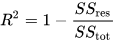

    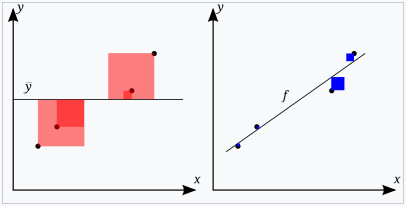

    Source: [Wikipedia](https://en.wikipedia.org/wiki/Coefficient_of_determination)

### $2.$ Build Model

**Reference**: [Deep Learning Specialization](https://www.coursera.org/specializations/deep-learning#courses)

* **Prepare Data  $ $**
    1. Exploratory Data Analysis (EDA) → Normalize at the absolute least!
        1. Understand data distribution
        2. Clean data
        3. Transform data
        4. Gain deeper insights
    2. Split the data
        * Classical $70-30$% (`train-test`) or $60-20-20$% (`train-dev-test`)
        * Big data:
            * $98-1-1$%
            * $99.5-0.4-0.1$%


* **Understand Bias and Variance**
    * Bias:  `train` set error
    * Variance:  Diff. between `train` set error and `dev` set error  



* **Speed Up Training**
    * Use graph-mode execution (AutoGrap)
    * Set up distributed training (if applicable)



* **Follow the Basic Recipe $ $**(according to Andrew Ng):  
    1. Deal with bias first:
        * If high:
            * Use bigger network
            * Train longer
            * Search for better architectures
    2. Then, deal with variance:
        * If high:
            * Get more data
            * Regularization
                * $L_2$ (or $L_1$) regularization  
                * Dropout  
                * Data augmentation  
                * Early stopping (couples bias and variance, not recommended!)  
                * Batch Normalization (*has a slight regularizing effect*)  
                    * Each mini-batch is scaled by the mean and variance computed on just that mini-batch  
                    * Applied to each layer of network independently  
            * Search for better architectures

##
---

## Sandbox

In [ ]:
# Practice here
